# Forecasting Inflation Using LSTM and Autoencoders

# To Do

1) As séries de PMI do ISM foram retiradas da base do FRED - encontrar alternativa.

2) Séries trimestrais ainda não foram incorporadas na modelagem.

3) Inflação implícita.

4) Confirmar efetivamente quais séries de dados estão sendo utilizadas e comparadas com as planilhas contendo as descrições das séries.

5) Cross validation - importante para alguns modelos. Ver k-fold cross validation para os modelos de machine learning. 

# Modelos a Testar

1) Markov regime switching

2) Filtro de Kalman

3) Bayesian VAR

4) Support Vector Regression

5) ARFIMA

6) Algum com threshold

7) Perceptron

8) Variações do LSTM

9) Variações do autoencoder

10) GARCH

11) UCSV

12) Least Trimmed Squares c/ PCA

# Nota sobre as Bases

A base FRED_MD_2020_04_Full contém todas as séries disponibilizadas pelo FRED e as séries de PMI. A base que estamos utilizando exclui uma série (ACOGNO) que possui somente histórico recente. Com sua exclusão, é possível iniciar a análise em 01/01/1978.

## Libraries

In [1]:
# R Path - required by rpy2 prior to importing libraries
import os
os.environ["R_HOME"] = "D:\R-4.0.2"

In [306]:
# Basics
import numpy as np
import pandas as pd
import scipy as sp
from scipy import stats
from datetime import datetime

# Data
from pandas_datareader.data import DataReader

# R
import rpy2.robjects as robjects
from rpy2.robjects.packages import importr
from rpy2.robjects import r, DataFrame, FloatVector
from rpy2.robjects import pandas2ri

# Kalman Filter
from pykalman import KalmanFilter

# Wavelets
import pywt

# Machine Learning - tensorflow and keras
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers
from keras.models import Sequential, Model
from keras.layers import Input, Dense, LSTM

# SKLearn Models
from sklearn.linear_model import Ridge, RidgeCV
from sklearn.linear_model import Lasso, LassoCV
from sklearn.linear_model import ElasticNetCV
from sklearn.linear_model import BayesianRidge
from sklearn.ensemble import RandomForestRegressor
from sklearn.ensemble import BaggingRegressor
from sklearn.tree import export_graphviz
from sklearn.model_selection import train_test_split
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import RepeatedKFold
from sklearn.metrics import mean_squared_error
from sklearn.preprocessing import scale 
from sklearn.preprocessing import MinMaxScaler
from sklearn.decomposition import PCA
from sklearn.svm import SVR
from sklearn.pipeline import make_pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.datasets import make_regression

# Statsmodels
import statsmodels.api as sm
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
from statsmodels.tsa.stattools import adfuller 
from statsmodels.tsa.statespace.sarimax import SARIMAX 
from statsmodels.stats.diagnostic import acorr_ljungbox 
from statsmodels.stats.diagnostic import het_arch

# Plots
from matplotlib import pyplot as plt
from matplotlib import dates as md
import seaborn as sns
from matplotlib.ticker import PercentFormatter

# Misc
import pydot
import warnings

## Constants and Parameters

In [3]:
# Folders and worksheet names
str_Dir_Plan_FRED = 'D:/Estudos/2 Mestrado/Insper/Dissertação/Dados/'
str_Nome_Plan_FRED_MD = 'FRED_MD_2020_04'
str_Nome_Plan_FRED_QD = 'FRED_QD_2020_04'
str_Nome_Plan_FRED_MD_Desc = 'Data_Description_MD'
str_Nome_Plan_FRED_QD_Desc = 'Data_Description_QD'

In [4]:
# How to display plots
%matplotlib inline 
plt.rcParams['figure.dpi'] = 200 # Plot resolution (dpi)

In [5]:
# Required to convert datatypes from Python to R and vice-versa
pandas2ri.activate()

In [6]:
# Remove warnings
warnings.filterwarnings('ignore')

In [7]:
# Color style (plots)
sns.set(color_codes = True)

In [8]:
# Statistical significance for hypothesis testing
alfa = 0.05

In [9]:
# Random state (used to split samples into training and test samples)
rnd_state = 20

In [10]:
# Test size (share of observations used to build the test sample)
share_test_size = 0.25

In [11]:
# Number of lags considered when splitting the data
n_lags = 12

## Auxiliary Functions

In [12]:
# Split a univariate sequence into samples
def split_sequence_uni(sequence, n_steps):
    X, y = list(), list()
    for i in range(len(sequence)):
        # find the end of this pattern
        end_ix = i + n_steps
        # check if we are beyond the dataset
        if end_ix > len(sequence)-1:
            break
        # gather input and output parts of the pattern
        seq_x, seq_y = sequence[i:end_ix], sequence[end_ix]
        X.append(seq_x)
        y.append(seq_y)
    return np.array(X), np.array(y)

In [13]:
# Split a multivariate sequence into samples
def split_sequence_mult(sequences, n_steps):
    X, y = list(), list()
    for i in range(len(sequences)):
        # find the end of this pattern
        end_ix = i + n_steps
        # check if we are beyond the dataset
        if end_ix > len(sequences):
            break
        # gather input and output parts of the pattern
        seq_x, seq_y = sequences[i:end_ix, :-1], sequences[end_ix-1, -1]
        X.append(seq_x)
        y.append(seq_y)
    return np.array(X), np.array(y)

In [453]:
# Kalman filter regression
# If EM = True, then EM algorithm is used for estimation
# delta is related to the variance of the betas. Delta -> 1 makes betas more volatile, which may lead to overfitting.
# However, delta -> 0 may increase the MSE.

def KFReg(X, y, delta, obs_cov, init_mean, init_cov, EM = False):
    n_features = X.shape[1]
    obs_mat = X[:, np.newaxis, :]
    if EM == False:
        trans_cov = (delta/(1 - delta))*np.eye(n_features)
        kf = KalmanFilter(n_dim_obs = 1, n_dim_state = n_features, 
                          initial_state_mean = init_mean,
                          initial_state_covariance = init_cov,
                          transition_matrices = np.eye(n_features),
                          observation_matrices = obs_mat,
                          observation_covariance = obs_cov,
                          transition_covariance = trans_cov)
        state_means, state_covs = kf.filter(y)
    else:
        kf = KalmanFilter(n_dim_obs = 1, n_dim_state = n_features, 
                          initial_state_mean = init_mean, 
                          initial_state_covariance = init_cov,
                          observation_matrices = obs_mat)
    state_means, state_covs = kf.em(y).filter(y)
    return state_means, state_covs, kf

In [427]:
X, y = make_regression(n_samples=100, n_features=20, n_informative=20, noise = 0.1, random_state = rnd_state)

In [444]:
state_means, state_covs, kf = KFReg(X, y, delta = 1e-2, obs_cov = np.array(0.25), 
      init_mean = np.zeros(20), init_cov = np.eye(20), 
      em = True)

In [436]:
state_means.shape

(100, 20)

In [437]:
X.shape

(100, 20)

In [445]:
np.diag(np.matmul(X, state_means.T))

array([-347.91896867, -338.94385539,   80.4263501 , -165.49952012,
        387.77866684, -120.95116969, -651.64725366,  620.27185915,
        117.75344126, -140.33403217,   64.61258755,  453.42299176,
       -129.65954778,   63.43369305,  176.75284258, -294.00200608,
        -53.82998384, -152.97510059,  -78.61225974,   80.4567612 ,
        265.47440984,  -94.98653233, -550.26273617,  119.25108167,
        229.04350245,  339.48482295, -105.17148584,  144.39297937,
        187.63650436, -199.85760217, -375.25610252,  234.73273892,
        277.30217727, -154.75239168,  304.36121703,  345.74480198,
       -172.96482723, -483.74874347, -249.16207895, -221.08639819,
          2.73659714, -282.40583699, -149.79570548, -163.07931141,
       -187.28023858, -311.35747287, -234.70715744,  287.74460097,
        402.97380912,    7.26101054,  184.80488655, -126.66712583,
        112.50130383,  -80.07359915, -491.71072857, -227.27342718,
        104.53833327,  255.50301493,   55.12799505,   27.47046

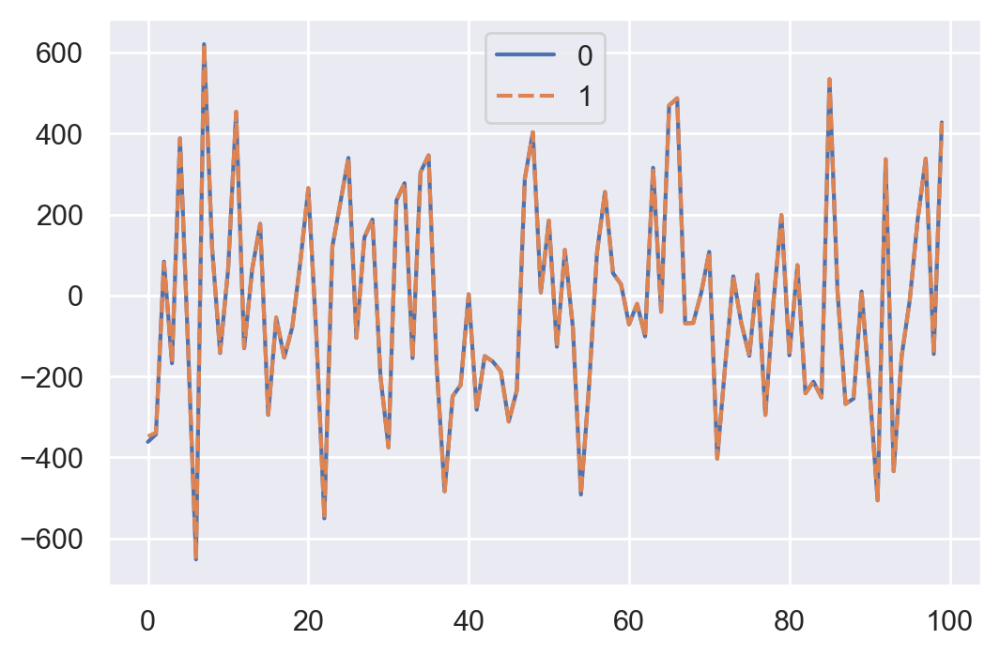

In [446]:
sns.lineplot(data=[y,np.diag(np.matmul(X, state_means.T))])

## Data

### US Recessions

In [14]:
usrec = DataReader('USREC', 'fred', start=datetime(1947, 1, 1), end=datetime(2019, 4, 1))

### FRED - Monthly Database

In [15]:
df_FRED_MD = pd.read_csv(filepath_or_buffer = str_Dir_Plan_FRED + str_Nome_Plan_FRED_MD + '.csv', sep = ';')
df_FRED_MD.index = pd.to_datetime(df_FRED_MD.iloc[:,0])
df_FRED_MD = df_FRED_MD.drop(columns = 'Date')
df_FRED_MD.head()

,RPI,W875RX1,DPCERA3M086SBEA,CMRMTSPLx,RETAILx,INDPRO,IPFPNSS,IPFINAL,IPCONGD,IPDCONGD,...,DTCTHFNM,INVEST,VXOCLSx,NAPMPI,NAPMEI,NAPM,NAPMNOI,NAPMSDI,NAPMII,NAPMPRI
Date,,,,,,,,,,,,,,,,,,,,,
1978-01-01,5323.379,4712.6,36.542,549039.188,63558.14895,49.2066,51.2255,48.9661,67.4149,55.1122,...,37341.0,232.6858,15.9983,57.7,55.1,57.4,60.6,55.6,54.0,71.1
1978-02-01,5347.188,4737.4,37.075,561630.607,65058.86924,49.4502,51.8148,49.7127,68.4977,56.4858,...,37346.0,233.8456,15.6033,54.6,52.8,55.9,56.2,63.4,54.0,74.4
1978-03-01,5377.624,4766.9,37.445,567270.091,66663.30206,50.3928,53.0148,50.9869,69.8593,58.2079,...,37600.0,236.1659,14.9447,57.0,52.9,55.0,56.6,58.9,44.0,72.3
1978-04-01,5408.475,4805.1,37.671,584456.362,68327.88814,51.4368,53.6273,51.5922,70.3663,59.3855,...,38156.0,238.8215,20.2351,60.3,53.8,57.7,60.2,57.1,52.4,78.7
1978-05-01,5414.640,4807.0,37.821,583900.411,68766.59214,51.6276,53.5525,51.4433,69.8804,58.4376,...,38954.0,236.7878,17.5887,62.3,57.0,60.2,63.9,57.4,54.5,81.8


In [16]:
df_FRED_MD.tail()

,RPI,W875RX1,DPCERA3M086SBEA,CMRMTSPLx,RETAILx,INDPRO,IPFPNSS,IPFINAL,IPCONGD,IPDCONGD,...,DTCTHFNM,INVEST,VXOCLSx,NAPMPI,NAPMEI,NAPM,NAPMNOI,NAPMSDI,NAPMII,NAPMPRI
Date,,,,,,,,,,,,,,,,,,,,,
2019-08-01,16998.856,14092.3,121.340,1524456.0,526862.0,109.8543,104.7136,103.4219,105.4508,122.1578,...,736714.08,3727.8034,21.0968,49.5,47.4,48.8,47.2,51.4,49.9,46.0
2019-09-01,17036.522,14120.7,121.554,1524004.0,524651.0,109.4725,104.1079,102.6120,104.7193,118.6785,...,734464.35,3789.7854,16.3081,47.3,46.3,48.2,47.3,51.1,46.9,49.7
2019-10-01,17025.574,14104.7,121.636,1516842.0,526420.0,109.0270,103.8258,102.3343,104.6534,115.3873,...,735186.04,3799.2602,15.9863,46.3,47.9,48.5,48.9,50.1,49.4,45.5
2019-11-01,17089.809,14168.0,121.924,1524806.0,527518.0,110.0525,105.3040,104.2220,106.7609,122.9304,...,735066.26,3833.3041,12.6423,48.0,46.8,48.1,46.8,51.7,47.2,46.7
2019-12-01,17074.532,14160.2,122.045,1524499.0,527646.0,109.6151,104.6565,103.3332,105.5327,119.8277,...,735479.22,3827.0547,13.3469,44.8,45.2,47.8,47.6,52.2,49.2,51.7


### FRED - Quarterly Database

In [17]:
df_FRED_QD = pd.read_csv(filepath_or_buffer = str_Dir_Plan_FRED + str_Nome_Plan_FRED_QD + '.csv', sep = ';')
df_FRED_QD.index = pd.to_datetime(df_FRED_QD.iloc[:,0])
df_FRED_QD = df_FRED_QD.drop(columns = 'Date')
df_FRED_QD.head()

,GDPC1,PCECC96,PCDGx,PCESVx,PCNDx,GPDIC1,FPIx,Y033RC1Q027SBEAx,PNFIx,PRFIx,...,TLBSNNBx,TLBSNNBBDIx,TABSNNBx,TNWBSNNBx,TNWBSNNBBDIx,CNCFx,S&P 500,S&P: indust,S&P div yield,S&P PE ratio
Date,,,,,,,,,,,,,,,,,,,,,
1959-03-01,3121.936,1923.675,76.6269,1228.2525,708.5994,340.604,340.5050,49.2784,169.8803,229.2229,...,315394.42,267125.60,2292473.50,1977.08,1674.50,118.0697,55.5167,59.1400,3.1765,18.6211
1959-06-01,3192.380,1953.384,79.5107,1246.6236,714.4575,367.099,351.0348,50.7534,174.7639,237.2364,...,327311.61,273793.60,2300611.00,1973.30,1650.65,119.5468,57.5067,61.5867,3.1012,19.2899
1959-09-01,3194.653,1973.791,81.0481,1263.5122,717.2159,343.391,354.7551,52.4063,179.4710,232.7918,...,335783.49,275597.47,2300263.79,1964.48,1612.37,121.8384,58.7300,63.0600,3.0720,18.9544
1959-12-01,3203.759,1976.014,77.1760,1278.8229,721.6332,354.567,350.6404,52.3002,178.9702,226.2014,...,330686.41,255408.94,2294995.96,1964.31,1517.15,129.4733,57.7633,62.0200,3.1572,17.8221
1960-03-01,3275.757,1994.918,79.6590,1290.4392,723.4440,390.210,362.3523,54.1198,185.1905,233.1615,...,343374.65,279155.40,2316167.88,1972.79,1603.83,123.0048,56.2767,60.1933,3.3850,16.8284


In [18]:
df_FRED_QD.tail()

,GDPC1,PCECC96,PCDGx,PCESVx,PCNDx,GPDIC1,FPIx,Y033RC1Q027SBEAx,PNFIx,PRFIx,...,TLBSNNBx,TLBSNNBBDIx,TABSNNBx,TNWBSNNBx,TNWBSNNBBDIx,CNCFx,S&P 500,S&P: indust,S&P div yield,S&P PE ratio
Date,,,,,,,,,,,,,,,,,,,,,
2018-12-01,18783.548,13066.302,1705.2479,8462.1346,2938.9272,3429.477,3322.9119,1279.1699,2735.8068,593.0723,...,7620593.13,398935.93,19188610.06,11568.02,605.58,1910.2298,2692.0000,3625.8467,1.9820,22.3811
2019-03-01,18927.281,13103.317,1706.3378,8482.6008,2954.6374,3481.088,3349.3114,1278.8561,2765.5477,591.5122,...,7734161.84,399732.21,19501635.99,11767.47,608.19,1934.8358,2722.0767,3668.4667,2.0053,21.6410
2019-06-01,19021.860,13250.040,1759.3088,8540.8749,3001.2841,3424.653,3337.2745,1281.5136,2758.5558,587.0884,...,7766959.25,392693.84,19728176.31,11961.22,604.75,1977.8663,2882.8933,3892.4500,1.9322,21.9386
2019-09-01,19121.112,13353.121,1793.8927,8587.3728,3029.9919,3416.180,3330.3389,1269.2974,2742.6664,593.7906,...,7866182.84,388971.84,20002458.62,12136.28,600.12,2022.3014,2958.5900,3994.6867,1.9216,22.0320
2019-12-01,19221.970,13413.811,1806.1421,8638.6406,3025.7527,3363.398,3325.7749,1255.5549,2725.7435,603.2014,...,7964625.43,389233.63,20114962.17,12150.34,593.79,2046.2326,3086.4433,4164.2800,1.8771,22.8262


### Data Label

In [19]:
df_FRED_Desc_MD = pd.read_csv(filepath_or_buffer = str_Dir_Plan_FRED + str_Nome_Plan_FRED_MD_Desc + '.csv', sep = ';')
df_FRED_Desc_MD = df_FRED_Desc_MD.drop(columns = 'Index')
df_FRED_Desc_MD.head()

,Group,ID,Transformation,FRED,Description,Frequency
0,Output and Income,1,First difference of log,RPI,Real Personal Income,Monthly
1,Output and Income,2,First difference of log,W875RX1,Real Personal Income ex Transfer Receipts,Monthly
2,Output and Income,6,First difference of log,INDPRO,IP Index,Monthly
3,Output and Income,7,First difference of log,IPFPNSS,IP - Final Products and Nonindustrial Supplies,Monthly
4,Output and Income,8,First difference of log,IPFINAL,IP - Final Products (Market Group),Monthly


In [20]:
df_FRED_Desc_MD.tail()

,Group,ID,Transformation,FRED,Description,Frequency
130,Stock Market,80*,First difference of log,S&P 500,S&P’s Common Stock Price Index: Composite,Monthly
131,Stock Market,81*,First difference of log,S&P: indust,S&P’s Common Stock Price Index: Industrials,Monthly
132,Stock Market,82*,First difference,S&P div yield,Dividend yield S&P’s Composite Common Stock: D...,Monthly
133,Stock Market,83*,First difference of log,S&P PE ratio,PE ratio S&P’s Composite Common Stock: Price-E...,Monthly
134,Stock Market,135*,No transformation,VXOCLSx,VXO - S&P 100 Volatility Index,Monthly


### Descriptive Statistics

In [21]:
df_FRED_MD.describe()

,RPI,W875RX1,DPCERA3M086SBEA,CMRMTSPLx,RETAILx,INDPRO,IPFPNSS,IPFINAL,IPCONGD,IPDCONGD,...,DTCTHFNM,INVEST,VXOCLSx,NAPMPI,NAPMEI,NAPM,NAPMNOI,NAPMSDI,NAPMII,NAPMPRI
count,504.000000,504.000000,504.000000,5.040000e+02,504.000000,504.000000,504.000000,504.000000,504.000000,504.000000,...,504.000000,504.000000,504.000000,504.000000,504.000000,504.000000,504.000000,504.000000,504.000000,504.000000
mean,10361.589337,8832.308730,74.250300,1.001947e+06,260279.730972,81.030427,84.992607,83.019699,92.584336,90.118879,...,444745.335159,1435.049792,19.811054,54.903571,48.914881,52.056548,54.700992,52.849206,46.178571,59.223016
std,3425.512334,2739.027815,25.443983,3.003804e+05,132136.197328,20.178667,18.683650,18.752887,15.156366,25.662074,...,303981.665255,1027.438278,7.595526,7.136147,6.610095,5.805136,7.504182,5.785716,5.132497,14.527380
min,5323.379000,4712.600000,36.542000,5.481519e+05,63558.148950,48.242400,51.225500,48.966100,64.495100,44.858500,...,37341.000000,232.685800,8.016400,26.300000,25.500000,29.400000,23.200000,29.800000,28.800000,18.000000
25%,7368.216250,6516.225000,52.061750,7.315367e+05,142368.262350,62.752175,69.595700,67.234875,80.558925,65.519500,...,159330.672500,544.443425,14.602700,51.300000,45.375000,49.300000,50.675000,49.700000,43.300000,48.700000
50%,10325.193500,8995.500000,72.937500,1.063173e+06,246699.000000,88.538100,93.893000,92.746650,99.803800,94.566750,...,377181.675000,1095.097300,18.129250,55.400000,49.700000,52.550000,55.400000,52.050000,46.200000,58.000000
75%,13140.890000,11103.000000,96.444500,1.270061e+06,367204.750000,99.914550,100.882700,99.556900,104.737975,115.438675,...,744984.140000,2248.840450,23.153400,59.900000,53.600000,56.100000,60.300000,56.125000,49.500000,70.500000
max,17089.809000,14168.000000,122.045000,1.524806e+06,527646.000000,110.551600,111.023800,108.641400,114.249000,125.766600,...,906492.750000,3833.304100,67.151000,80.600000,62.100000,69.900000,74.800000,75.600000,59.600000,93.100000


In [22]:
df_FRED_QD.describe()

,GDPC1,PCECC96,PCDGx,PCESVx,PCNDx,GPDIC1,FPIx,Y033RC1Q027SBEAx,PNFIx,PRFIx,...,TLBSNNBx,TLBSNNBBDIx,TABSNNBx,TNWBSNNBx,TNWBSNNBBDIx,CNCFx,S&P 500,S&P: indust,S&P div yield,S&P PE ratio
count,244.000000,244.000000,244.000000,244.000000,244.000000,244.000000,244.000000,244.000000,244.000000,244.000000,...,2.440000e+02,244.000000,2.440000e+02,244.000000,244.000000,244.000000,244.000000,244.000000,244.000000,244.000000
mean,9888.146057,6526.743865,553.141448,4406.452559,1664.178637,1509.192500,1487.122146,433.653420,1052.569813,451.379843,...,2.700421e+06,306713.846926,7.927599e+06,5227.178852,793.330410,814.504025,685.802445,854.366994,2.933309,18.875176
std,4788.696647,3398.593613,466.327920,2239.002402,665.663462,919.061225,898.254018,364.013178,756.058300,162.579984,...,2.199966e+06,67988.787710,4.871987e+06,2712.395458,288.834374,563.653110,743.937012,982.927228,1.115595,8.209365
min,3121.936000,1923.675000,74.458000,1228.252500,708.599400,313.843000,340.505000,49.151800,169.880300,207.459300,...,3.153944e+05,218070.520000,2.292474e+06,1964.310000,350.230000,118.069700,55.333300,58.670000,1.115600,6.860800
25%,5666.242250,3564.832250,187.830600,2394.473375,1095.612550,716.393750,697.714750,137.255700,403.098925,311.413650,...,9.878040e+05,262785.250000,4.192621e+06,3217.672500,592.842500,317.127150,99.268350,109.333325,1.958250,14.551450
50%,9204.950000,5893.869000,367.336150,4099.413850,1553.212100,1194.633500,1180.185900,265.505650,763.185250,429.396550,...,1.959997e+06,289063.580000,6.248178e+06,4360.890000,704.280000,651.931550,318.226650,372.483350,2.941400,18.442150
75%,14501.207000,9797.706000,955.288300,6521.524500,2316.756475,2276.661750,2269.801100,676.168075,1644.077225,552.318950,...,4.132158e+06,338041.365000,1.237283e+07,7003.655000,974.182500,1259.364900,1184.234975,1408.477500,3.508600,21.668950
max,19221.970000,13413.811000,1806.142100,8638.640600,3029.991900,3481.088000,3349.311400,1281.513600,2765.547700,894.502800,...,7.964625e+06,889590.800000,2.011496e+07,12150.340000,1674.500000,2046.232600,3086.443300,4164.280000,6.021900,82.897700


### Data Manipulation

Note: all series are seasonally adjusted.

In [23]:
# Data transformation according to McCraken and Ng (2016)
# Monthly database

qty_series = df_FRED_MD.shape[1]
df_FRED_MD_t = df_FRED_MD.copy()

for i in range(0,qty_series):
    str_transf = df_FRED_Desc_MD.iloc[i,2]
    str_ticker = df_FRED_Desc_MD.iloc[i,3]
    col_ticker = np.where(df_FRED_MD_t.columns == str_ticker)
    if len(col_ticker[0]) > 0:
        col_ticker = col_ticker[0][0]
        df_series = df_FRED_MD_t.iloc[:,col_ticker]
        if str_transf == "First difference of log":
            df_FRED_MD_t.iloc[:,col_ticker] = np.log(df_series).diff()
        elif str_transf == "First difference":
            df_FRED_MD_t.iloc[:,col_ticker] = df_series.diff()
        elif str_transf == "Log":
            df_FRED_MD_t.iloc[:,col_ticker] = np.log(df_series)
        elif str_transf == "Second difference of log":
            df_FRED_MD_t.iloc[:,col_ticker] = np.log(df_series).diff().diff()
        elif str_transf == "Second difference":
            df_FRED_MD_t.iloc[:,col_ticker] = df_series.diff().diff()
        elif str_transf == "First difference of (ratio - 1)":
            df_FRED_MD_t.iloc[:,col_ticker] = df_series.pct_change().diff()

df_FRED_MD_t = df_FRED_MD_t.iloc[2:,:] # Removes the first 2 rows due to differencing

In [24]:
df_FRED_MD_t.head()

,RPI,W875RX1,DPCERA3M086SBEA,CMRMTSPLx,RETAILx,INDPRO,IPFPNSS,IPFINAL,IPCONGD,IPDCONGD,...,DTCTHFNM,INVEST,VXOCLSx,NAPMPI,NAPMEI,NAPM,NAPMNOI,NAPMSDI,NAPMII,NAPMPRI
Date,,,,,,,,,,,,,,,,,,,,,
1978-03-01,0.005676,0.006208,0.009930,0.009991,0.024362,0.018882,0.022895,0.025308,0.019683,0.030032,...,0.006644,0.004901,14.9447,57.0,52.9,55.0,56.6,58.9,44.0,72.3
1978-04-01,0.005721,0.007982,0.006017,0.029847,0.024663,0.020506,0.011487,0.011802,0.007231,0.020029,...,0.007901,0.001308,20.2351,60.3,53.8,57.7,60.2,57.1,52.4,78.7
1978-05-01,0.001139,0.000395,0.003974,-0.000952,0.006400,0.003703,-0.001396,-0.002890,-0.006929,-0.016091,...,0.006019,-0.019734,17.5887,62.3,57.0,60.2,63.9,57.4,54.5,81.8
1978-06-01,0.003627,0.005808,0.003247,0.005528,0.017151,0.006866,0.009314,0.009663,0.006156,0.005631,...,0.002243,0.012804,17.4095,61.7,57.2,60.5,63.6,61.1,54.2,82.3
1978-07-01,0.005472,0.002211,-0.004755,-0.008273,-0.006470,-0.000464,-0.001079,-0.000980,-0.005509,0.000832,...,-0.006148,-0.011401,16.2257,65.1,58.8,62.2,64.7,59.4,57.7,83.0


In [25]:
# Normalization and Scaling

# Normalization (mean = 0 and std = 1)
df_FRED_MD_t_norm = pd.DataFrame(data = scale(df_FRED_MD_t), 
                                 index = df_FRED_MD_t.index, 
                                 columns = df_FRED_MD_t.columns)

# Min-max scaling
min_max_scaler = MinMaxScaler()
min_max_scaler.fit(df_FRED_MD_t)
df_FRED_MD_t_minmax = pd.DataFrame(data = min_max_scaler.transform(df_FRED_MD_t), 
                                   index = df_FRED_MD_t.index, 
                                   columns = df_FRED_MD_t.columns)

In [26]:
df_FRED_MD_t_norm.head()

,RPI,W875RX1,DPCERA3M086SBEA,CMRMTSPLx,RETAILx,INDPRO,IPFPNSS,IPFINAL,IPCONGD,IPDCONGD,...,DTCTHFNM,INVEST,VXOCLSx,NAPMPI,NAPMEI,NAPM,NAPMNOI,NAPMSDI,NAPMII,NAPMPRI
Date,,,,,,,,,,,,,,,,,,,,,
1978-03-01,0.570207,0.642596,1.634149,0.900927,1.812449,2.581988,3.223995,3.222932,2.444313,1.463840,...,0.290096,0.484461,-0.642510,0.294224,0.606055,0.510343,0.254937,1.053086,-0.419930,0.904562
1978-04-01,0.577786,0.925694,0.787995,3.136402,1.839495,2.824319,1.512899,1.397803,0.827267,0.950674,...,0.344958,0.130277,0.053701,0.756270,0.742241,0.975583,0.734507,0.741178,1.222705,1.345446
1978-05-01,-0.198977,-0.284999,0.346109,-0.331107,0.200203,0.316001,-0.419399,-0.587520,-1.011675,-0.902340,...,0.262811,-1.943995,-0.294562,1.036298,1.226458,1.406361,1.227399,0.793163,1.633363,1.559000
1978-06-01,0.222809,0.578793,0.188887,0.398420,1.165187,0.788250,1.186900,1.108778,0.687612,0.212033,...,0.097916,1.263482,-0.318145,0.952290,1.256721,1.458054,1.187435,1.434307,1.574698,1.593444
1978-07-01,0.535708,0.004694,-1.541514,-1.155387,-0.954987,-0.305929,-0.371906,-0.329441,-0.827266,-0.034187,...,-0.268513,-1.122564,-0.473931,1.428337,1.498830,1.750983,1.333970,1.139727,2.259129,1.641665


In [27]:
df_FRED_MD_t_minmax.head()

,RPI,W875RX1,DPCERA3M086SBEA,CMRMTSPLx,RETAILx,INDPRO,IPFPNSS,IPFINAL,IPCONGD,IPDCONGD,...,DTCTHFNM,INVEST,VXOCLSx,NAPMPI,NAPMEI,NAPM,NAPMNOI,NAPMSDI,NAPMII,NAPMPRI
Date,,,,,,,,,,,,,,,,,,,,,
1978-03-01,0.617550,0.662258,0.716853,0.623129,0.693007,0.974964,0.900302,0.929186,0.824739,0.635072,...,0.514297,0.657351,0.117162,0.565378,0.748634,0.632099,0.647287,0.635371,0.493506,0.723036
1978-04-01,0.618042,0.679928,0.637436,0.917221,0.695300,1.000000,0.703855,0.708577,0.587309,0.590449,...,0.516724,0.629822,0.206625,0.626151,0.773224,0.698765,0.717054,0.596070,0.766234,0.808256
1978-05-01,0.567661,0.604362,0.595962,0.461046,0.556339,0.740863,0.482011,0.468606,0.317299,0.429315,...,0.513090,0.468598,0.161873,0.662983,0.860656,0.760494,0.788760,0.602620,0.834416,0.849534
1978-06-01,0.595018,0.658276,0.581206,0.557021,0.638139,0.789651,0.666427,0.673642,0.566804,0.526218,...,0.505794,0.717900,0.158843,0.651934,0.866120,0.767901,0.782946,0.683406,0.824675,0.856192
1978-07-01,0.615312,0.622443,0.418797,0.352607,0.458415,0.676610,0.487464,0.499800,0.344375,0.504807,...,0.489582,0.532444,0.138824,0.714549,0.909836,0.809877,0.804264,0.646288,0.938312,0.865513


### Dataframes - Monthly Data

In [28]:
# Data preparation using normalized data

# Exclude nan from the transformed time series
df_FRED_MD_t_norm_ex_nan = df_FRED_MD_t_norm.dropna()

# Dataframe containing inflation time series only
# CPIAUCSL - Consumer Price Index for All Urban Consumers: All Items
df_cpi_t_norm = df_FRED_MD_t_norm_ex_nan["CPIAUCSL"]

# Dataframe excluding inflation time series
df_FRED_MD_t_norm_ex_nan_inf = df_FRED_MD_t_norm_ex_nan.drop(columns = ["CPIAUCSL","CPIAPPSL","CPITRNSL",
                                        "CPIMEDSL","CUSR0000SAC","CUSR0000SAD","CUSR0000SAS","CPIULFSL"])

# Dataframes containing shifted time series
df_FRED_MD_t_norm_ex_nan_L1 = df_FRED_MD_t_norm_ex_nan.shift(-1).dropna()
df_FRED_MD_t_norm_ex_nan_L1 = df_FRED_MD_t_norm_ex_nan.shift(-1).dropna()
df_FRED_MD_t_norm_ex_nan_L2 = df_FRED_MD_t_norm_ex_nan.shift(-2).dropna()
df_FRED_MD_t_norm_ex_nan_L3 = df_FRED_MD_t_norm_ex_nan.shift(-3).dropna()
df_FRED_MD_t_norm_ex_nan_L4 = df_FRED_MD_t_norm_ex_nan.shift(-4).dropna()
df_FRED_MD_t_norm_ex_nan_L5 = df_FRED_MD_t_norm_ex_nan.shift(-5).dropna()
df_FRED_MD_t_norm_ex_nan_L6 = df_FRED_MD_t_norm_ex_nan.shift(-6).dropna()
df_FRED_MD_t_norm_ex_nan_L7 = df_FRED_MD_t_norm_ex_nan.shift(-7).dropna()
df_FRED_MD_t_norm_ex_nan_L8 = df_FRED_MD_t_norm_ex_nan.shift(-8).dropna()
df_FRED_MD_t_norm_ex_nan_L9 = df_FRED_MD_t_norm_ex_nan.shift(-9).dropna()
df_FRED_MD_t_norm_ex_nan_L10 = df_FRED_MD_t_norm_ex_nan.shift(-10).dropna()
df_FRED_MD_t_norm_ex_nan_L11 = df_FRED_MD_t_norm_ex_nan.shift(-11).dropna()

df_FRED_MD_t_norm_ex_nan_inf_L1 = df_FRED_MD_t_norm_ex_nan_inf.shift(-1).dropna()
df_FRED_MD_t_norm_ex_nan_inf_L2 = df_FRED_MD_t_norm_ex_nan_inf.shift(-2).dropna()
df_FRED_MD_t_norm_ex_nan_inf_L3 = df_FRED_MD_t_norm_ex_nan_inf.shift(-3).dropna()
df_FRED_MD_t_norm_ex_nan_inf_L4 = df_FRED_MD_t_norm_ex_nan_inf.shift(-4).dropna()
df_FRED_MD_t_norm_ex_nan_inf_L5 = df_FRED_MD_t_norm_ex_nan_inf.shift(-5).dropna()
df_FRED_MD_t_norm_ex_nan_inf_L6 = df_FRED_MD_t_norm_ex_nan_inf.shift(-6).dropna()
df_FRED_MD_t_norm_ex_nan_inf_L7 = df_FRED_MD_t_norm_ex_nan_inf.shift(-7).dropna()
df_FRED_MD_t_norm_ex_nan_inf_L8 = df_FRED_MD_t_norm_ex_nan_inf.shift(-8).dropna()
df_FRED_MD_t_norm_ex_nan_inf_L9 = df_FRED_MD_t_norm_ex_nan_inf.shift(-9).dropna()
df_FRED_MD_t_norm_ex_nan_inf_L10 = df_FRED_MD_t_norm_ex_nan_inf.shift(-10).dropna()
df_FRED_MD_t_norm_ex_nan_inf_L11 = df_FRED_MD_t_norm_ex_nan_inf.shift(-11).dropna()

# Index adjustment (only for L1)
df_cpi_t_norm = df_cpi_t_norm.loc[df_FRED_MD_t_norm_ex_nan_L1.index]

In [29]:
# Grouping series according to their classification

# Output and income
df_FRED_MD_t_norm_ex_nan_OI = pd.DataFrame()
df_FRED_MD_t_norm_ex_nan_OI_L1 = pd.DataFrame()

# Labor market
df_FRED_MD_t_norm_ex_nan_LM = pd.DataFrame()
df_FRED_MD_t_norm_ex_nan_LM_L1 = pd.DataFrame()

# Housing
df_FRED_MD_t_norm_ex_nan_H = pd.DataFrame()
df_FRED_MD_t_norm_ex_nan_H_L1 = pd.DataFrame()

# Consumption, Orders, and Inventories
df_FRED_MD_t_norm_ex_nan_COI = pd.DataFrame()
df_FRED_MD_t_norm_ex_nan_COI_L1 = pd.DataFrame()

# Money and Credit
df_FRED_MD_t_norm_ex_nan_MC = pd.DataFrame()
df_FRED_MD_t_norm_ex_nan_MC_L1 = pd.DataFrame()

# Interest and Exchange Rates
df_FRED_MD_t_norm_ex_nan_INTFX = pd.DataFrame()
df_FRED_MD_t_norm_ex_nan_INTFX_L1 = pd.DataFrame()

# Prices
df_FRED_MD_t_norm_ex_nan_P = pd.DataFrame()
df_FRED_MD_t_norm_ex_nan_P_L1 = pd.DataFrame()

# Stock Market
df_FRED_MD_t_norm_ex_nan_S = pd.DataFrame()
df_FRED_MD_t_norm_ex_nan_S_L1 = pd.DataFrame()

for i in range(0,qty_series):
    str_group = df_FRED_Desc_MD.iloc[i,0]
    str_ticker = df_FRED_Desc_MD.iloc[i,3]
    col_ticker = np.where(df_FRED_MD_t_norm_ex_nan.columns == str_ticker)
    if len(col_ticker[0]) > 0:
        col_ticker = col_ticker[0][0]
        df_series = df_FRED_MD_t_norm_ex_nan.iloc[:,col_ticker]
        if str_group == "Output and Income":
            df_FRED_MD_t_norm_ex_nan_OI = pd.concat([df_FRED_MD_t_norm_ex_nan_OI, df_series], axis = 1)
            df_FRED_MD_t_norm_ex_nan_OI_L1 = pd.concat([df_FRED_MD_t_norm_ex_nan_OI_L1, 
                                                        df_series.shift(-1).dropna()], axis = 1)
        elif str_group == "Labor Market":
            df_FRED_MD_t_norm_ex_nan_LM = pd.concat([df_FRED_MD_t_norm_ex_nan_LM, df_series], axis = 1)
            df_FRED_MD_t_norm_ex_nan_LM_L1 = pd.concat([df_FRED_MD_t_norm_ex_nan_LM_L1, 
                                                        df_series.shift(-1).dropna()], axis = 1)
        elif str_group == "Housing":
            df_FRED_MD_t_norm_ex_nan_H = pd.concat([df_FRED_MD_t_norm_ex_nan_H, df_series], axis = 1)
            df_FRED_MD_t_norm_ex_nan_H_L1 = pd.concat([df_FRED_MD_t_norm_ex_nan_H_L1, 
                                                        df_series.shift(-1).dropna()], axis = 1)
        elif str_group == "Consumption, Orders and Inventories":
            df_FRED_MD_t_norm_ex_nan_COI = pd.concat([df_FRED_MD_t_norm_ex_nan_COI, df_series], axis = 1)
            df_FRED_MD_t_norm_ex_nan_COI_L1 = pd.concat([df_FRED_MD_t_norm_ex_nan_COI_L1, 
                                                        df_series.shift(-1).dropna()], axis = 1)
        elif str_group == "Money and Credit":
            df_FRED_MD_t_norm_ex_nan_MC = pd.concat([df_FRED_MD_t_norm_ex_nan_MC, df_series], axis = 1)
            df_FRED_MD_t_norm_ex_nan_MC_L1 = pd.concat([df_FRED_MD_t_norm_ex_nan_MC_L1, 
                                                        df_series.shift(-1).dropna()], axis = 1)
        elif str_group == "Interest and Exchange Rates":
            df_FRED_MD_t_norm_ex_nan_INTFX = pd.concat([df_FRED_MD_t_norm_ex_nan_INTFX, df_series], axis = 1)
            df_FRED_MD_t_norm_ex_nan_INTFX_L1 = pd.concat([df_FRED_MD_t_norm_ex_nan_INTFX_L1, 
                                                        df_series.shift(-1).dropna()], axis = 1)
        elif str_group == "Prices":
            df_FRED_MD_t_norm_ex_nan_P = pd.concat([df_FRED_MD_t_norm_ex_nan_P, df_series], axis = 1)
            df_FRED_MD_t_norm_ex_nan_P_L1 = pd.concat([df_FRED_MD_t_norm_ex_nan_P_L1, 
                                                        df_series.shift(-1).dropna()], axis = 1)
        elif str_group == "Stock Market":
            df_FRED_MD_t_norm_ex_nan_S = pd.concat([df_FRED_MD_t_norm_ex_nan_S, df_series], axis = 1)
            df_FRED_MD_t_norm_ex_nan_S_L1 = pd.concat([df_FRED_MD_t_norm_ex_nan_S_L1, 
                                                        df_series.shift(-1).dropna()], axis = 1)

### Data Visualization - CPI

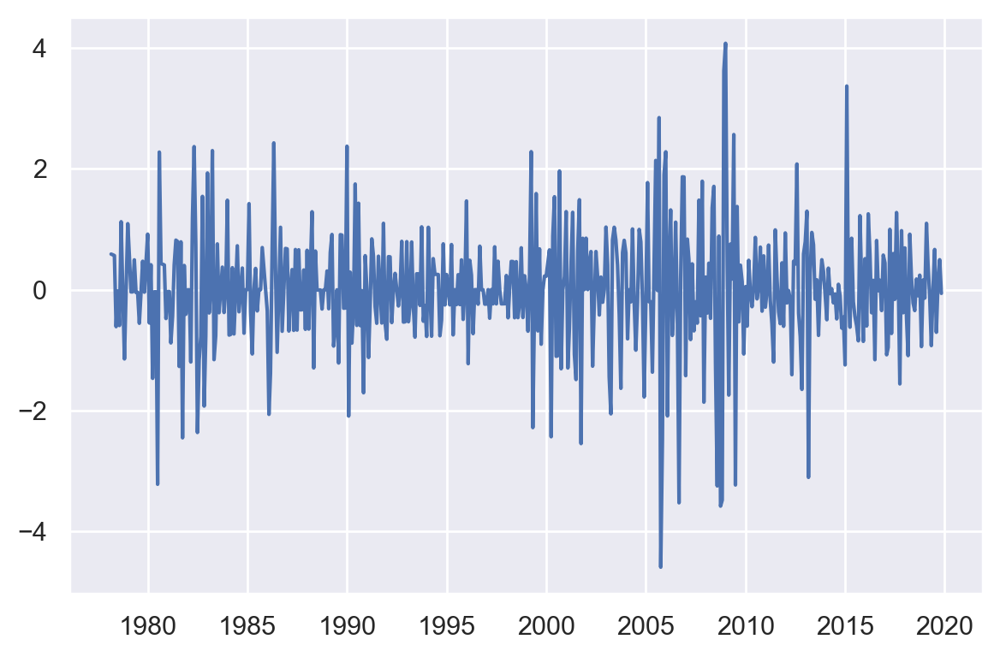

In [30]:
sns.lineplot(data = df_cpi_t_norm)
plt.tight_layout()

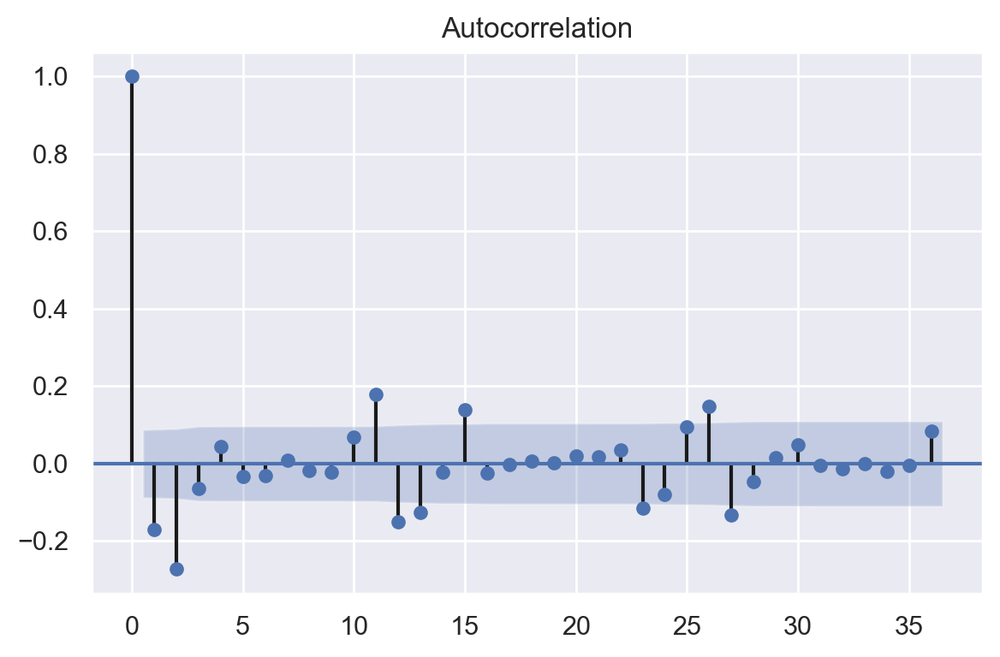

In [31]:
plot_acf(df_cpi_t_norm, lags = 36)
plt.tight_layout()

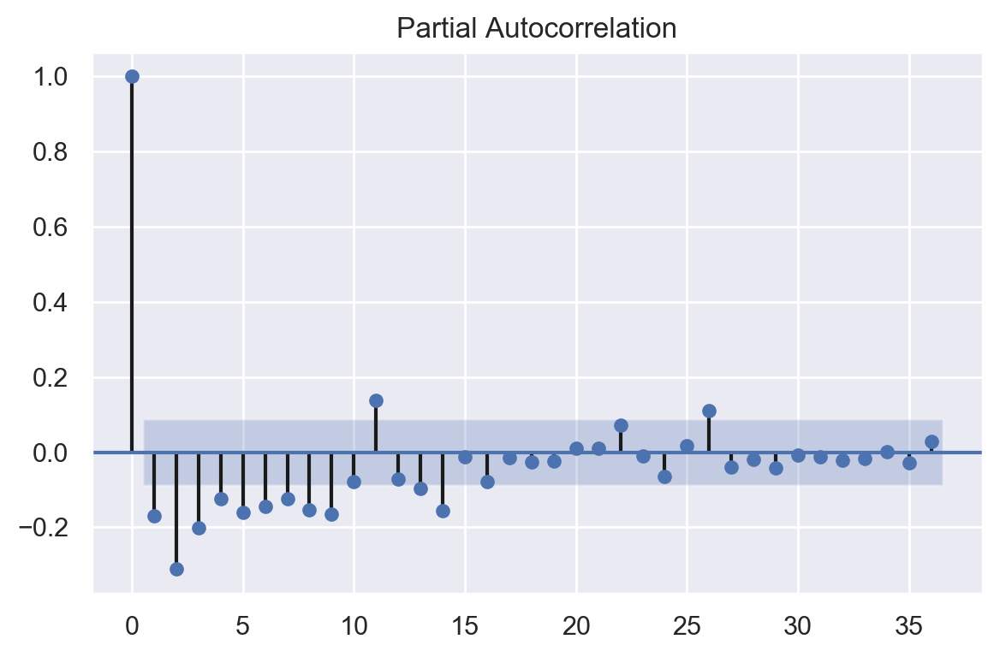

In [32]:
plot_pacf(df_cpi_t_norm, lags = 36)
plt.tight_layout()

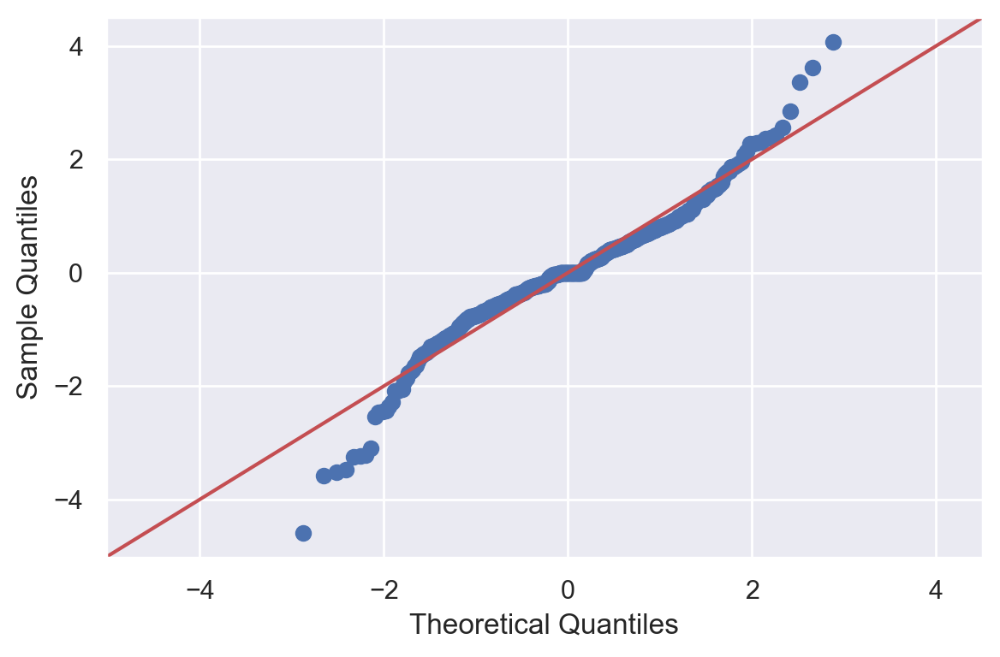

In [33]:
sm.qqplot(df_cpi_t_norm, line = '45')
plt.tight_layout()

## Denoising and Compression

### PCA - Complete Database

PCA will be used as a benchmark and to estimate the number of principal components required to explain the variance of the data.

In [34]:
X_pca = df_FRED_MD_t_norm_ex_nan_L1
n_comp = 5
pca = PCA(n_components = n_comp, svd_solver = 'full')
pca.fit(X_pca)

PCA(copy=True, iterated_power='auto', n_components=5, random_state=None,
    svd_solver='full', tol=0.0, whiten=False)

In [35]:
print(pca.explained_variance_ratio_)

[0.15777392 0.09867536 0.05518841 0.05201407 0.0485999 ]


In [36]:
print(sum(pca.explained_variance_ratio_))

0.412251658135833


In [37]:
print(pca.singular_values_)

[102.85577911  81.342112    60.83241357  59.05701467  57.0858878 ]


In [38]:
print(pca.transform(X_pca))

[[-12.51660659   4.09032026  -1.87735572  -0.41172161   0.67909803]
 [ -6.30802876   4.83303317   0.19618885   1.43401458  -2.18320472]
 [ -8.94315831   4.53147454  -0.25421923   0.44038084  -1.54553804]
 ...
 [  2.17824358  -1.28886574  -1.23530005   1.26592082  -3.38320274]
 [ -1.85253723  -2.91309456  -0.563437    -0.86447181   1.18319408]
 [  1.229179    -1.36754511  -1.04505729   1.06642712  -3.08976053]]


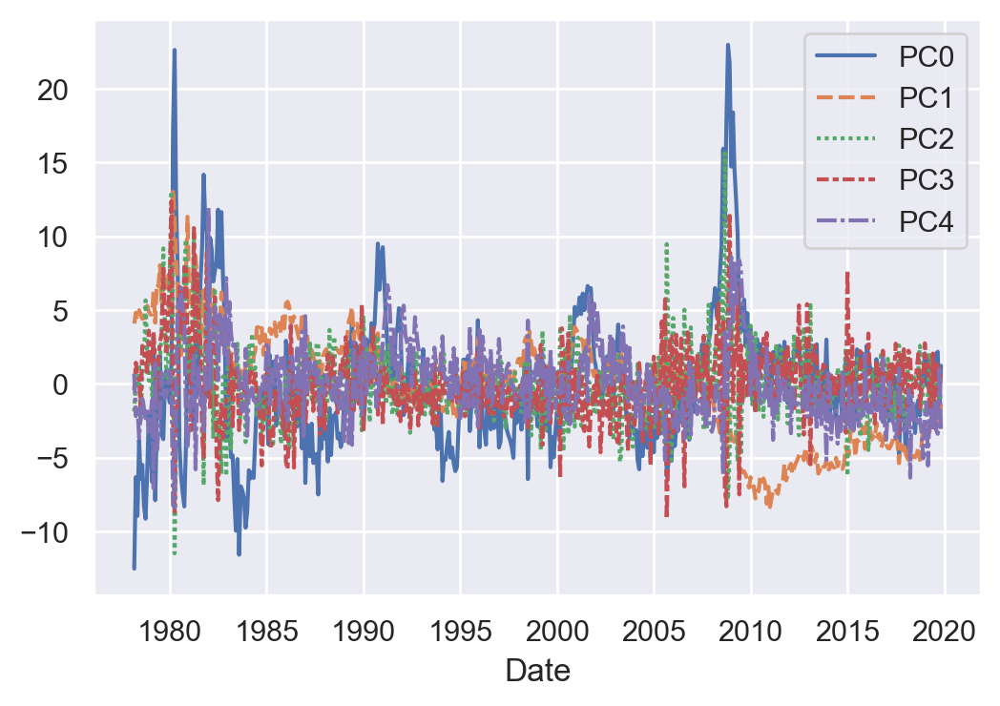

In [39]:
X_pca_t = pca.transform(X_pca)
X_pca_t = X_pca_t.reshape(X_pca_t.shape[0], n_comp)
X_pca_t = pd.DataFrame(data = X_pca_t, 
                       index = X_pca.index, 
                       columns = ["PC" + str(i) for i in np.arange(0,n_comp)])
sns.lineplot(data = X_pca_t)

In [40]:
# Correlation matrix
X_pca_t.corr()

,PC0,PC1,PC2,PC3,PC4
PC0,1.000000e+00,-6.823358e-17,-5.798672e-17,2.606697e-16,-2.824902e-16
PC1,-6.823358e-17,1.000000e+00,5.236735e-17,-4.678178e-16,3.997627e-17
PC2,-5.798672e-17,5.236735e-17,1.000000e+00,2.953729e-16,-2.074232e-16
PC3,2.606697e-16,-4.678178e-16,2.953729e-16,1.000000e+00,1.276420e-16
PC4,-2.824902e-16,3.997627e-17,-2.074232e-16,1.276420e-16,1.000000e+00


### Deep Autoencoder - Complete Database

Here, an autoencoder is fitted to the data. The encoded series will be subsequently used as inputs of the LSTM network that will be fitted to forecast inflation.

In [41]:
# Data
X_autoencoder = df_FRED_MD_t_norm_ex_nan_L1

In [42]:
# Number of time series
input_dim = X_autoencoder.shape[1]

# Dimension of encoding units (roughly equivalent to principal components)
encoding_dim1 = 20
encoding_dim2 = 5

input_img = Input(shape=(input_dim,))
encoded_partial = Dense(encoding_dim1, activation = "selu")(input_img)
encoded = Dense(encoding_dim2, activation="selu")(encoded_partial)
decoded_partial = Dense(encoding_dim1, activation="selu")(encoded)
decoded = Dense(input_dim, activation="selu")(decoded_partial)
autoencoder = Model(input_img, decoded)
autoencoder.compile(optimizer='adam', loss='mse') # 'adadelta' is another interesting choice as optimizer

In [43]:
print(autoencoder.summary())

Model: "functional_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         [(None, 134)]             0         
_________________________________________________________________
dense (Dense)                (None, 20)                2700      
_________________________________________________________________
dense_1 (Dense)              (None, 5)                 105       
_________________________________________________________________
dense_2 (Dense)              (None, 20)                120       
_________________________________________________________________
dense_3 (Dense)              (None, 134)               2814      
Total params: 5,739
Trainable params: 5,739
Non-trainable params: 0
_________________________________________________________________
None


In [44]:
# Fits the autoenconder
hist_autoencoder = autoencoder.fit(X_autoencoder, X_autoencoder,
                epochs=200,
                batch_size=16,
                shuffle=True,
                validation_split=0.1,
                verbose=False)

In [45]:
# Use the encoded layer to encode the training input
encoder = Model(input_img, encoded)
encoded_input = Input(shape=(encoding_dim1,))
decoder_layer = autoencoder.layers[-1]
decoder = Model(encoded_input, decoder_layer(encoded_input))
encoded_data = encoder.predict(X_autoencoder)

In [46]:
# Converts encoded data to a labeled dataframe
encoded_data = pd.DataFrame(data = encoded_data, 
                            index = X_autoencoder.index, 
                            columns = ["PC" + str(i) for i in np.arange(0, encoding_dim2)])

In [47]:
encoded_data.head()

,PC0,PC1,PC2,PC3,PC4
Date,,,,,
1978-03-01,-1.654420,-0.605969,-0.912958,0.644250,1.107131
1978-04-01,-1.354055,-0.786220,-1.042414,-1.364055,0.961589
1978-05-01,-1.386490,-0.477479,-1.329929,-0.866285,1.128267
1978-06-01,-0.436788,-0.656575,-1.513137,-1.478620,1.089939
1978-07-01,-1.424614,-1.459118,-0.282548,-1.092535,1.196758


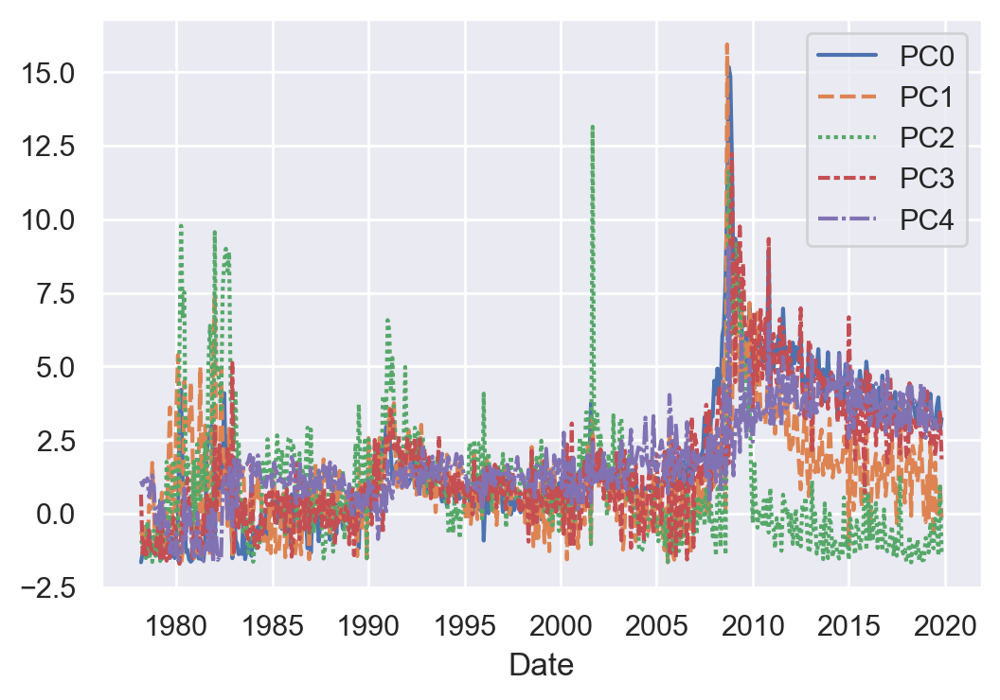

In [48]:
# Plots encoded data
sns.lineplot(data = encoded_data)

In [49]:
# Correlation matrix
encoded_data.corr()

,PC0,PC1,PC2,PC3,PC4
PC0,1.000000,0.567646,0.077680,0.795066,0.713494
PC1,0.567646,1.000000,0.310860,0.451193,0.405345
PC2,0.077680,0.310860,1.000000,0.054791,-0.211511
PC3,0.795066,0.451193,0.054791,1.000000,0.595076
PC4,0.713494,0.405345,-0.211511,0.595076,1.000000


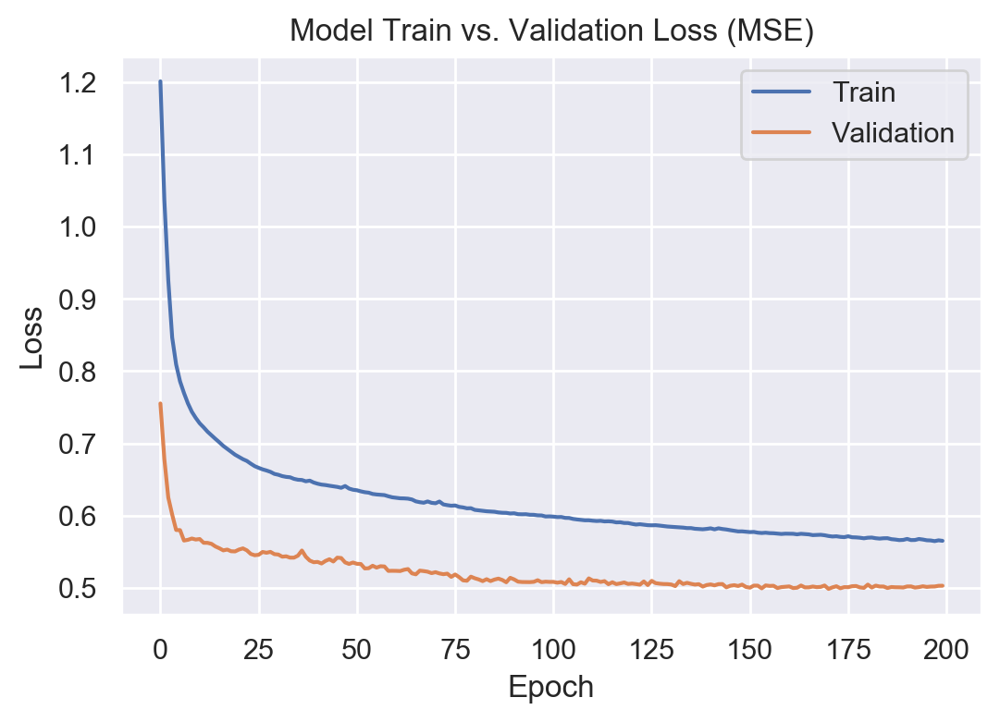

In [50]:
# Plots loss function
plt.plot(hist_autoencoder.history['loss'])
plt.plot(hist_autoencoder.history['val_loss'])
plt.title('Model Train vs. Validation Loss (MSE)')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['Train', 'Validation'], loc='upper right')
plt.show()

### PCA - Output and Income

In [51]:
X_pca = df_FRED_MD_t_norm_ex_nan_OI_L1
n_comp = 6
pca = PCA(n_components = n_comp, svd_solver = 'full')
pca.fit(X_pca)

PCA(copy=True, iterated_power='auto', n_components=6, random_state=None,
    svd_solver='full', tol=0.0, whiten=False)

In [52]:
print(pca.explained_variance_ratio_)

[0.53927154 0.11994443 0.09666104 0.08049431 0.04924534 0.0394335 ]


In [53]:
print(sum(pca.explained_variance_ratio_))

0.9250501664633761


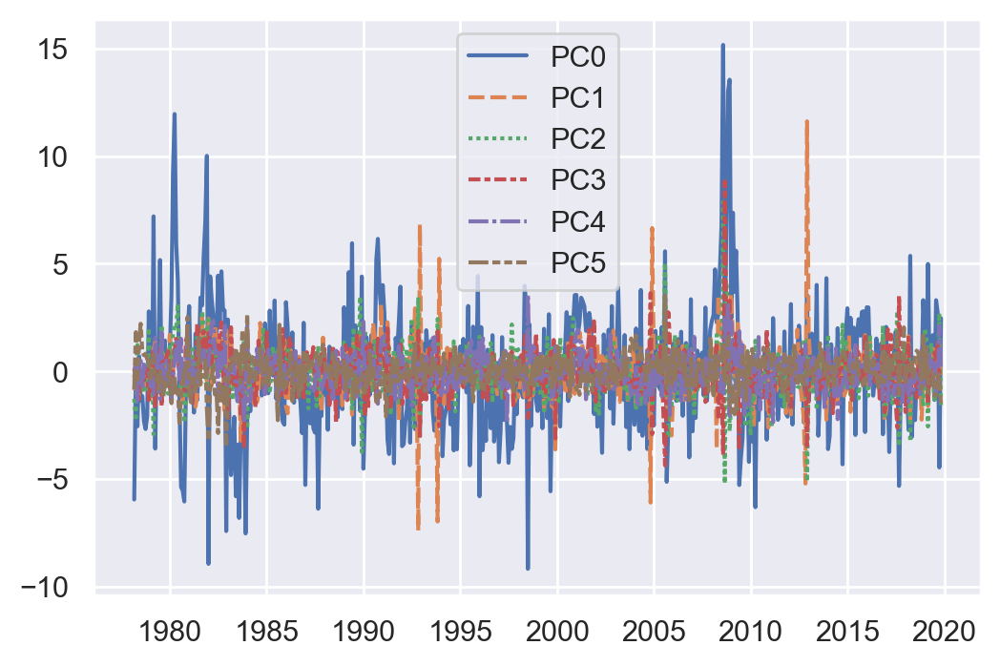

In [54]:
X_pca_t = pca.transform(X_pca)
X_pca_t = X_pca_t.reshape(X_pca_t.shape[0], n_comp)
X_pca_t = pd.DataFrame(data = X_pca_t, 
                       index = X_pca.index, 
                       columns = ["PC" + str(i) for i in np.arange(0,n_comp)])
sns.lineplot(data = X_pca_t)

### Deep Autoencoder - Output and Income

In [55]:
# Data
X_autoencoder = df_FRED_MD_t_norm_ex_nan_OI_L1

In [56]:
print(len(X_autoencoder.columns))

16


In [57]:
# Number of time series
input_dim = X_autoencoder.shape[1]

# Dimension of encoding units (roughly equivalent to principal components)
encoding_dim1 = 10
encoding_dim2 = 6

input_img = Input(shape=(input_dim,))
encoded_partial = Dense(encoding_dim1, activation = "selu")(input_img)
encoded = Dense(encoding_dim2, activation="selu")(encoded_partial)
decoded_partial = Dense(encoding_dim1, activation="selu")(encoded)
decoded = Dense(input_dim, activation="selu")(decoded_partial)
autoencoder = Model(input_img, decoded)
autoencoder.compile(optimizer='adam', loss='mse') # 'adadelta' is another interesting choice as optimizer

In [58]:
print(autoencoder.summary())

Model: "functional_7"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_3 (InputLayer)         [(None, 16)]              0         
_________________________________________________________________
dense_4 (Dense)              (None, 10)                170       
_________________________________________________________________
dense_5 (Dense)              (None, 6)                 66        
_________________________________________________________________
dense_6 (Dense)              (None, 10)                70        
_________________________________________________________________
dense_7 (Dense)              (None, 16)                176       
Total params: 482
Trainable params: 482
Non-trainable params: 0
_________________________________________________________________
None


In [59]:
# Fits the autoenconder
hist_autoencoder = autoencoder.fit(X_autoencoder, X_autoencoder,
                epochs=200,
                batch_size=16,
                shuffle=True,
                validation_split=0.1,
                verbose=False)

In [60]:
# Use the encoded layer to encode the training input
encoder = Model(input_img, encoded)
encoded_input = Input(shape=(encoding_dim1,))
decoder_layer = autoencoder.layers[-1]
decoder = Model(encoded_input, decoder_layer(encoded_input))
encoded_data = encoder.predict(X_autoencoder)

In [61]:
# Converts encoded data to a labeled dataframe
encoded_data = pd.DataFrame(data = encoded_data, 
                            index = X_autoencoder.index, 
                            columns = ["PC" + str(i) for i in np.arange(0, encoding_dim2)])
encoded_data.head()

,PC0,PC1,PC2,PC3,PC4,PC5
1978-03-01 00:00:00,1.211594,-0.367156,2.019088,1.042940,-0.032870,0.633263
1978-04-01 00:00:00,-0.278067,-0.882272,1.849639,1.207408,1.809819,0.772351
1978-05-01 00:00:00,1.913276,-0.739883,1.083799,0.971208,0.460175,0.469942
1978-06-01 00:00:00,0.172697,-1.023568,1.007909,1.277285,1.377824,1.140603
1978-07-01 00:00:00,0.573497,-1.084624,1.802184,1.948741,2.024186,1.043663


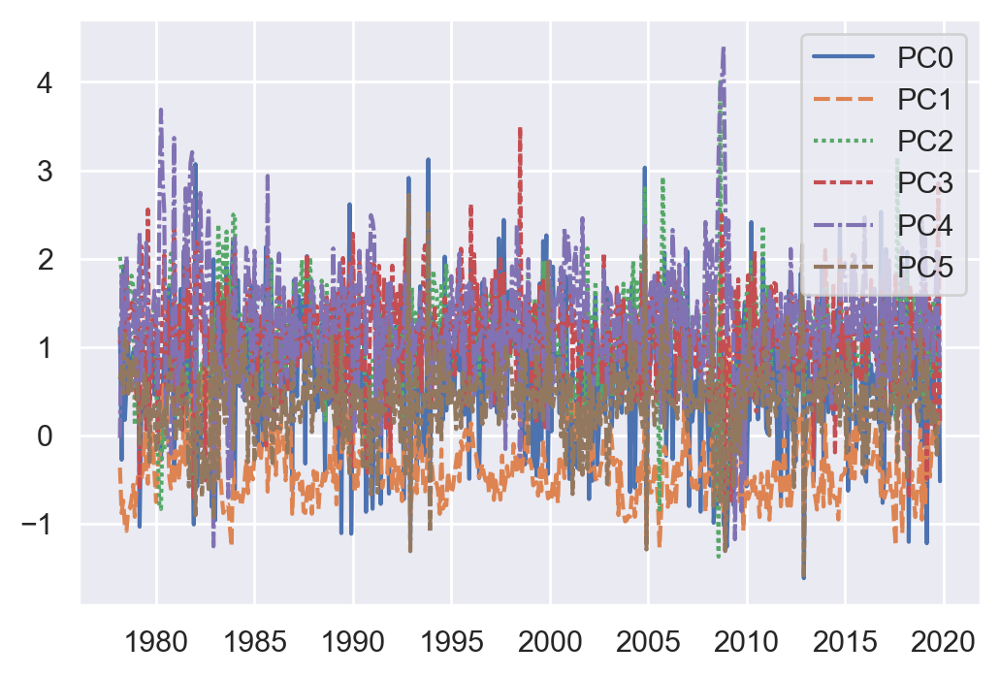

In [62]:
# Plots encoded data
sns.lineplot(data = encoded_data)

In [63]:
# Correlation matrix
encoded_data.corr()

,PC0,PC1,PC2,PC3,PC4,PC5
PC0,1.000000,-0.018070,0.459935,0.274982,-0.084718,-0.065501
PC1,-0.018070,1.000000,-0.054840,-0.090556,0.131204,-0.319625
PC2,0.459935,-0.054840,1.000000,0.240053,-0.028064,0.058792
PC3,0.274982,-0.090556,0.240053,1.000000,0.198504,0.041561
PC4,-0.084718,0.131204,-0.028064,0.198504,1.000000,-0.088630
PC5,-0.065501,-0.319625,0.058792,0.041561,-0.088630,1.000000


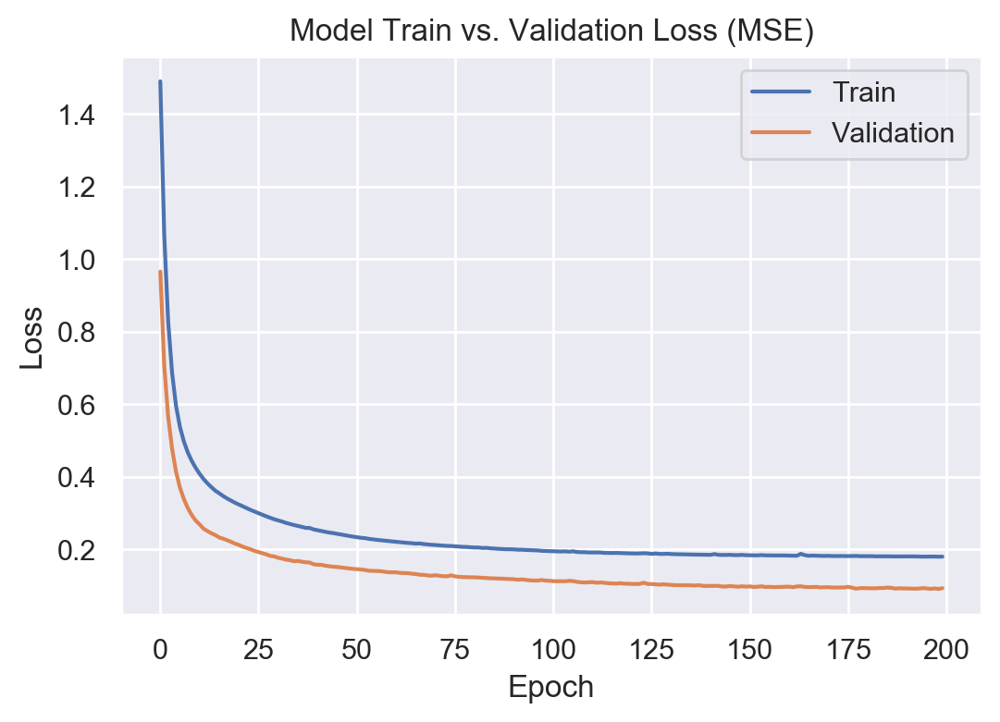

In [64]:
# Plots loss function
plt.plot(hist_autoencoder.history['loss'])
plt.plot(hist_autoencoder.history['val_loss'])
plt.title('Model Train vs. Validation Loss (MSE)')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['Train', 'Validation'], loc='upper right')
plt.show()

In [65]:
# Stores the results for later use
encoded_data_OI = encoded_data.copy()

### PCA - Labor Market

In [66]:
X_pca = df_FRED_MD_t_norm_ex_nan_LM_L1
n_comp = 10
pca = PCA(n_components = n_comp, svd_solver = 'full')
pca.fit(X_pca)

PCA(copy=True, iterated_power='auto', n_components=10, random_state=None,
    svd_solver='full', tol=0.0, whiten=False)

In [67]:
print(pca.explained_variance_ratio_)

[0.31826255 0.07415498 0.07108693 0.05889619 0.0533995  0.04947019
 0.04494833 0.03791456 0.0364382  0.0359495 ]


In [68]:
print(sum(pca.explained_variance_ratio_))

0.7805209336916232


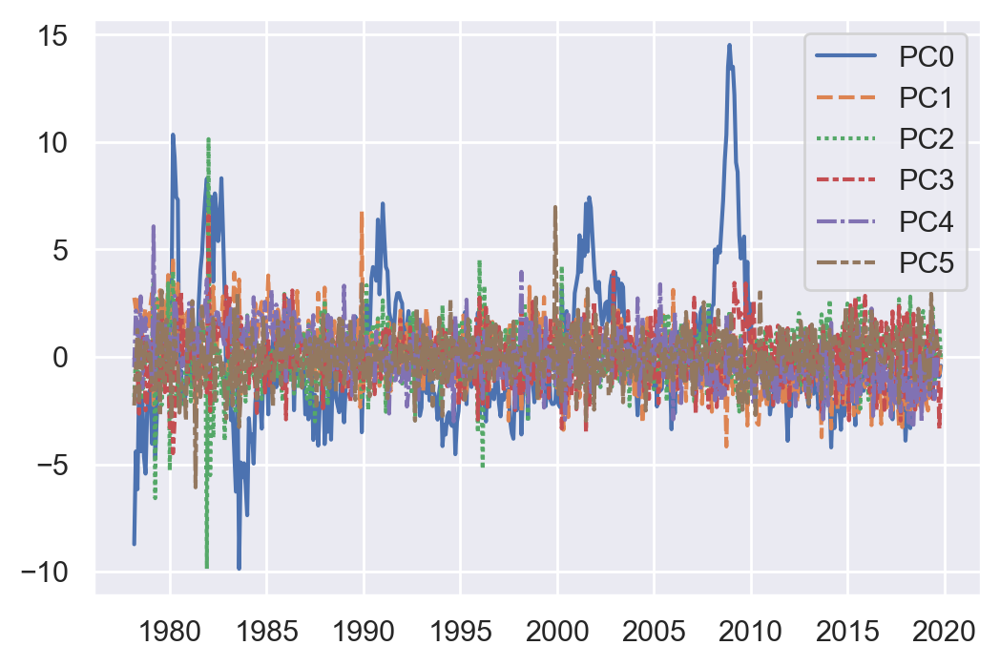

In [69]:
X_pca_t = pca.transform(X_pca)
X_pca_t = X_pca_t.reshape(X_pca_t.shape[0], n_comp)
X_pca_t = pd.DataFrame(data = X_pca_t[:,:np.min([n_comp,6])], 
                       index = X_pca.index, 
                       columns = ["PC" + str(i) for i in np.arange(0,np.min([n_comp,6]))])
sns.lineplot(data = X_pca_t)

### Deep Autoencoder - Labor Market

In [70]:
# Data
X_autoencoder = df_FRED_MD_t_norm_ex_nan_LM_L1

In [71]:
print(len(X_autoencoder.columns))

32


In [72]:
# Number of time series
input_dim = X_autoencoder.shape[1]

# Dimension of encoding units (roughly equivalent to principal components)
encoding_dim1 = 20
encoding_dim2 = 10

input_img = Input(shape=(input_dim,))
encoded_partial = Dense(encoding_dim1, activation = "selu")(input_img)
encoded = Dense(encoding_dim2, activation="selu")(encoded_partial)
decoded_partial = Dense(encoding_dim1, activation="selu")(encoded)
decoded = Dense(input_dim, activation="selu")(decoded_partial)
autoencoder = Model(input_img, decoded)
autoencoder.compile(optimizer='adam', loss='mse') # 'adadelta' is another interesting choice as optimizer

In [73]:
# Fits the autoenconder
hist_autoencoder = autoencoder.fit(X_autoencoder, X_autoencoder,
                epochs=200,
                batch_size=16,
                shuffle=True,
                validation_split=0.1,
                verbose=False)

In [74]:
# Use the encoded layer to encode the training input
encoder = Model(input_img, encoded)
encoded_input = Input(shape=(encoding_dim1,))
decoder_layer = autoencoder.layers[-1]
decoder = Model(encoded_input, decoder_layer(encoded_input))
encoded_data = encoder.predict(X_autoencoder)

In [75]:
# Converts encoded data to a labeled dataframe
encoded_data = pd.DataFrame(data = encoded_data, 
                            index = X_autoencoder.index, 
                            columns = ["PC" + str(i) for i in np.arange(0, encoding_dim2)])
encoded_data.head()

,PC0,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9
1978-03-01 00:00:00,-1.431272,2.263175,3.150114,-0.820846,-0.759084,-0.373736,4.904502,1.508359,-1.093877,4.558944
1978-04-01 00:00:00,0.453295,1.371434,2.733316,0.838982,0.205118,0.802006,1.657968,-0.227074,0.880216,1.217976
1978-05-01 00:00:00,1.576361,0.698688,1.875312,-0.982086,0.165555,1.278025,2.200486,0.752226,0.872025,0.139187
1978-06-01 00:00:00,0.866923,1.010668,1.050074,0.393137,-0.120794,-0.519426,2.757336,-0.712019,1.931049,1.754999
1978-07-01 00:00:00,1.053825,1.933998,1.777153,0.476622,0.860431,0.862159,1.196591,0.802926,0.352918,-0.469720


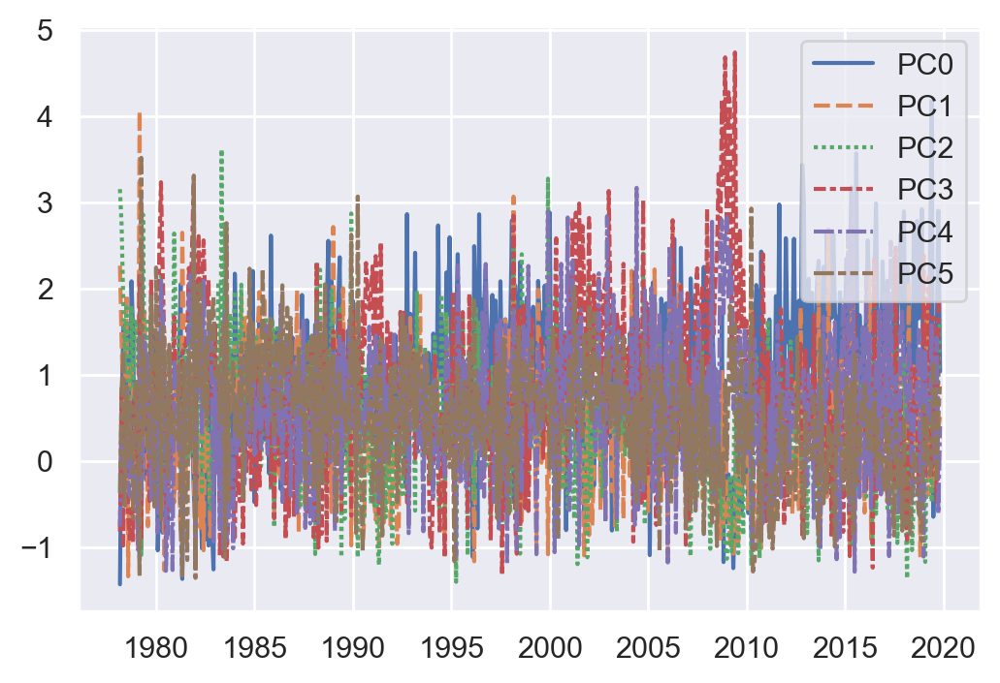

In [76]:
# Plots encoded data
sns.lineplot(data = encoded_data.iloc[:,:np.min([encoding_dim2,6])])

In [77]:
# Correlation matrix
encoded_data.corr()

,PC0,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9
PC0,1.000000,0.047977,-0.090828,-0.244741,0.153492,-0.122170,0.117280,0.268147,0.084026,0.056155
PC1,0.047977,1.000000,0.062199,-0.020750,0.206355,0.086654,0.099556,0.007819,-0.102210,0.176348
PC2,-0.090828,0.062199,1.000000,0.240464,0.013478,0.172242,0.162948,-0.080535,-0.025760,0.140082
PC3,-0.244741,-0.020750,0.240464,1.000000,0.219318,0.238225,0.210725,-0.132785,0.209431,0.051311
PC4,0.153492,0.206355,0.013478,0.219318,1.000000,-0.010574,0.048892,0.075239,0.124072,0.061314
PC5,-0.122170,0.086654,0.172242,0.238225,-0.010574,1.000000,0.222274,-0.037623,0.017954,-0.086067
PC6,0.117280,0.099556,0.162948,0.210725,0.048892,0.222274,1.000000,0.100203,0.571337,0.013955
PC7,0.268147,0.007819,-0.080535,-0.132785,0.075239,-0.037623,0.100203,1.000000,0.015932,0.084746
PC8,0.084026,-0.102210,-0.025760,0.209431,0.124072,0.017954,0.571337,0.015932,1.000000,-0.126508
PC9,0.056155,0.176348,0.140082,0.051311,0.061314,-0.086067,0.013955,0.084746,-0.126508,1.000000


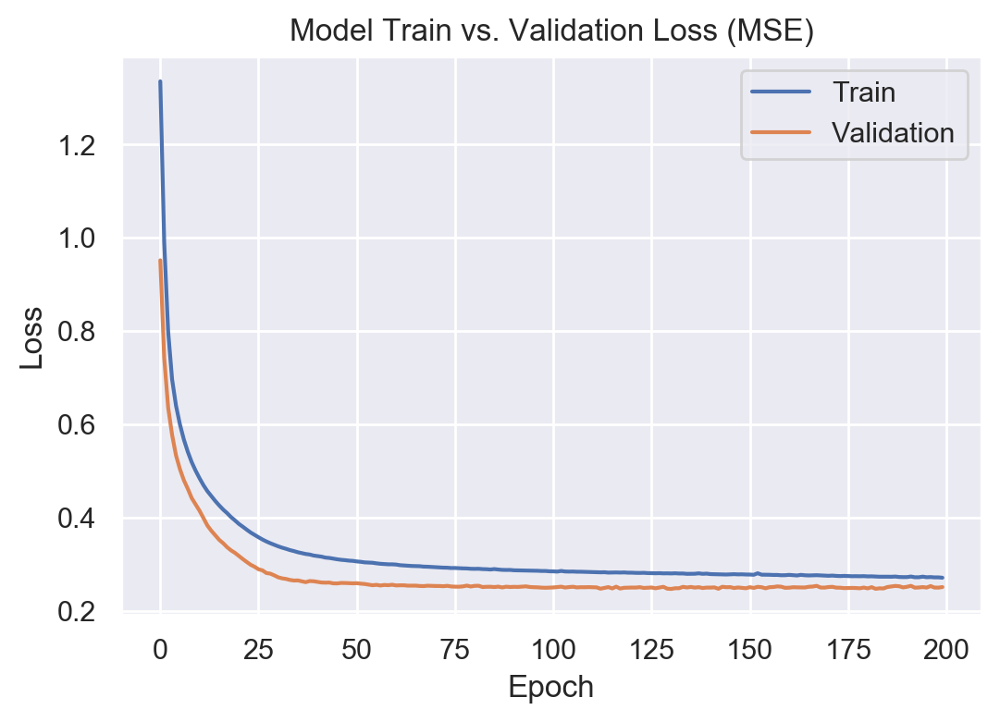

In [78]:
# Plots loss function
plt.plot(hist_autoencoder.history['loss'])
plt.plot(hist_autoencoder.history['val_loss'])
plt.title('Model Train vs. Validation Loss (MSE)')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['Train', 'Validation'], loc='upper right')
plt.show()

In [79]:
# Stores the results for later use
encoded_data_LM = encoded_data.copy()

### PCA - Housing

In [80]:
X_pca = df_FRED_MD_t_norm_ex_nan_H_L1
n_comp = 2
pca = PCA(n_components = n_comp, svd_solver = 'full')
pca.fit(X_pca)

PCA(copy=True, iterated_power='auto', n_components=2, random_state=None,
    svd_solver='full', tol=0.0, whiten=False)

In [81]:
print(pca.explained_variance_ratio_)

[0.85317735 0.05725923]


In [82]:
print(sum(pca.explained_variance_ratio_))

0.9104365785746302


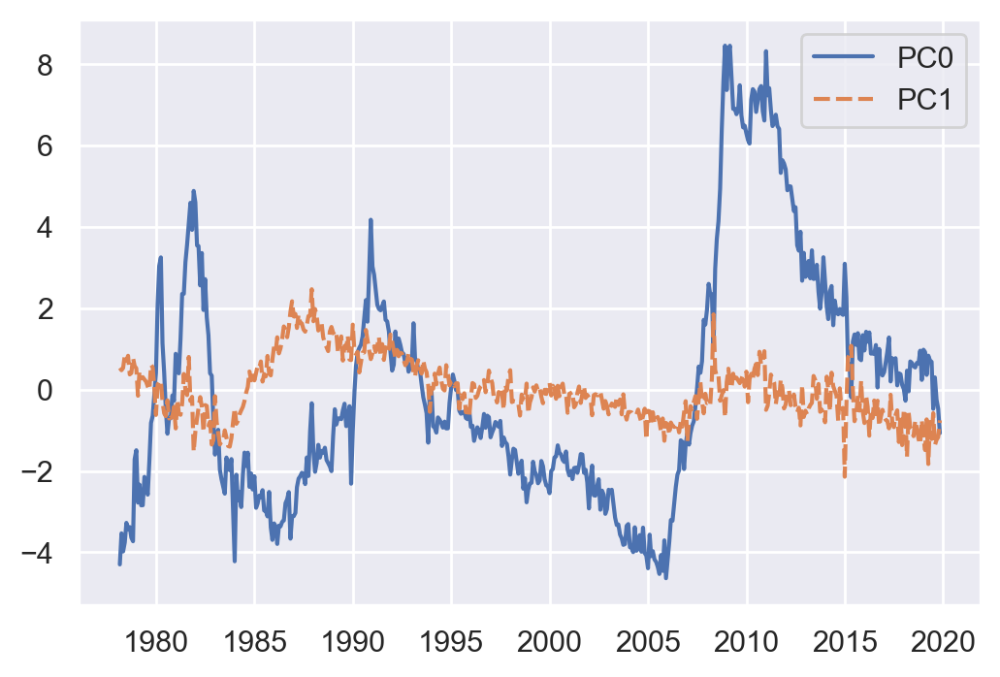

In [83]:
X_pca_t = pca.transform(X_pca)
X_pca_t = X_pca_t.reshape(X_pca_t.shape[0], n_comp)
X_pca_t = pd.DataFrame(data = X_pca_t, 
                       index = X_pca.index, 
                       columns = ["PC" + str(i) for i in np.arange(0,n_comp)])
sns.lineplot(data = X_pca_t)

### Deep Autoencoder - Housing

In [84]:
# Data
X_autoencoder = df_FRED_MD_t_norm_ex_nan_H_L1

In [85]:
print(len(X_autoencoder.columns))

10


In [86]:
# Number of time series
input_dim = X_autoencoder.shape[1]

# Dimension of encoding units (roughly equivalent to principal components)
encoding_dim1 = 5
encoding_dim2 = 2

input_img = Input(shape=(input_dim,))
encoded_partial = Dense(encoding_dim1, activation = "selu")(input_img)
encoded = Dense(encoding_dim2, activation="selu")(encoded_partial)
decoded_partial = Dense(encoding_dim1, activation="selu")(encoded)
decoded = Dense(input_dim, activation="selu")(decoded_partial)
autoencoder = Model(input_img, decoded)
autoencoder.compile(optimizer='adam', loss='mse') # 'adadelta' is another interesting choice as optimizer

In [87]:
# Fits the autoenconder
hist_autoencoder = autoencoder.fit(X_autoencoder, X_autoencoder,
                epochs=200,
                batch_size=16,
                shuffle=True,
                validation_split=0.1,
                verbose=False)

In [88]:
# Use the encoded layer to encode the training input
encoder = Model(input_img, encoded)
encoded_input = Input(shape=(encoding_dim1,))
decoder_layer = autoencoder.layers[-1]
decoder = Model(encoded_input, decoder_layer(encoded_input))
encoded_data = encoder.predict(X_autoencoder)

In [89]:
# Converts encoded data to a labeled dataframe
encoded_data = pd.DataFrame(data = encoded_data, 
                            index = X_autoencoder.index, 
                            columns = ["PC" + str(i) for i in np.arange(0, encoding_dim2)])
encoded_data.head()

,PC0,PC1
1978-03-01 00:00:00,-0.644179,1.314355
1978-04-01 00:00:00,0.028817,1.545496
1978-05-01 00:00:00,-0.279508,1.502427
1978-06-01 00:00:00,-0.386000,1.345166
1978-07-01 00:00:00,-0.136537,1.323482


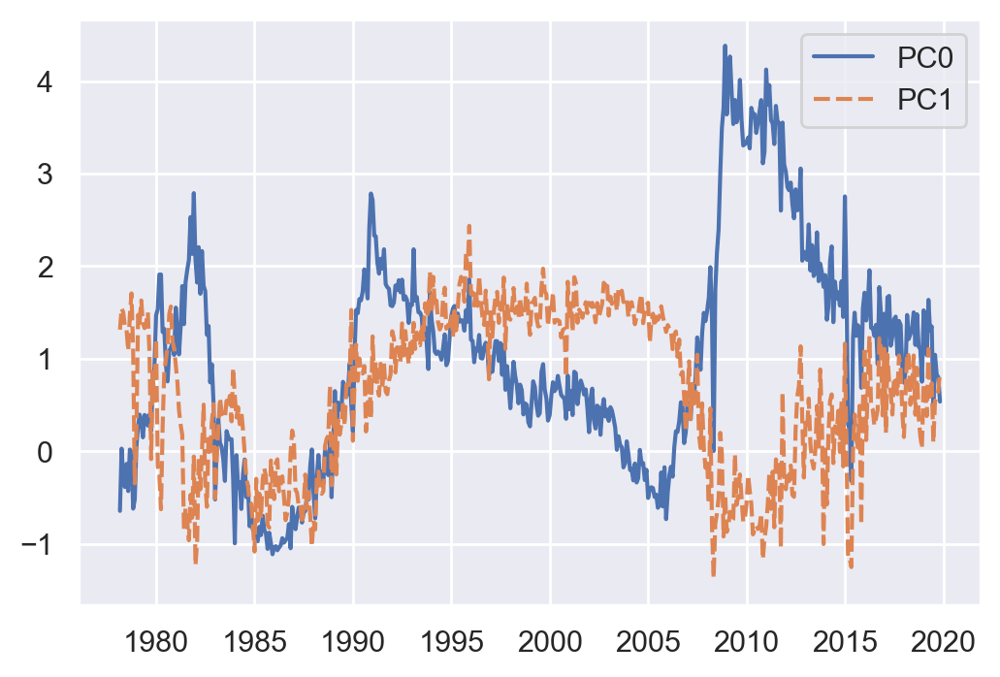

In [90]:
# Plots encoded data
sns.lineplot(data = encoded_data)

In [91]:
# Correlation matrix
encoded_data.corr()

,PC0,PC1
PC0,1.000000,-0.211893
PC1,-0.211893,1.000000


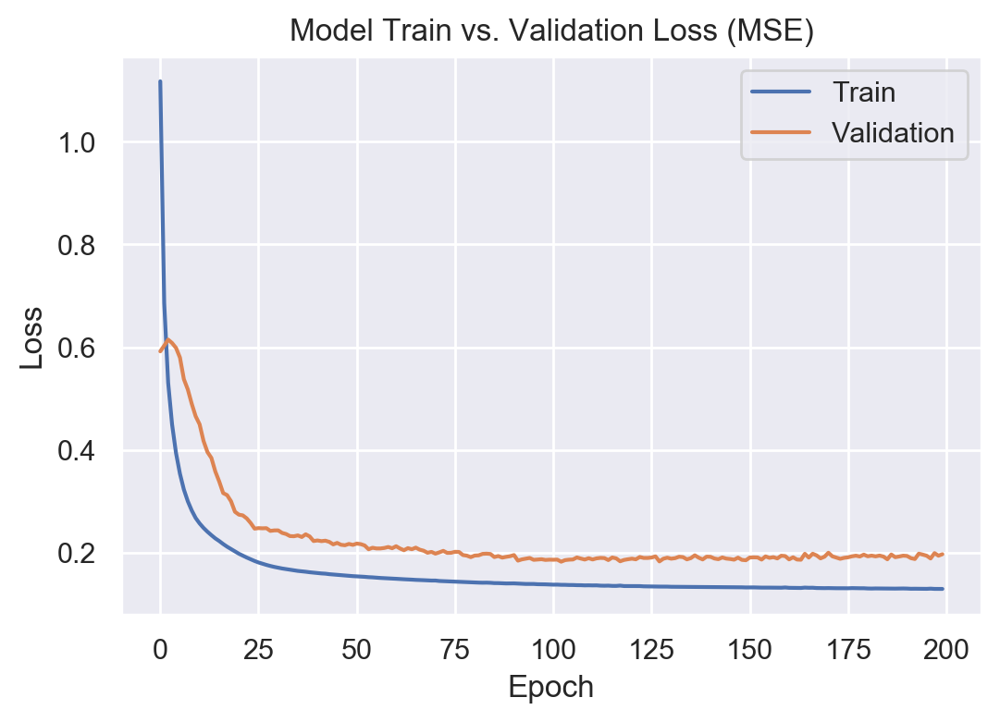

In [92]:
# Plots loss function
plt.plot(hist_autoencoder.history['loss'])
plt.plot(hist_autoencoder.history['val_loss'])
plt.title('Model Train vs. Validation Loss (MSE)')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['Train', 'Validation'], loc='upper right')
plt.show()

In [93]:
# Stores the results for later use
encoded_data_H = encoded_data.copy()

### PCA - Consumption, Orders and Inventories

In [94]:
X_pca = df_FRED_MD_t_norm_ex_nan_COI_L1
n_comp = 7
pca = PCA(n_components = n_comp, svd_solver = 'full')
pca.fit(X_pca)

PCA(copy=True, iterated_power='auto', n_components=7, random_state=None,
    svd_solver='full', tol=0.0, whiten=False)

In [95]:
print(pca.explained_variance_ratio_)

[0.30459189 0.21414746 0.14153893 0.08075874 0.07399541 0.04764536
 0.03893192]


In [96]:
print(sum(pca.explained_variance_ratio_))

0.901609703300231


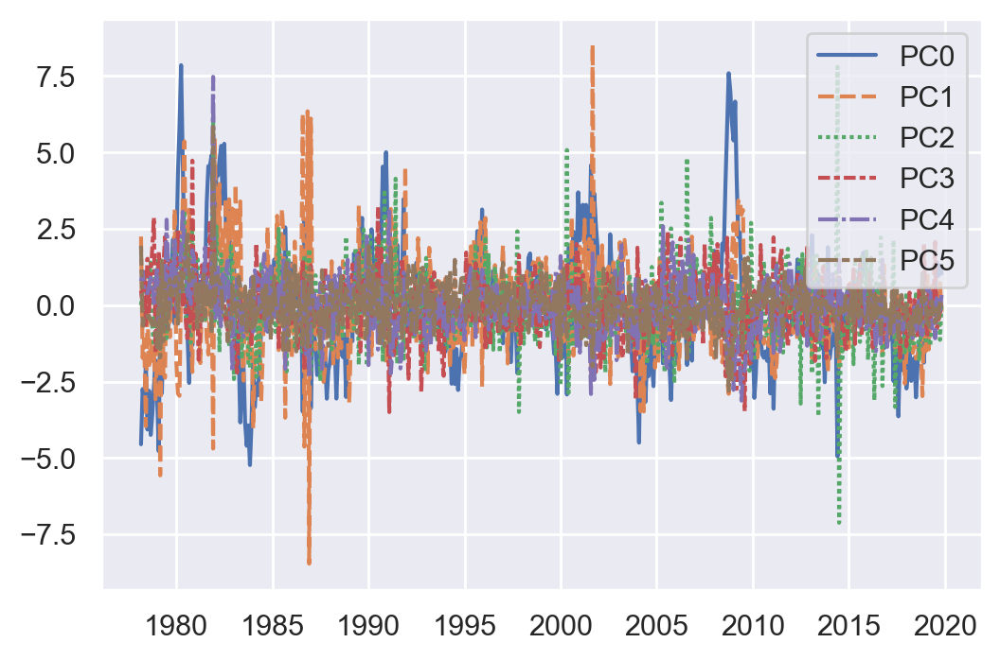

In [97]:
X_pca_t = pca.transform(X_pca)
X_pca_t = X_pca_t.reshape(X_pca_t.shape[0], n_comp)
X_pca_t = pd.DataFrame(data = X_pca_t[:,:np.min([n_comp,6])], 
                       index = X_pca.index, 
                       columns = ["PC" + str(i) for i in np.arange(0,np.min([n_comp,6]))])
sns.lineplot(data = X_pca_t)

### Deep Autoencoder - Consumption, Orders and Inventories

In [98]:
# Data
X_autoencoder = df_FRED_MD_t_norm_ex_nan_COI_L1

In [99]:
print(len(X_autoencoder.columns))

13


In [100]:
# Number of time series
input_dim = X_autoencoder.shape[1]

# Dimension of encoding units (roughly equivalent to principal components)
encoding_dim1 = 10
encoding_dim2 = 6

input_img = Input(shape=(input_dim,))
encoded_partial = Dense(encoding_dim1, activation = "selu")(input_img)
encoded = Dense(encoding_dim2, activation="selu")(encoded_partial)
decoded_partial = Dense(encoding_dim1, activation="selu")(encoded)
decoded = Dense(input_dim, activation="selu")(decoded_partial)
autoencoder = Model(input_img, decoded)
autoencoder.compile(optimizer='adam', loss='mse') # 'adadelta' is another interesting choice as optimizer

In [101]:
# Fits the autoenconder
hist_autoencoder = autoencoder.fit(X_autoencoder, X_autoencoder,
                epochs=200,
                batch_size=16,
                shuffle=True,
                validation_split=0.1,
                verbose=False)

In [102]:
# Use the encoded layer to encode the training input
encoder = Model(input_img, encoded)
encoded_input = Input(shape=(encoding_dim1,))
decoder_layer = autoencoder.layers[-1]
decoder = Model(encoded_input, decoder_layer(encoded_input))
encoded_data = encoder.predict(X_autoencoder)

In [103]:
# Converts encoded data to a labeled dataframe
encoded_data = pd.DataFrame(data = encoded_data, 
                            index = X_autoencoder.index, 
                            columns = ["PC" + str(i) for i in np.arange(0, encoding_dim2)])
encoded_data.head()

,PC0,PC1,PC2,PC3,PC4,PC5
1978-03-01 00:00:00,-1.054598,0.779293,0.753896,0.369654,0.854895,1.216468
1978-04-01 00:00:00,-0.117462,0.448962,0.334162,-0.823622,0.513120,-0.262109
1978-05-01 00:00:00,-0.115102,0.849204,-0.017537,-0.714495,0.757471,0.223199
1978-06-01 00:00:00,0.103039,0.469758,0.266009,-0.230083,0.176975,-0.999931
1978-07-01 00:00:00,-0.439036,0.775925,-0.240790,-0.698752,0.742947,0.482232


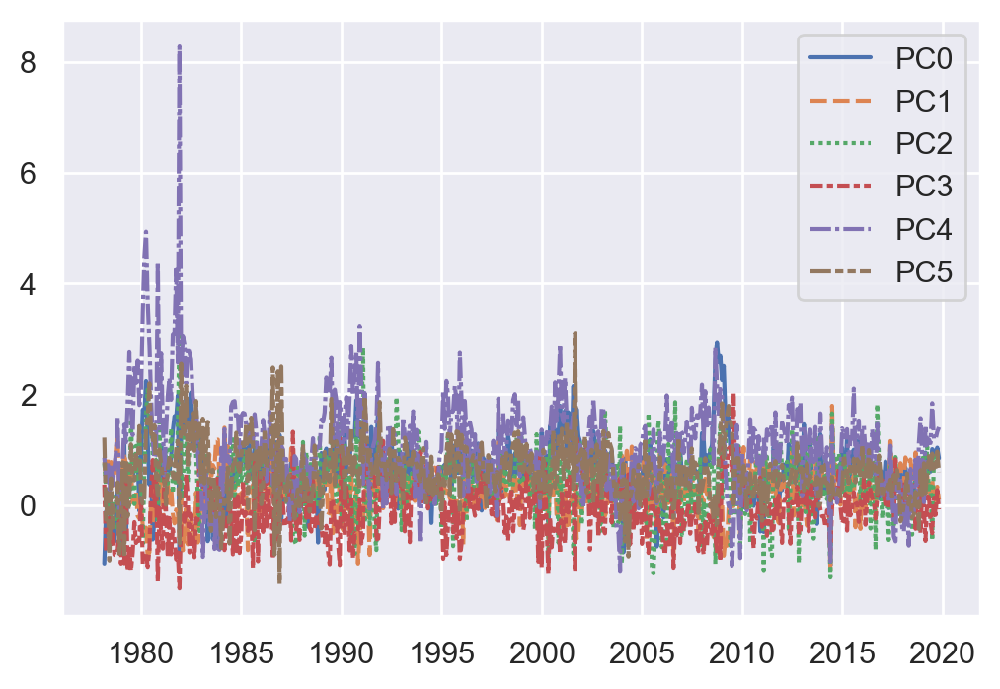

In [104]:
# Plots encoded data
sns.lineplot(data = encoded_data)

In [105]:
# Correlation matrix
encoded_data.corr()

,PC0,PC1,PC2,PC3,PC4,PC5
PC0,1.000000,-0.246533,0.155090,-0.069186,0.455572,0.188515
PC1,-0.246533,1.000000,-0.025037,0.048218,-0.187547,-0.085999
PC2,0.155090,-0.025037,1.000000,-0.072668,0.191641,0.186223
PC3,-0.069186,0.048218,-0.072668,1.000000,-0.430888,0.047646
PC4,0.455572,-0.187547,0.191641,-0.430888,1.000000,0.187244
PC5,0.188515,-0.085999,0.186223,0.047646,0.187244,1.000000


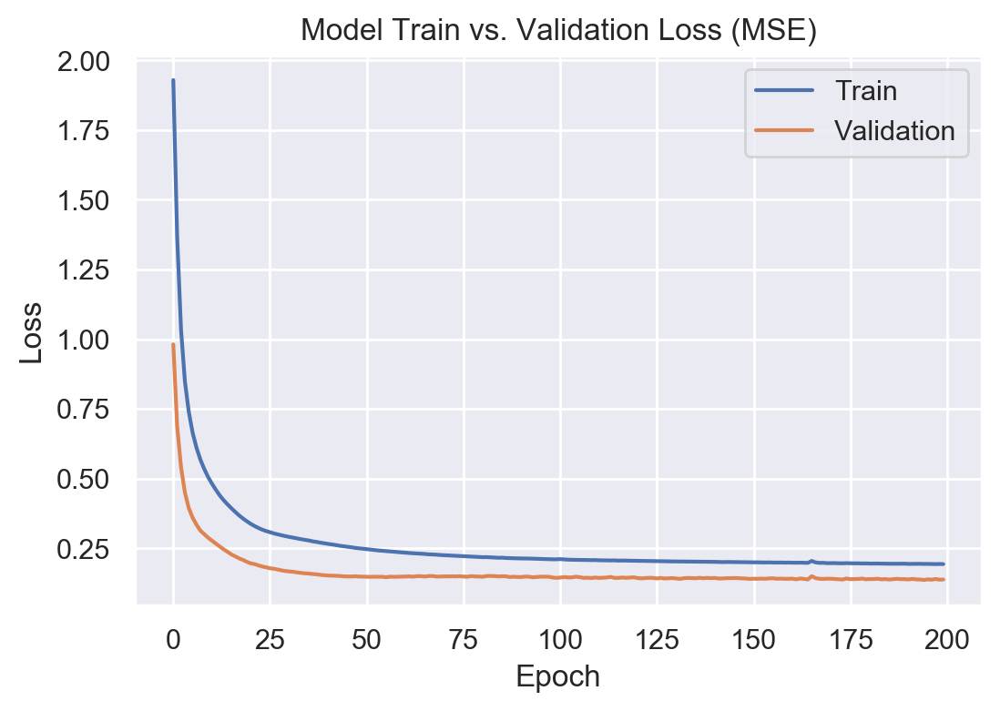

In [106]:
# Plots loss function
plt.plot(hist_autoencoder.history['loss'])
plt.plot(hist_autoencoder.history['val_loss'])
plt.title('Model Train vs. Validation Loss (MSE)')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['Train', 'Validation'], loc='upper right')
plt.show()

In [107]:
encoded_data_COI = encoded_data.copy()

### PCA - Money and Credit

In [108]:
X_pca = df_FRED_MD_t_norm_ex_nan_MC_L1
n_comp = 6
pca = PCA(n_components = n_comp, svd_solver = 'full')
pca.fit(X_pca)

PCA(copy=True, iterated_power='auto', n_components=6, random_state=None,
    svd_solver='full', tol=0.0, whiten=False)

In [109]:
print(pca.explained_variance_ratio_)

[0.19922998 0.17719578 0.11528263 0.08639927 0.07530664 0.06560463]


In [110]:
print(sum(pca.explained_variance_ratio_))

0.7190189261152591


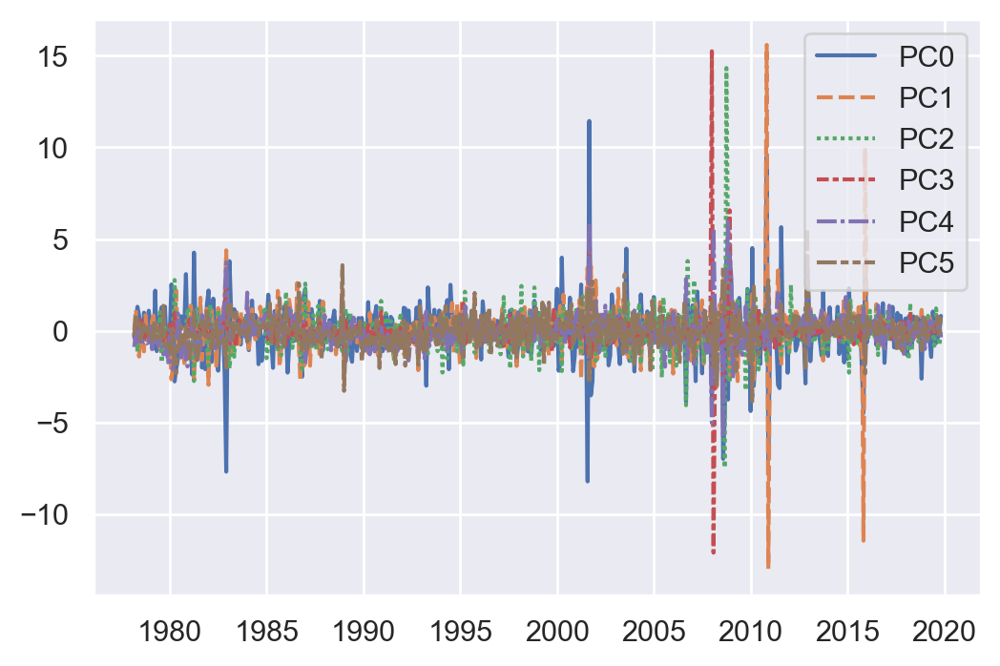

In [111]:
X_pca_t = pca.transform(X_pca)
X_pca_t = X_pca_t.reshape(X_pca_t.shape[0], n_comp)
X_pca_t = pd.DataFrame(data = X_pca_t, 
                       index = X_pca.index, 
                       columns = ["PC" + str(i) for i in np.arange(0,n_comp)])
sns.lineplot(data = X_pca_t)

### Deep Autoencoder - Money and Credit

In [112]:
# Data
X_autoencoder = df_FRED_MD_t_norm_ex_nan_MC_L1

In [113]:
print(len(X_autoencoder.columns))

13


In [114]:
# Number of time series
input_dim = X_autoencoder.shape[1]

# Dimension of encoding units (roughly equivalent to principal components)
encoding_dim1 = 9
encoding_dim2 = 6

input_img = Input(shape=(input_dim,))
encoded_partial = Dense(encoding_dim1, activation = "selu")(input_img)
encoded = Dense(encoding_dim2, activation="selu")(encoded_partial)
decoded_partial = Dense(encoding_dim1, activation="selu")(encoded)
decoded = Dense(input_dim, activation="selu")(decoded_partial)
autoencoder = Model(input_img, decoded)
autoencoder.compile(optimizer='adam', loss='mse') # 'adadelta' is another interesting choice as optimizer

In [115]:
# Fits the autoenconder
hist_autoencoder = autoencoder.fit(X_autoencoder, X_autoencoder,
                epochs=200,
                batch_size=16,
                shuffle=True,
                validation_split=0.1,
                verbose=False)

In [116]:
# Use the encoded layer to encode the training input
encoder = Model(input_img, encoded)
encoded_input = Input(shape=(encoding_dim1,))
decoder_layer = autoencoder.layers[-1]
decoder = Model(encoded_input, decoder_layer(encoded_input))
encoded_data = encoder.predict(X_autoencoder)

In [117]:
# Converts encoded data to a labeled dataframe
encoded_data = pd.DataFrame(data = encoded_data, 
                            index = X_autoencoder.index, 
                            columns = ["PC" + str(i) for i in np.arange(0, encoding_dim2)])
encoded_data.head()

,PC0,PC1,PC2,PC3,PC4,PC5
1978-03-01 00:00:00,0.363197,1.776235,1.252667,0.616276,0.506984,2.731718
1978-04-01 00:00:00,0.587272,-0.294086,-0.054183,0.633310,0.518832,1.809215
1978-05-01 00:00:00,0.226999,1.566800,2.416314,0.518279,0.334104,2.001200
1978-06-01 00:00:00,-0.660944,0.722281,0.024102,0.978280,0.439788,1.634749
1978-07-01 00:00:00,0.800772,1.433620,1.614729,0.182572,0.345235,1.627375


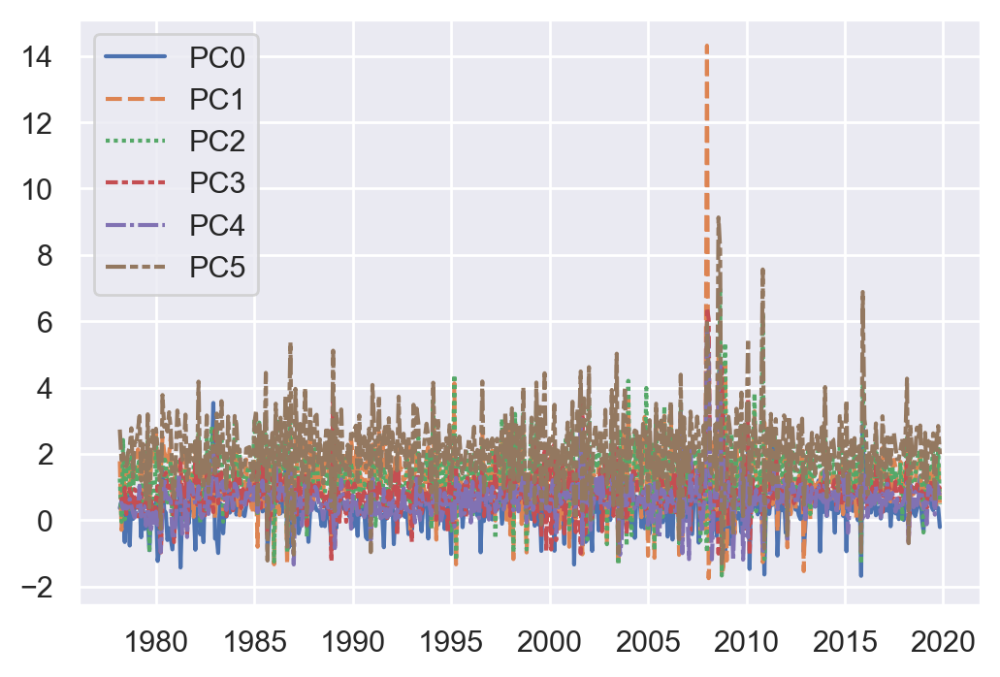

In [118]:
# Plots encoded data
sns.lineplot(data = encoded_data)

In [119]:
# Correlation matrix
encoded_data.corr()

,PC0,PC1,PC2,PC3,PC4,PC5
PC0,1.000000,-0.001890,0.275340,0.147890,0.019433,0.248025
PC1,-0.001890,1.000000,0.456511,0.154281,0.334732,0.582574
PC2,0.275340,0.456511,1.000000,0.126699,0.287086,0.633868
PC3,0.147890,0.154281,0.126699,1.000000,0.268446,0.343631
PC4,0.019433,0.334732,0.287086,0.268446,1.000000,0.496290
PC5,0.248025,0.582574,0.633868,0.343631,0.496290,1.000000


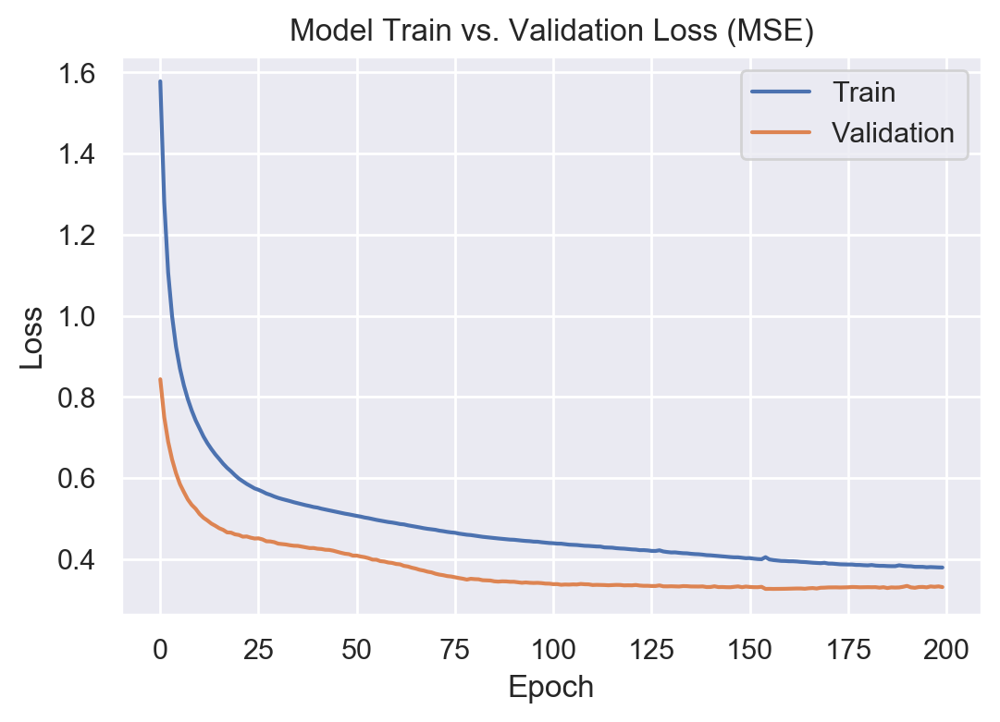

In [120]:
# Plots loss function
plt.plot(hist_autoencoder.history['loss'])
plt.plot(hist_autoencoder.history['val_loss'])
plt.title('Model Train vs. Validation Loss (MSE)')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['Train', 'Validation'], loc='upper right')
plt.show()

In [121]:
encoded_data_MC = encoded_data.copy()

### PCA - Interest and Exchange Rates

In [122]:
X_pca = df_FRED_MD_t_norm_ex_nan_INTFX_L1
n_comp = 6
pca = PCA(n_components = n_comp, svd_solver = 'full')
pca.fit(X_pca)

PCA(copy=True, iterated_power='auto', n_components=6, random_state=None,
    svd_solver='full', tol=0.0, whiten=False)

In [123]:
print(pca.explained_variance_ratio_)

[0.32889658 0.29010355 0.12394046 0.069888   0.04801398 0.03924803]


In [124]:
print(sum(pca.explained_variance_ratio_))

0.900090606913777


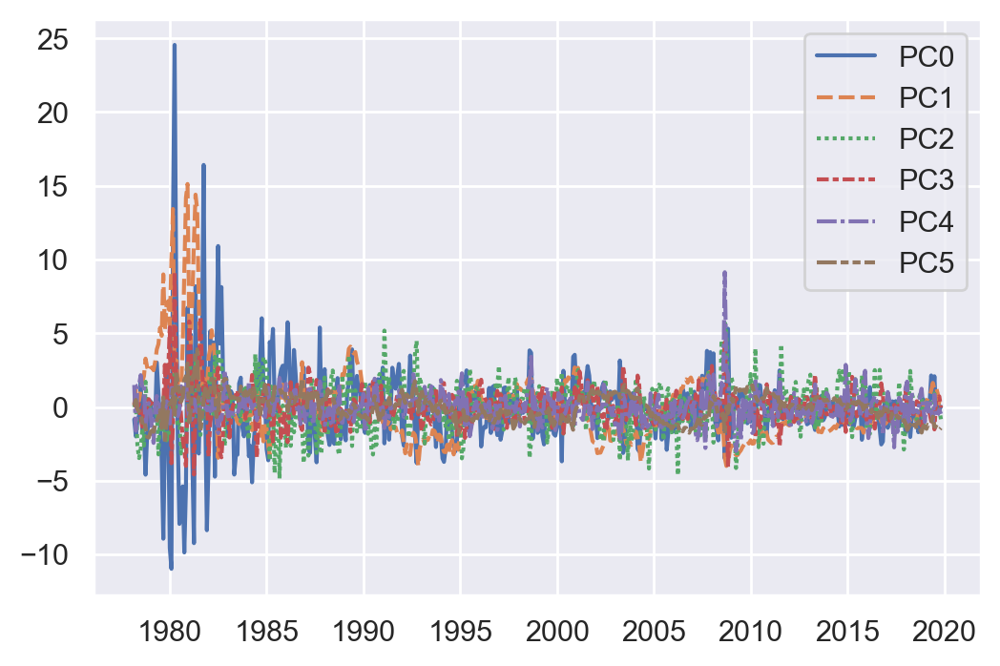

In [125]:
X_pca_t = pca.transform(X_pca)
X_pca_t = X_pca_t.reshape(X_pca_t.shape[0], n_comp)
X_pca_t = pd.DataFrame(data = X_pca_t, 
                       index = X_pca.index, 
                       columns = ["PC" + str(i) for i in np.arange(0,n_comp)])
sns.lineplot(data = X_pca_t)

### Deep Autoencoder - Interest and Exchange Rates

In [126]:
# Data
X_autoencoder = df_FRED_MD_t_norm_ex_nan_INTFX_L1

In [127]:
print(len(X_autoencoder.columns))

22


In [128]:
# Number of time series
input_dim = X_autoencoder.shape[1]

# Dimension of encoding units (roughly equivalent to principal components)
encoding_dim1 = 5
encoding_dim2 = 2

input_img = Input(shape=(input_dim,))
encoded_partial = Dense(encoding_dim1, activation = "selu")(input_img)
encoded = Dense(encoding_dim2, activation="selu")(encoded_partial)
decoded_partial = Dense(encoding_dim1, activation="selu")(encoded)
decoded = Dense(input_dim, activation="selu")(decoded_partial)
autoencoder = Model(input_img, decoded)
autoencoder.compile(optimizer='adam', loss='mse') # 'adadelta' is another interesting choice as optimizer

In [129]:
# Fits the autoenconder
hist_autoencoder = autoencoder.fit(X_autoencoder, X_autoencoder,
                epochs=200,
                batch_size=16,
                shuffle=True,
                validation_split=0.1,
                verbose=False)

In [130]:
# Use the encoded layer to encode the training input
encoder = Model(input_img, encoded)
encoded_input = Input(shape=(encoding_dim1,))
decoder_layer = autoencoder.layers[-1]
decoder = Model(encoded_input, decoder_layer(encoded_input))
encoded_data = encoder.predict(X_autoencoder)

In [131]:
# Converts encoded data to a labeled dataframe
encoded_data = pd.DataFrame(data = encoded_data, 
                            index = X_autoencoder.index, 
                            columns = ["PC" + str(i) for i in np.arange(0, encoding_dim2)])
encoded_data.head()

,PC0,PC1
1978-03-01 00:00:00,0.774462,0.906835
1978-04-01 00:00:00,0.687214,1.184274
1978-05-01 00:00:00,0.669338,0.970807
1978-06-01 00:00:00,0.656637,0.891751
1978-07-01 00:00:00,0.372296,0.486573


In [132]:
# Correlation matrix
encoded_data.corr()

,PC0,PC1
PC0,1.000000,0.061841
PC1,0.061841,1.000000


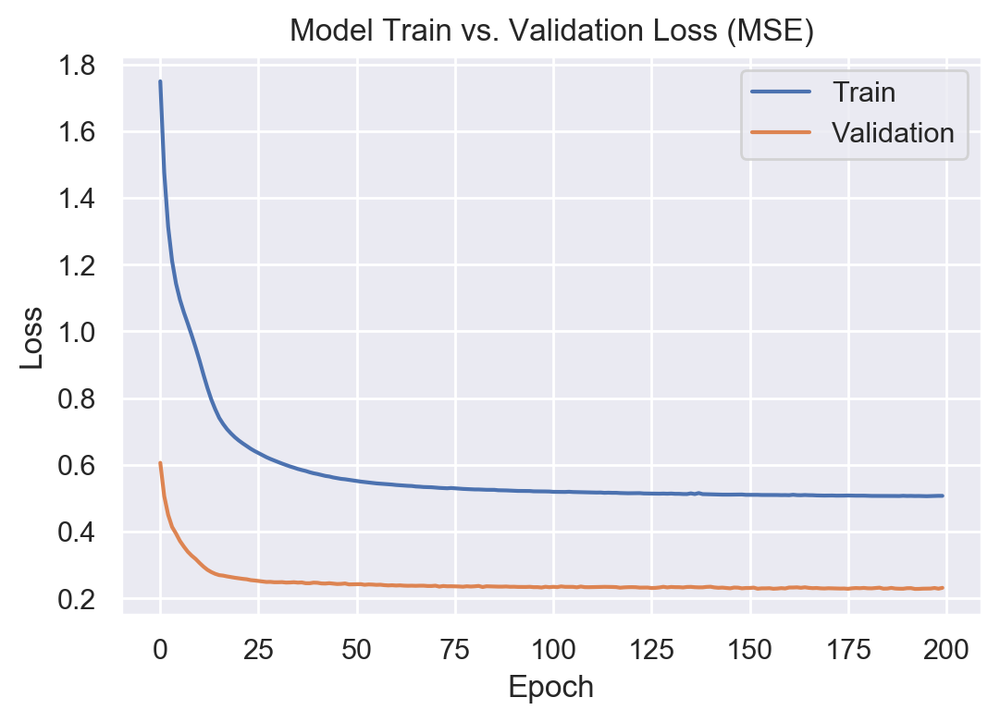

In [133]:
# Plots loss function
plt.plot(hist_autoencoder.history['loss'])
plt.plot(hist_autoencoder.history['val_loss'])
plt.title('Model Train vs. Validation Loss (MSE)')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['Train', 'Validation'], loc='upper right')
plt.show()

In [134]:
encoded_data_INTFX = encoded_data.copy()

### PCA - Prices

In [135]:
X_pca = df_FRED_MD_t_norm_ex_nan_P_L1
n_comp = 6
pca = PCA(n_components = n_comp, svd_solver = 'full')
pca.fit(X_pca)

PCA(copy=True, iterated_power='auto', n_components=6, random_state=None,
    svd_solver='full', tol=0.0, whiten=False)

In [136]:
print(pca.explained_variance_ratio_)

[0.43011699 0.11151648 0.08066041 0.07085393 0.06608328 0.06401231]


In [137]:
print(sum(pca.explained_variance_ratio_))

0.8232434032398879


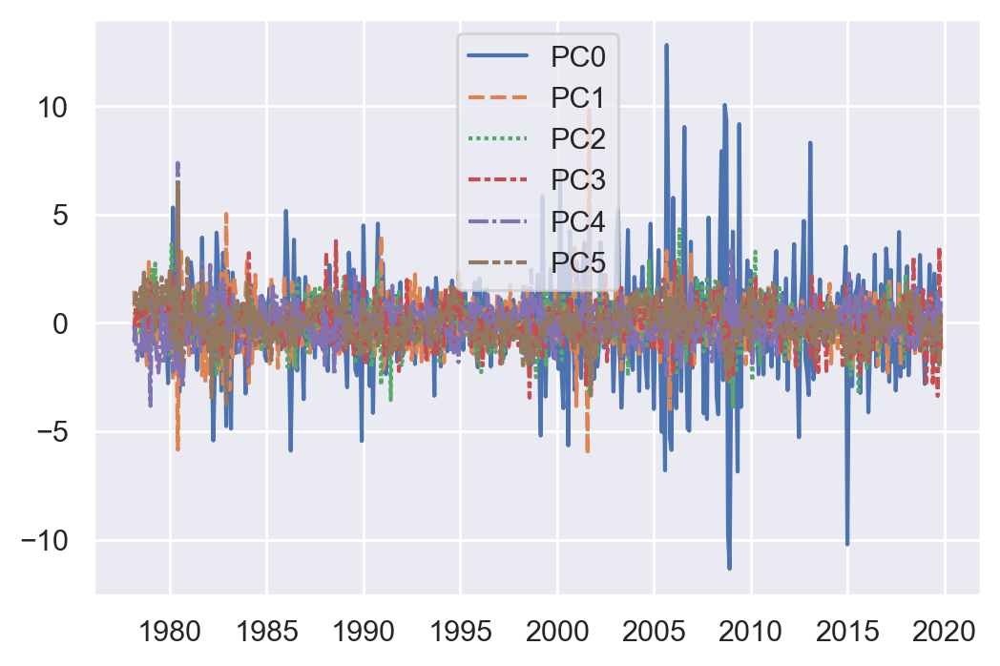

In [138]:
X_pca_t = pca.transform(X_pca)
X_pca_t = X_pca_t.reshape(X_pca_t.shape[0], n_comp)
X_pca_t = pd.DataFrame(data = X_pca_t, 
                       index = X_pca.index, 
                       columns = ["PC" + str(i) for i in np.arange(0,n_comp)])
sns.lineplot(data = X_pca_t)

### Deep Autoencoder - Prices

In [139]:
# Data
X_autoencoder = df_FRED_MD_t_norm_ex_nan_P_L1
print(len(X_autoencoder.columns))

15


In [140]:
# Number of time series
input_dim = X_autoencoder.shape[1]

# Dimension of encoding units (roughly equivalent to principal components)
encoding_dim1 = 10
encoding_dim2 = 6

input_img = Input(shape=(input_dim,))
encoded_partial = Dense(encoding_dim1, activation = "selu")(input_img)
encoded = Dense(encoding_dim2, activation="selu")(encoded_partial)
decoded_partial = Dense(encoding_dim1, activation="selu")(encoded)
decoded = Dense(input_dim, activation="selu")(decoded_partial)
autoencoder = Model(input_img, decoded)
autoencoder.compile(optimizer='adam', loss='mse') # 'adadelta' is another interesting choice as optimizer

In [141]:
# Fits the autoenconder
hist_autoencoder = autoencoder.fit(X_autoencoder, X_autoencoder,
                epochs=200,
                batch_size=16,
                shuffle=True,
                validation_split=0.1,
                verbose=False)

In [142]:
# Use the encoded layer to encode the training input
encoder = Model(input_img, encoded)
encoded_input = Input(shape=(encoding_dim1,))
decoder_layer = autoencoder.layers[-1]
decoder = Model(encoded_input, decoder_layer(encoded_input))
encoded_data = encoder.predict(X_autoencoder)

In [143]:
# Converts encoded data to a labeled dataframe
encoded_data = pd.DataFrame(data = encoded_data, 
                            index = X_autoencoder.index, 
                            columns = ["PC" + str(i) for i in np.arange(0, encoding_dim2)])
encoded_data.head()

,PC0,PC1,PC2,PC3,PC4,PC5
1978-03-01 00:00:00,0.006302,-0.529711,0.596971,0.290010,0.637402,1.222484
1978-04-01 00:00:00,0.819848,-0.089476,0.939618,0.213005,-0.214593,0.385136
1978-05-01 00:00:00,0.360375,0.146984,1.157440,0.128874,-0.121290,0.605561
1978-06-01 00:00:00,0.645073,0.385303,1.279693,0.496068,0.322845,0.934438
1978-07-01 00:00:00,0.176662,-0.751541,0.813427,-0.637660,0.380095,0.622417


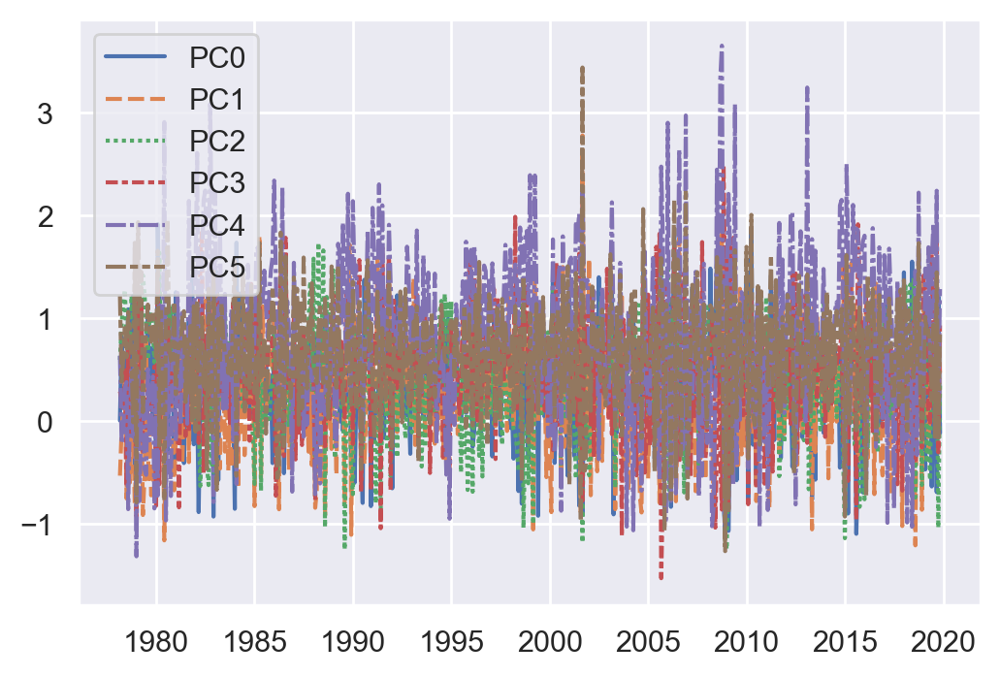

In [144]:
# Plots encoded data
sns.lineplot(data = encoded_data)

In [145]:
# Correlation matrix
encoded_data.corr()

,PC0,PC1,PC2,PC3,PC4,PC5
PC0,1.000000,0.123733,0.097727,0.035055,-0.034288,0.200346
PC1,0.123733,1.000000,0.076941,0.159280,0.247552,0.273537
PC2,0.097727,0.076941,1.000000,-0.070378,0.036899,0.162134
PC3,0.035055,0.159280,-0.070378,1.000000,-0.001669,0.250390
PC4,-0.034288,0.247552,0.036899,-0.001669,1.000000,0.256839
PC5,0.200346,0.273537,0.162134,0.250390,0.256839,1.000000


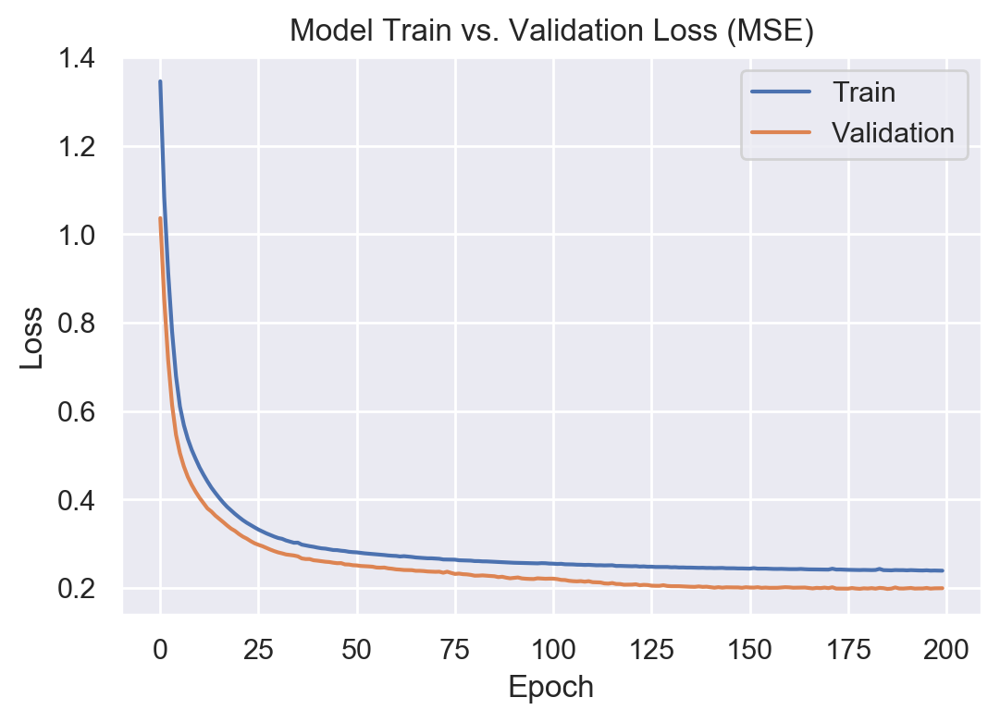

In [146]:
# Plots loss function
plt.plot(hist_autoencoder.history['loss'])
plt.plot(hist_autoencoder.history['val_loss'])
plt.title('Model Train vs. Validation Loss (MSE)')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['Train', 'Validation'], loc='upper right')
plt.show()

In [147]:
encoded_data_P = encoded_data.copy()

### PCA - Stock Market

In [148]:
X_pca = df_FRED_MD_t_norm_ex_nan_S_L1
n_comp = 2
pca = PCA(n_components = n_comp, svd_solver = 'full')
pca.fit(X_pca)

PCA(copy=True, iterated_power='auto', n_components=2, random_state=None,
    svd_solver='full', tol=0.0, whiten=False)

In [149]:
print(pca.explained_variance_ratio_)

[0.86474566 0.09938096]


In [150]:
print(sum(pca.explained_variance_ratio_))

0.9641266137412787


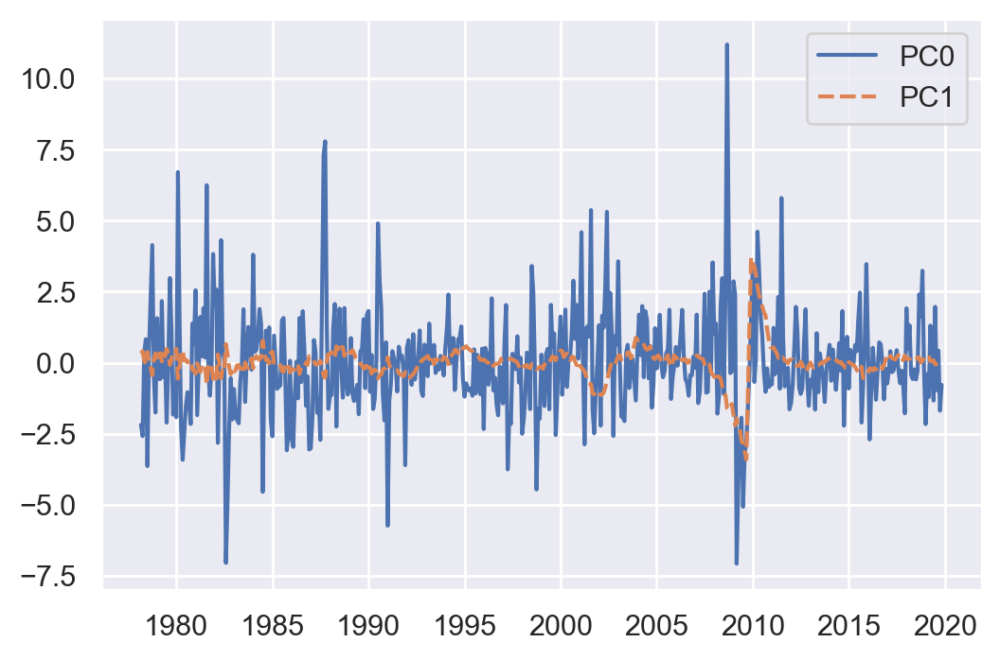

In [151]:
X_pca_t = pca.transform(X_pca)
X_pca_t = X_pca_t.reshape(X_pca_t.shape[0], n_comp)
X_pca_t = pd.DataFrame(data = X_pca_t, 
                       index = X_pca.index, 
                       columns = ["PC" + str(i) for i in np.arange(0,n_comp)])
sns.lineplot(data = X_pca_t)

### Deep Autoencoder - Stock Market

In [152]:
# Data
X_autoencoder = df_FRED_MD_t_norm_ex_nan_S_L1
print(len(X_autoencoder.columns))

4


In [153]:
# Number of time series
input_dim = X_autoencoder.shape[1]

# Dimension of encoding units (roughly equivalent to principal components)
encoding_dim1 = 5
encoding_dim2 = 2

input_img = Input(shape=(input_dim,))
encoded_partial = Dense(encoding_dim1, activation = "selu")(input_img)
encoded = Dense(encoding_dim2, activation="selu")(encoded_partial)
decoded_partial = Dense(encoding_dim1, activation="selu")(encoded)
decoded = Dense(input_dim, activation="selu")(decoded_partial)
autoencoder = Model(input_img, decoded)
autoencoder.compile(optimizer='adam', loss='mse') # 'adadelta' is another interesting choice as optimizer

In [154]:
# Fits the autoenconder
hist_autoencoder = autoencoder.fit(X_autoencoder, X_autoencoder,
                epochs=200,
                batch_size=16,
                shuffle=True,
                validation_split=0.1,
                verbose=False)

In [155]:
# Use the encoded layer to encode the training input
encoder = Model(input_img, encoded)
encoded_input = Input(shape=(encoding_dim1,))
decoder_layer = autoencoder.layers[-1]
decoder = Model(encoded_input, decoder_layer(encoded_input))
encoded_data = encoder.predict(X_autoencoder)

In [156]:
# Converts encoded data to a labeled dataframe
encoded_data = pd.DataFrame(data = encoded_data, 
                            index = X_autoencoder.index, 
                            columns = ["PC" + str(i) for i in np.arange(0, encoding_dim2)])
encoded_data.head()

,PC0,PC1
1978-03-01 00:00:00,-0.030078,0.610516
1978-04-01 00:00:00,-0.259307,0.639168
1978-05-01 00:00:00,0.664890,0.280930
1978-06-01 00:00:00,0.813646,0.285769
1978-07-01 00:00:00,-0.718506,0.807041


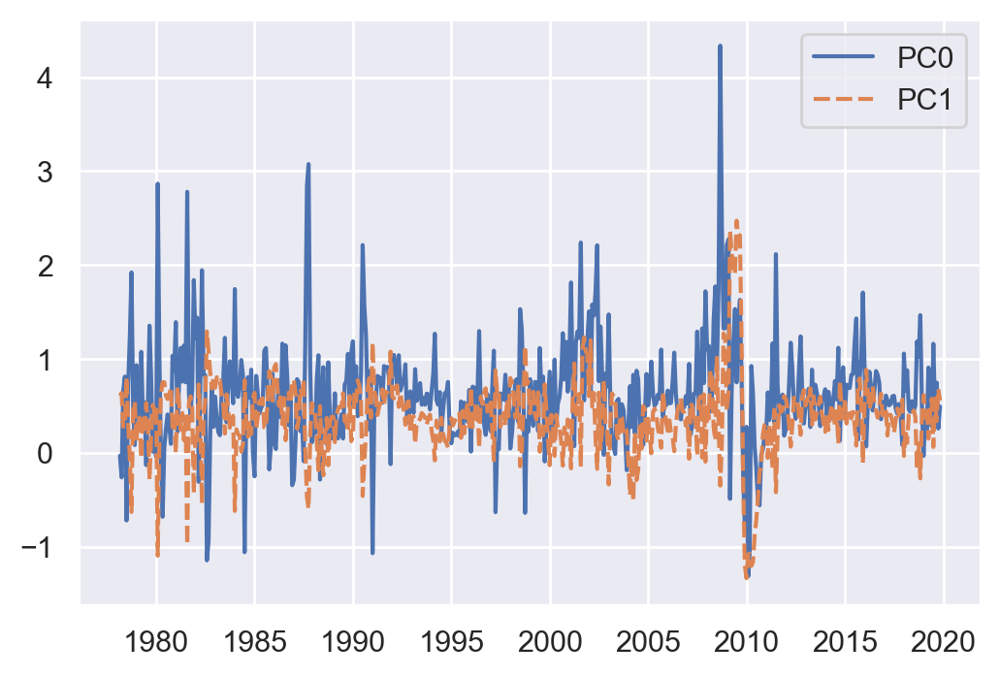

In [157]:
# Plots encoded data
sns.lineplot(data = encoded_data)

In [158]:
# Correlation matrix
encoded_data.corr()

,PC0,PC1
PC0,1.000000,-0.306844
PC1,-0.306844,1.000000


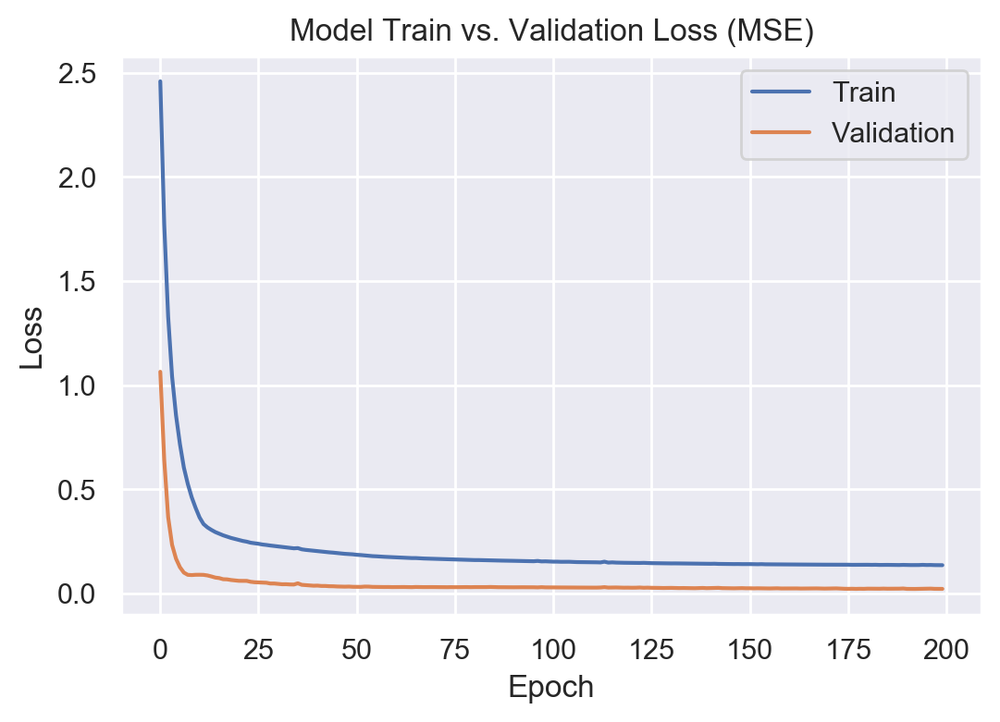

In [159]:
# Plots loss function
plt.plot(hist_autoencoder.history['loss'])
plt.plot(hist_autoencoder.history['val_loss'])
plt.title('Model Train vs. Validation Loss (MSE)')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['Train', 'Validation'], loc='upper right')
plt.show()

In [160]:
encoded_data_S = encoded_data.copy()

## LSTM

Implementation of the convetional (stacked) LSTM network for inflation forecasting.

### Model 1

As an initial attempt, only past inflation is used to forecast current inflation.

In [161]:
# Data
data_lstm_m1 = df_cpi_t_norm

# Split data into samples (input, output)
X_lstm_m1, y_lstm_m1 = split_sequence_uni(data_lstm_m1, n_lags)

# Reshape from [samples, timesteps] into [samples, timesteps, features]
# Note 1: timesteps = number of lags
# Note 2: features = number of variables
n_features = 1
X_lstm_m1 = X_lstm_m1.reshape((X_lstm_m1.shape[0], X_lstm_m1.shape[1], n_features))

# Split sample
train_features_lstm_m1, test_features_lstm_m1, train_labels_lstm_m1, test_labels_lstm_m1 = \
            train_test_split(X_lstm_m1, y_lstm_m1, test_size = share_test_size, random_state = rnd_state)

In [162]:
# Define the model
lstm_m1 = Sequential()
lstm_m1.add(LSTM(50, activation='selu', return_sequences=True, input_shape=(n_lags, n_features)))
lstm_m1.add(LSTM(50, activation='selu'))
lstm_m1.add(Dense(1))
lstm_m1.compile(optimizer='adam', loss='mse')

In [163]:
# Fit model
hist_lstm_m1 = lstm_m1.fit(X_lstm_m1, y_lstm_m1, epochs=100, verbose=0)

In [164]:
# Fitted values
yfit_lstm_m1 = lstm_m1.predict(train_features_lstm_m1)
yhat_lstm_m1 = lstm_m1.predict(test_features_lstm_m1)

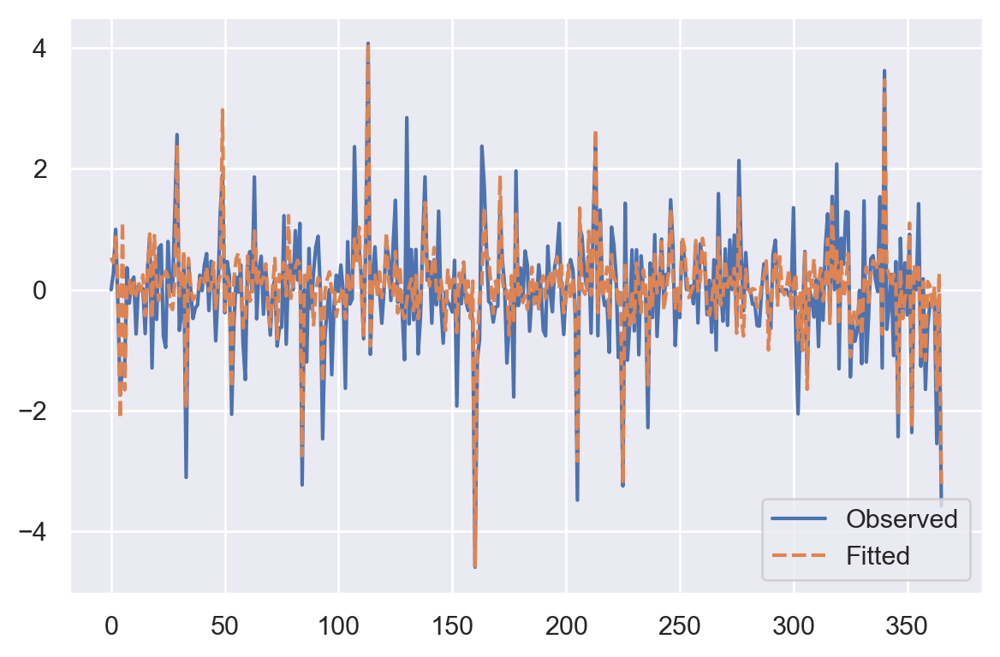

In [165]:
yfit_lstm_m1 = yfit_lstm_m1.reshape(yfit_lstm_m1.shape[0])
sns.lineplot(data=[train_labels_lstm_m1, yfit_lstm_m1])
plt.legend(['Observed', 'Fitted'], loc='lower right')
plt.tight_layout()

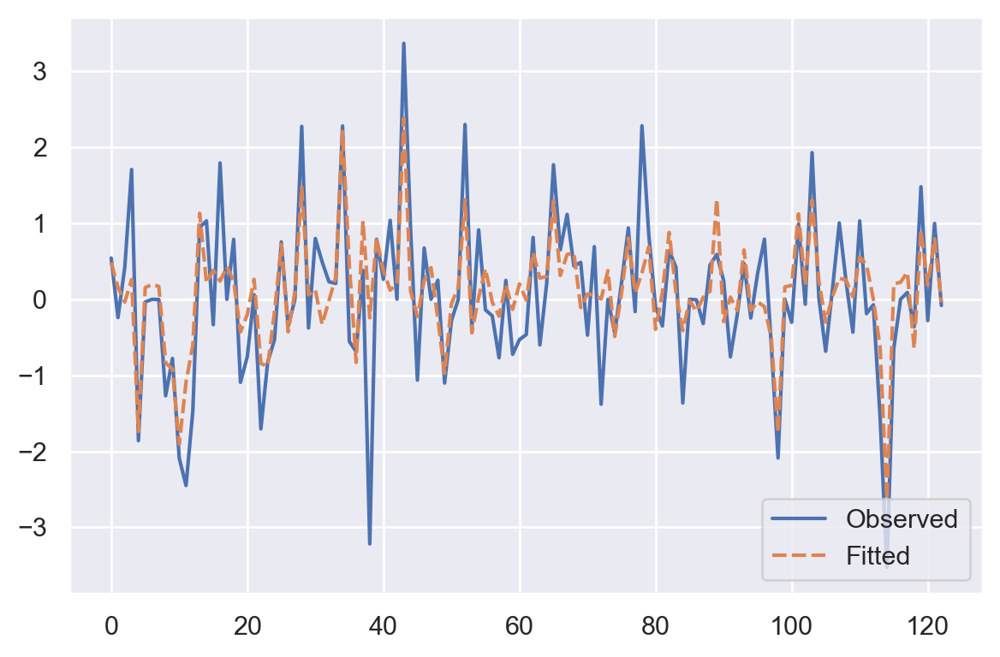

In [166]:
yhat_lstm_m1 = yhat_lstm_m1.reshape(yhat_lstm_m1.shape[0])
sns.lineplot(data=[test_labels_lstm_m1, yhat_lstm_m1])
plt.legend(['Observed', 'Fitted'], loc='lower right')
plt.tight_layout()

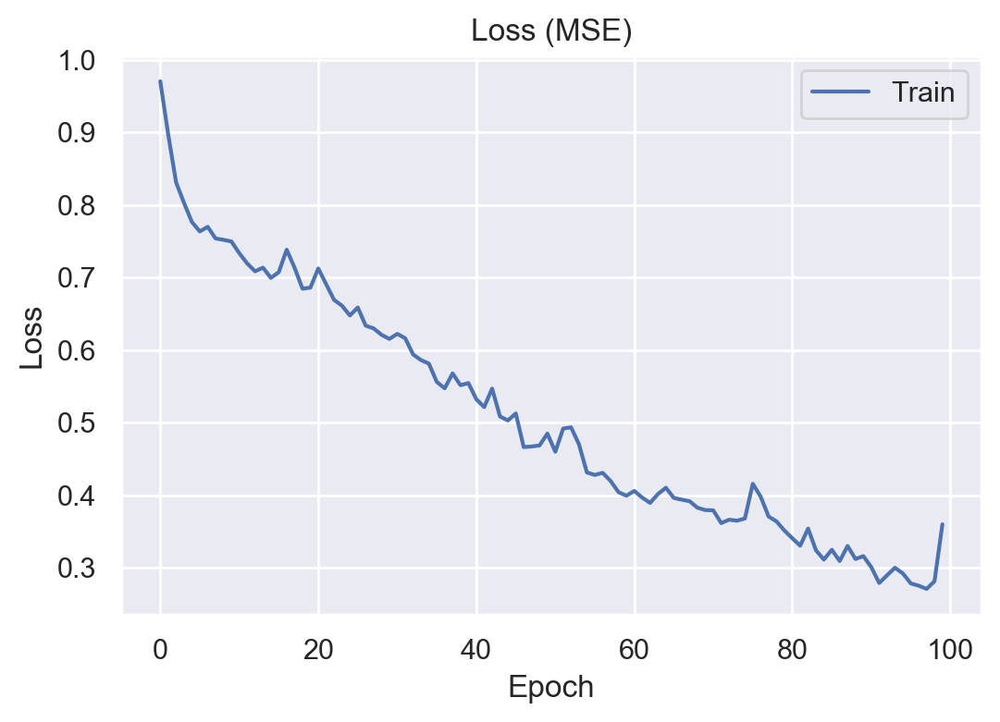

In [167]:
# plot our loss 
plt.plot(hist_lstm_m1.history['loss'])
plt.title('Loss (MSE)')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['Train'], loc='upper right')
plt.show()

### Model 2

Complete model, using exogenous variables as well. Exogenous variables correspond to the encoded variables provided by the autoencoder.

In [168]:
# Data
data_lstm_m2 = pd.concat([encoded_data_OI,
                          encoded_data_LM,
                          encoded_data_H,
                          encoded_data_COI,
                          encoded_data_MC,
                          encoded_data_INTFX,
                          encoded_data_P,
                          encoded_data_S,
                          df_cpi_t_norm], axis = 1)
data_lstm_m2 = np.array(data_lstm_m2)

# Split data into samples (input, output)
X_lstm_m2, y_lstm_m2 = split_sequence_mult(data_lstm_m2, n_lags)

# Number of variables (features)
n_features = X_lstm_m2.shape[2]

# Split sample
train_features_lstm_m2, test_features_lstm_m2, train_labels_lstm_m2, test_labels_lstm_m2 = \
            train_test_split(X_lstm_m2, y_lstm_m2, test_size = share_test_size, random_state = rnd_state)

In [169]:
# Define the model
lstm_m2 = Sequential()
lstm_m2.add(LSTM(50, activation='selu', return_sequences=True, input_shape=(n_lags, n_features)))
lstm_m2.add(LSTM(50, activation='selu'))
lstm_m2.add(Dense(1))
lstm_m2.compile(optimizer='adam', loss='mse')

In [170]:
# Fit model
hist_lstm_m2 = lstm_m2.fit(train_features_lstm_m2, train_labels_lstm_m2, epochs=100, verbose=0)

In [171]:
# Fitted values
yfit_lstm_m2 = lstm_m2.predict(train_features_lstm_m2)
yhat_lstm_m2 = lstm_m2.predict(test_features_lstm_m2)

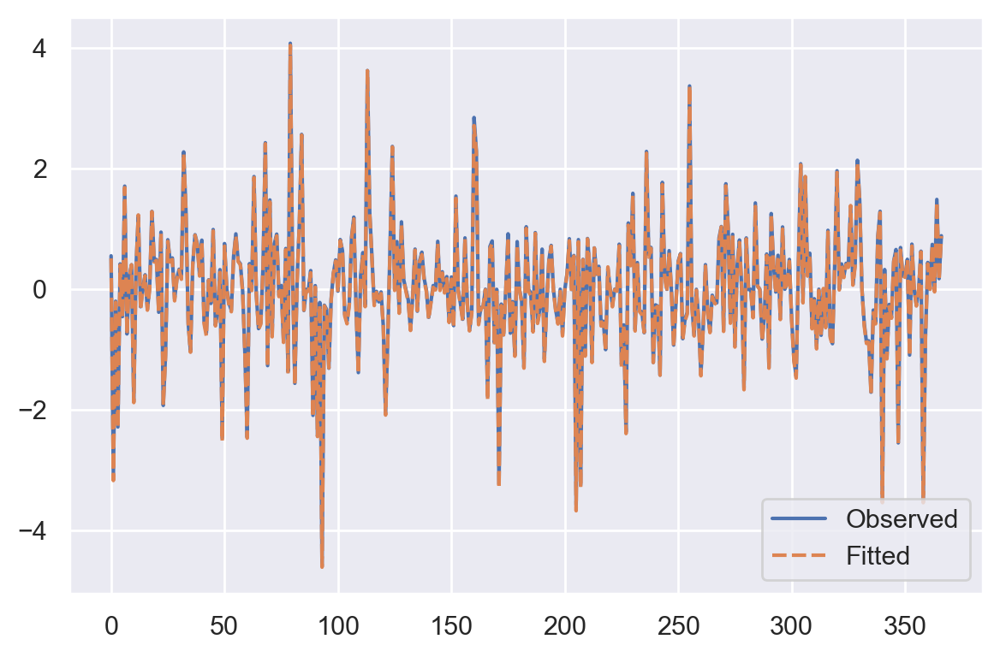

In [172]:
yfit_lstm_m2 = yfit_lstm_m2.reshape(yfit_lstm_m2.shape[0])
sns.lineplot(data=[train_labels_lstm_m2, yfit_lstm_m2])
plt.legend(['Observed', 'Fitted'], loc='lower right')
plt.tight_layout()

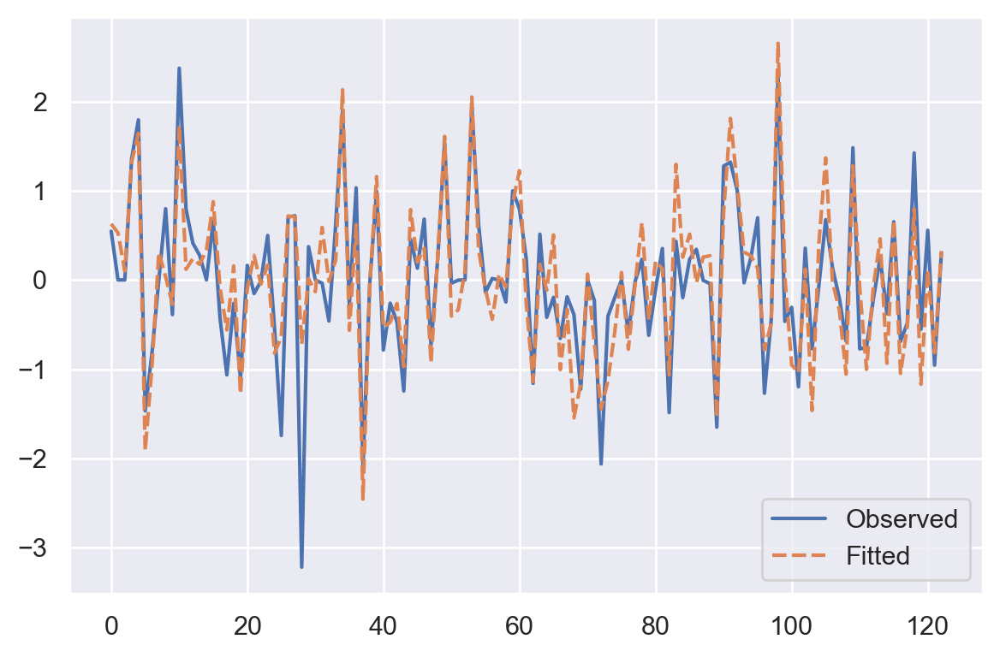

In [173]:
yhat_lstm_m2 = yhat_lstm_m2.reshape(yhat_lstm_m2.shape[0])
sns.lineplot(data=[test_labels_lstm_m2, yhat_lstm_m2])
plt.legend(['Observed', 'Fitted'], loc='lower right')
plt.tight_layout()

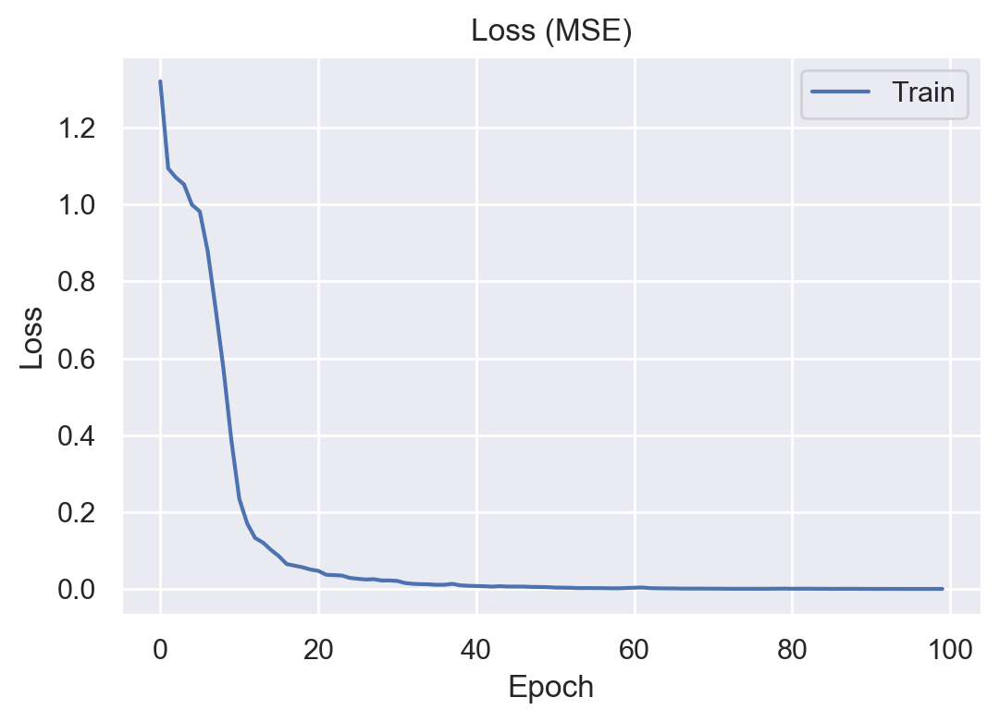

In [174]:
# Plot our loss 
plt.plot(hist_lstm_m2.history['loss'])
plt.title('Loss (MSE)')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['Train'], loc='upper right')
plt.show()

### Model 3

Same as model 2, but using the entire dataset instead of the encoded data.

In [175]:
# Data
data_lstm_m3 = pd.concat([df_FRED_MD_t_norm_ex_nan_L1, df_cpi_t_norm], axis = 1)
data_lstm_m3 = np.array(data_lstm_m3)

# Split data into samples (input, output)
X_lstm_m3, y_lstm_m3 = split_sequence_mult(data_lstm_m3, n_lags)

# Number of variables (features)
n_features = X_lstm_m3.shape[2]

# Split sample
train_features_lstm_m3, test_features_lstm_m3, train_labels_lstm_m3, test_labels_lstm_m3 = \
            train_test_split(X_lstm_m3, y_lstm_m3, test_size = share_test_size, random_state = rnd_state)

In [176]:
# Define the model
lstm_m3 = Sequential()
lstm_m3.add(LSTM(50, activation='selu', return_sequences=True, input_shape=(n_lags, n_features)))
lstm_m3.add(LSTM(50, activation='selu'))
lstm_m3.add(Dense(1))
lstm_m3.compile(optimizer='adam', loss='mse')

In [177]:
# Fit model
# hist_lstm_m2 = lstm_m2.fit(X_lstm_m2, y, epochs=300, verbose=0)
hist_lstm_m3 = lstm_m3.fit(train_features_lstm_m3, train_labels_lstm_m3, epochs=100, verbose=0)

In [178]:
# Fitted values
yfit_lstm_m3 = lstm_m3.predict(train_features_lstm_m3)
yhat_lstm_m3 = lstm_m3.predict(test_features_lstm_m3)

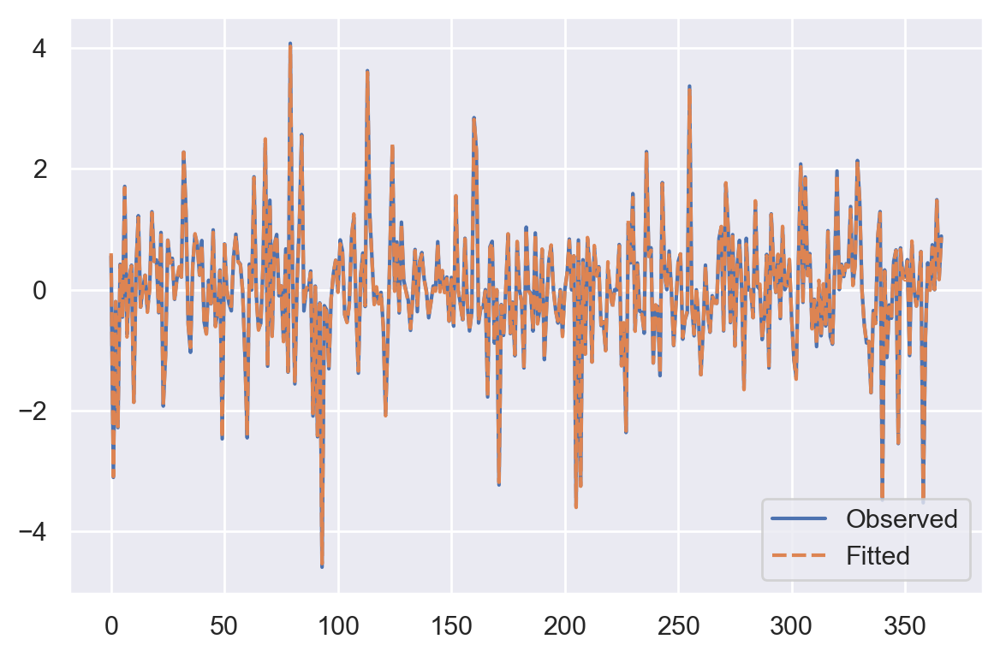

In [179]:
yfit_lstm_m3 = yfit_lstm_m3.reshape(yfit_lstm_m3.shape[0])
sns.lineplot(data=[train_labels_lstm_m3, yfit_lstm_m3])
plt.legend(['Observed', 'Fitted'], loc='lower right')
plt.tight_layout()

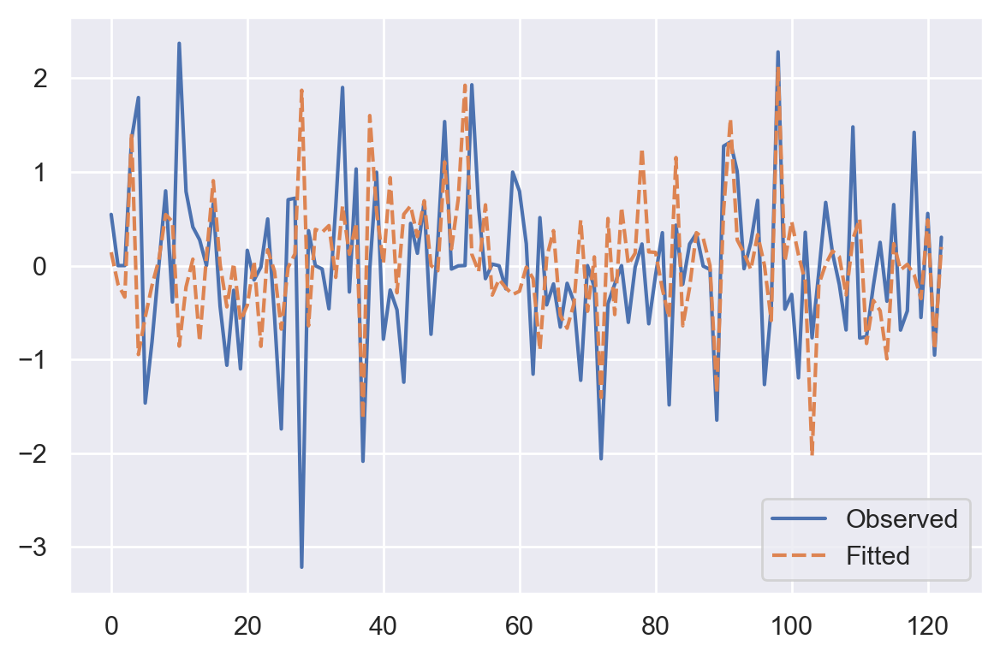

In [180]:
yhat_lstm_m3 = yhat_lstm_m3.reshape(yhat_lstm_m3.shape[0])
sns.lineplot(data=[test_labels_lstm_m3, yhat_lstm_m3])
plt.legend(['Observed', 'Fitted'], loc='lower right')
plt.tight_layout()

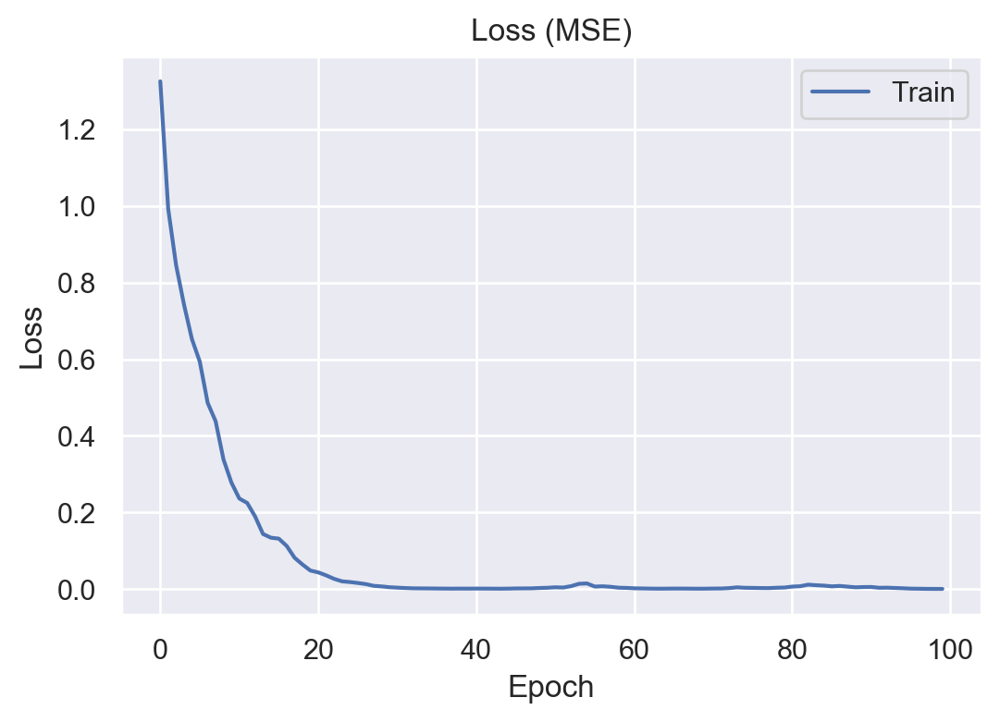

In [181]:
# Plot our loss 
plt.plot(hist_lstm_m3.history['loss'])
plt.title('Loss (MSE)')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['Train'], loc='upper right')
plt.show()

### Out-of-the-sample Perfomance

In [182]:
np.sum((yhat_lstm_m1 - test_labels_lstm_m1)**2)

49.032379796880065

In [183]:
np.sum((yhat_lstm_m2 - test_labels_lstm_m2)**2)

24.55936059863

In [184]:
np.sum((yhat_lstm_m3 - test_labels_lstm_m3)**2)

107.25950550844524

## Benchmarks

### Random Walk

In [185]:
y_rw = df_cpi_t_norm
yhat_rw = df_cpi_t_norm.shift(-1).dropna()
y_rw = y_rw[yhat_rw.index]

In [186]:
pd.concat([y_rw, yhat_rw], axis = 1)

,CPIAUCSL,CPIAUCSL
Date,,
1978-03-01,0.588773,0.577647
1978-04-01,0.577647,0.564064
1978-05-01,0.564064,-0.610849
1978-06-01,-0.610849,-0.020543
1978-07-01,-0.020543,-0.592271
...,...,...
2019-06-01,0.017741,0.665006
2019-07-01,0.665006,-0.703903
2019-08-01,-0.703903,0.136832


[]

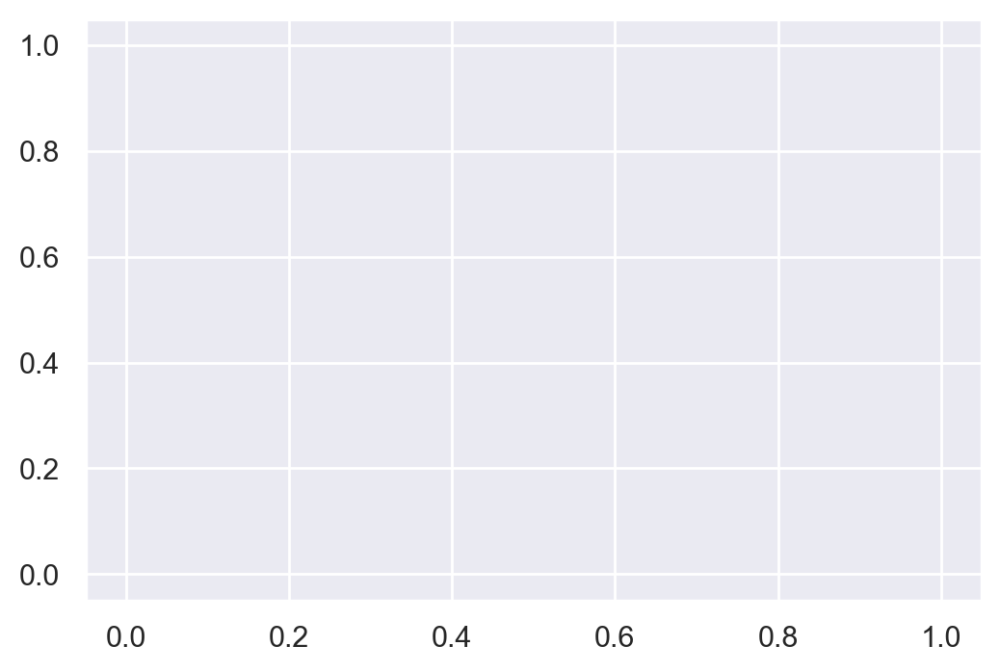

In [187]:
plt.plot(data=pd.concat([y_rw, yhat_rw], axis = 1))

### SARIMA

Optimal (p,q) selected using BIC.

Note: data is seasonally adjusted.

In [188]:
sample_size = len(df_cpi_t_norm)
train_size = int(np.floor((1-share_test_size)*sample_size))
train_sample = df_cpi_t_norm.iloc[:train_size]
exog_train_sample = df_FRED_MD_t_norm_ex_nan_L1.iloc[:train_size,:]
test_sample = df_cpi_t_norm.iloc[train_size:]
exog_test_sample = df_FRED_MD_t_norm_ex_nan_L1.iloc[train_size:,:]

In [189]:
# Runs several SARIMA(p,0,q) models to find the feasible one with mininum BIC

# Stores BIC value
sarima_bic = np.inf

# Seasonal order kept constant because data is seasonally adjusted
seasonal_order = (0,0,0,12) # 12 = seasonality parameter

for p in np.arange(0,3):
    
    for q in np.arange(0,3):
        
        print("p = " + str(p) + " / " + "q = " + str(q))
        
        arma_order = (p,0,q)
        #sarima_aux = SARIMAX(endog = train_sample, exog = exog_train_sample,
        #                     order = arma_order, seasonal_order = seasonal_order, trend = 'c')
        sarima_aux = SARIMAX(endog = train_sample,
                             order = arma_order, seasonal_order = seasonal_order, trend = 'c')
        sarima_aux_fit = sarima_aux.fit()
        if sarima_aux_fit.bic < sarima_bic and np.min(sarima_aux_fit.pvalues[1:] < alfa) == True:
            sarima = sarima_aux
            k_fit = arma_order[0] + arma_order[2]
            sarima_fit = sarima_aux_fit
            sarima_bic = sarima_aux_fit.bic

sarima_fit.summary()

p = 0 / q = 0
p = 0 / q = 1
p = 0 / q = 2
p = 1 / q = 0
p = 1 / q = 1
p = 1 / q = 2
p = 2 / q = 0
p = 2 / q = 1
p = 2 / q = 2


<class 'statsmodels.iolib.summary.Summary'>
"""
                               SARIMAX Results                                
==============================================================================
Dep. Variable:               CPIAUCSL   No. Observations:                  375
Model:               SARIMAX(0, 0, 2)   Log Likelihood                -492.736
Date:                Sat, 29 Aug 2020   AIC                            993.472
Time:                        00:01:48   BIC                           1009.180
Sample:                    03-01-1978   HQIC                           999.708
                         - 05-01-2009                                         
Covariance Type:                  opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
intercept     -0.0063      0.007     -0.912      0.362      -0.020       0.007
ma.L1         -0.4100      0.027    -15.400      0.000      -0.462      -0.358
ma.L2         -0.4555      0.031    -14.830      0.000      -0.516      -0.395
sigma2         0.8078      0.035     23.230      0.000       0.740       0.876
===================================================================================
Ljung-Box (Q):                       75.34   Jarque-Bera (JB):               588.59
Prob(Q):                              0.00   Prob(JB):                         0.00
Heteroskedasticity (H):               1.94   Skew:                            -1.03
Prob(H) (two-sided):                  0.00   Kurtosis:                         8.78
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

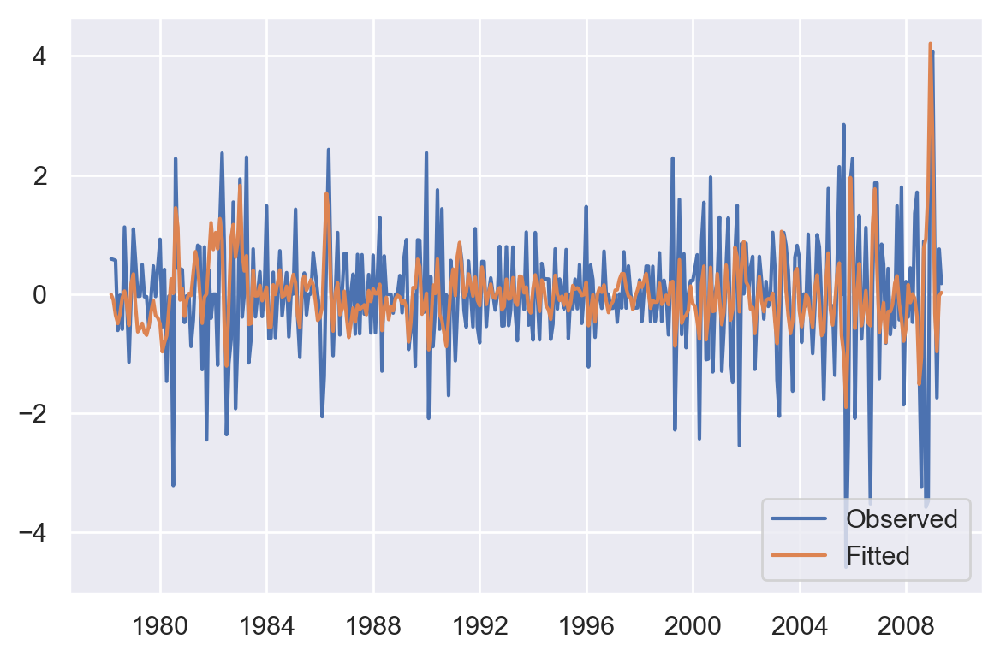

In [190]:
plt.plot(pd.concat([train_sample, sarima_fit.fittedvalues], axis = 1))
plt.legend(['Observed', 'Fitted'], loc='lower right')
plt.tight_layout()

In [191]:
R2 = 1-sarima_fit.sse/(np.sum((df_cpi_t_norm-np.mean(df_cpi_t_norm))**2))
n = len(df_cpi_t_norm)
R2_adj = 1 - (1-R2)*(n-1)/(n-k_fit-1)
print(R2_adj)

0.3931430974736263


In [192]:
yhat_sarima = sarima_fit.forecast(len(test_sample))

In [193]:
np.sum((yhat_sarima - test_sample)**2)

95.9564474998536

### Regime Switching (Markov Chain)

In [194]:
y_reg_switch_model = df_cpi_t_norm
reg_switch_model = sm.tsa.MarkovAutoregression(y_reg_switch_model, k_regimes=2, order=2, switching_ar=True)
reg_switch_model_fit = reg_switch_model.fit()

In [195]:
reg_switch_model_fit.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                         Markov Switching Model Results                         
================================================================================
Dep. Variable:                 CPIAUCSL   No. Observations:                  499
Model:             MarkovAutoregression   Log Likelihood                -645.685
Date:                  Sat, 29 Aug 2020   AIC                           1309.370
Time:                          00:01:49   BIC                           1347.283
Sample:                      03-01-1978   HQIC                          1324.248
                           - 11-01-2019                                         
Covariance Type:                 approx                                         
                             Regime 0 parameters                              
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const         -0.0264      0.087     -0.305      0.760      -0.196       0.143
ar.L1          0.3614      0.092      3.917      0.000       0.181       0.542
ar.L2         -0.6620      0.098     -6.736      0.000      -0.855      -0.469
                             Regime 1 parameters                              
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const          0.0025      0.026      0.098      0.922      -0.048       0.054
ar.L1         -0.4972      0.055     -8.965      0.000      -0.606      -0.389
ar.L2         -0.2393      0.052     -4.585      0.000      -0.342      -0.137
                           Non-switching parameters                           
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
sigma2         0.6727      0.046     14.642      0.000       0.583       0.763
                         Regime transition parameters                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
p[0->0]        0.7125      0.112      6.361      0.000       0.493       0.932
p[1->0]        0.0689      0.033      2.104      0.035       0.005       0.133
==============================================================================

Warnings:
[1] Covariance matrix calculated using numerical (complex-step) differentiation.
"""

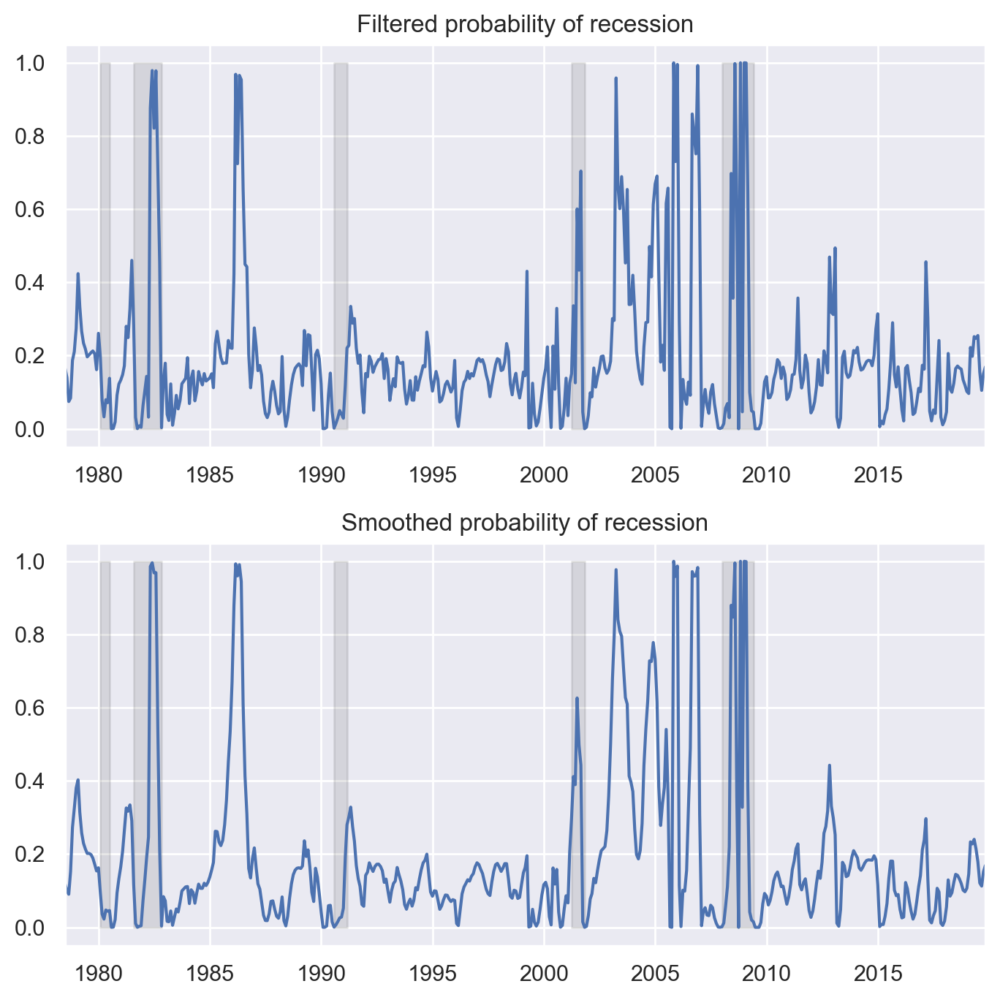

In [196]:
fig, axes = plt.subplots(2, figsize=(7,7))
ax = axes[0]
ax.plot(reg_switch_model_fit.filtered_marginal_probabilities[0])
ax.fill_between(usrec.index, 0, 1, where=usrec['USREC'].values, color='k', alpha=0.1)
ax.set_xlim(y_reg_switch_model.index[4], y_reg_switch_model.index[-1])
ax.set(title='Filtered probability of recession')

ax = axes[1]
ax.plot(reg_switch_model_fit.smoothed_marginal_probabilities[0])
ax.fill_between(usrec.index, 0, 1, where=usrec['USREC'].values, color='k', alpha=0.1)
ax.set_xlim(y_reg_switch_model.index[4], y_reg_switch_model.index[-1])
ax.set(title='Smoothed probability of recession')

fig.tight_layout()

### Ridge Regression

In [197]:
# Data
X_ridge = pd.concat([df_FRED_MD_t_norm_ex_nan_L1, df_FRED_MD_t_norm_ex_nan_L2,
                    df_FRED_MD_t_norm_ex_nan_L3, df_FRED_MD_t_norm_ex_nan_L4,
                    df_FRED_MD_t_norm_ex_nan_L5, df_FRED_MD_t_norm_ex_nan_L6,
                    df_FRED_MD_t_norm_ex_nan_L7, df_FRED_MD_t_norm_ex_nan_L8,
                    df_FRED_MD_t_norm_ex_nan_L9, df_FRED_MD_t_norm_ex_nan_L10,
                    df_FRED_MD_t_norm_ex_nan_L11], axis = 1)
X_ridge = X_ridge.dropna()
y_ridge = df_cpi_t_norm[X_ridge.index]

# Split sample
train_features_ridge, test_features_ridge, train_labels_ridge, test_labels_ridge = \
            train_test_split(X_ridge, y_ridge, test_size = share_test_size, random_state = rnd_state)

In [198]:
ridge_model = Ridge(alpha = 1.0)
ridge_model_fit = ridge_model.fit(train_features_ridge, train_labels_ridge)

In [199]:
# R2
ridge_model.score(train_features_ridge, train_labels_ridge)

0.9999813194144646

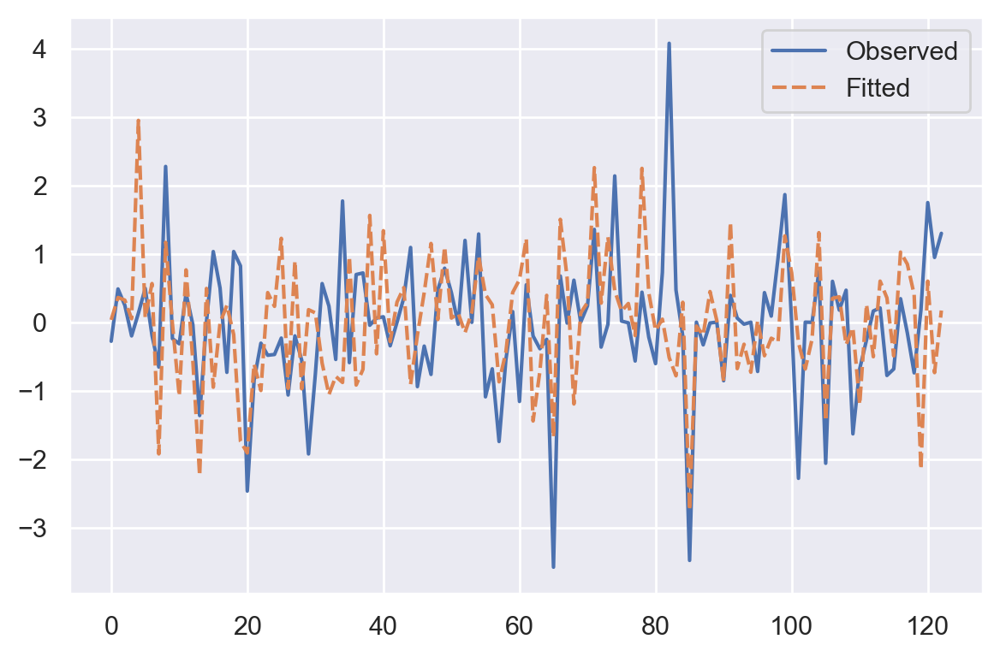

In [200]:
sns.lineplot(data=pd.concat([pd.Series(np.array(test_labels_ridge)),
                             pd.Series(np.array(ridge_model.predict(test_features_ridge)))], 
                             axis = 1))
plt.legend(['Observed', 'Fitted'])
plt.tight_layout()
plt.show()

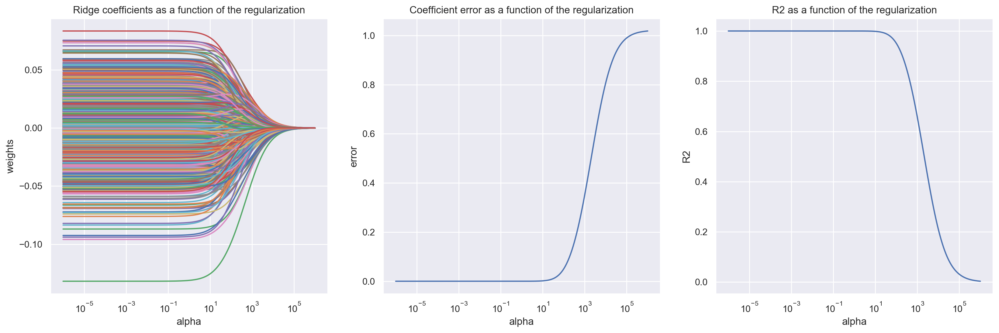

In [201]:
clf = Ridge()
coefs = pd.DataFrame()
errors = pd.DataFrame()
r2 = pd.DataFrame()

alphas = np.logspace(-6, 6, 200)

# Train the model with different regularization strengths
for a in alphas:
    clf.set_params(alpha=a)
    clf.fit(train_features_ridge, train_labels_ridge)
    coefs = pd.concat([coefs, pd.DataFrame(data = clf.coef_).T], axis = 0)
    y_pred = clf.predict(train_features_ridge)
    errors = pd.concat([errors, pd.Series(mean_squared_error(train_labels_ridge, y_pred))], axis = 0)
    r2 = pd.concat([r2, pd.Series(clf.score(train_features_ridge, train_labels_ridge))], axis = 0)

# Display results
plt.figure(figsize=(20, 6))

plt.subplot(131)
ax = plt.gca()
ax.plot(alphas, coefs)
ax.set_xscale('log')
plt.xlabel('alpha')
plt.ylabel('weights')
plt.title('Ridge coefficients as a function of the regularization')
plt.axis('tight')

plt.subplot(132)
ax = plt.gca()
ax.plot(alphas, errors)
ax.set_xscale('log')
plt.xlabel('alpha')
plt.ylabel('error')
plt.title('Coefficient error as a function of the regularization')
plt.axis('tight')

plt.subplot(133)
ax = plt.gca()
ax.plot(alphas, r2)
ax.set_xscale('log')
plt.xlabel('alpha')
plt.ylabel('R2')
plt.title('R2 as a function of the regularization')
plt.axis('tight')

plt.show()

In [202]:
np.sum((np.array(test_labels_ridge) - np.array(ridge_model.predict(test_features_ridge)))**2)

152.9512677287834

### Ridge Regression with Leave-One-Out Cross Validation

In [203]:
ridge_model_cv = RidgeCV(alphas=[1e-4, 1e-3, 1e-2, 1e-1, 1, 10, 100]).fit(train_features_ridge, train_labels_ridge)

In [204]:
ridge_model_cv.score(train_features_ridge, train_labels_ridge)

0.9509421314893625

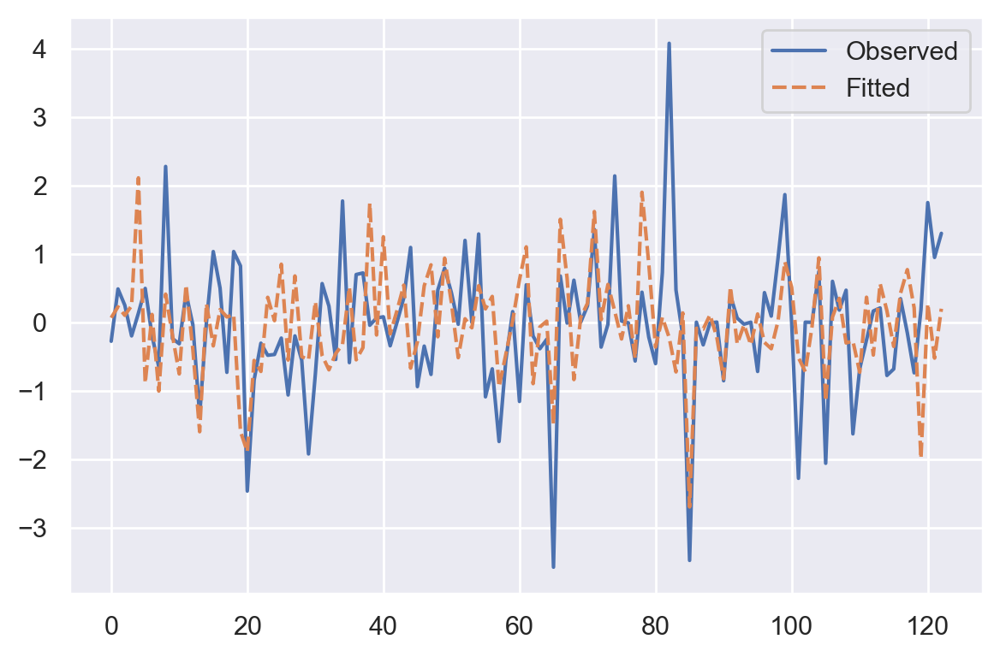

In [205]:
sns.lineplot(data=pd.concat([pd.Series(np.array(test_labels_ridge)),
                             pd.Series(np.array(ridge_model_cv.predict(test_features_ridge)))], 
                             axis = 1))
plt.legend(['Observed', 'Fitted'])
plt.tight_layout()
plt.show()

In [206]:
np.sum((np.array(test_labels_ridge) - np.array(ridge_model_cv.predict(test_features_ridge)))**2)

120.32621944033103

### Bayesian Ridge Regression

In [299]:
bridge_model = BayesianRidge()

### LASSO Regression

In [207]:
X_lasso = pd.concat([df_FRED_MD_t_norm_ex_nan_L1, df_FRED_MD_t_norm_ex_nan_L2,
                    df_FRED_MD_t_norm_ex_nan_L3, df_FRED_MD_t_norm_ex_nan_L4,
                    df_FRED_MD_t_norm_ex_nan_L5, df_FRED_MD_t_norm_ex_nan_L6,
                    df_FRED_MD_t_norm_ex_nan_L7, df_FRED_MD_t_norm_ex_nan_L8,
                    df_FRED_MD_t_norm_ex_nan_L9, df_FRED_MD_t_norm_ex_nan_L10,
                    df_FRED_MD_t_norm_ex_nan_L11], axis = 1)
X_lasso = X_lasso.dropna()
y_lasso = df_cpi_t_norm[X_lasso.index]

# Split sample
train_features_lasso, test_features_lasso, train_labels_lasso, test_labels_lasso = \
            train_test_split(X_ridge, y_ridge, test_size = share_test_size, random_state = rnd_state)

In [208]:
lasso_model = Lasso(alpha = 1e-3)
lasso_model_fit = lasso_model.fit(train_features_lasso, train_labels_lasso)

In [209]:
lasso_model.score(X_lasso, y_lasso)

0.6218479085760995

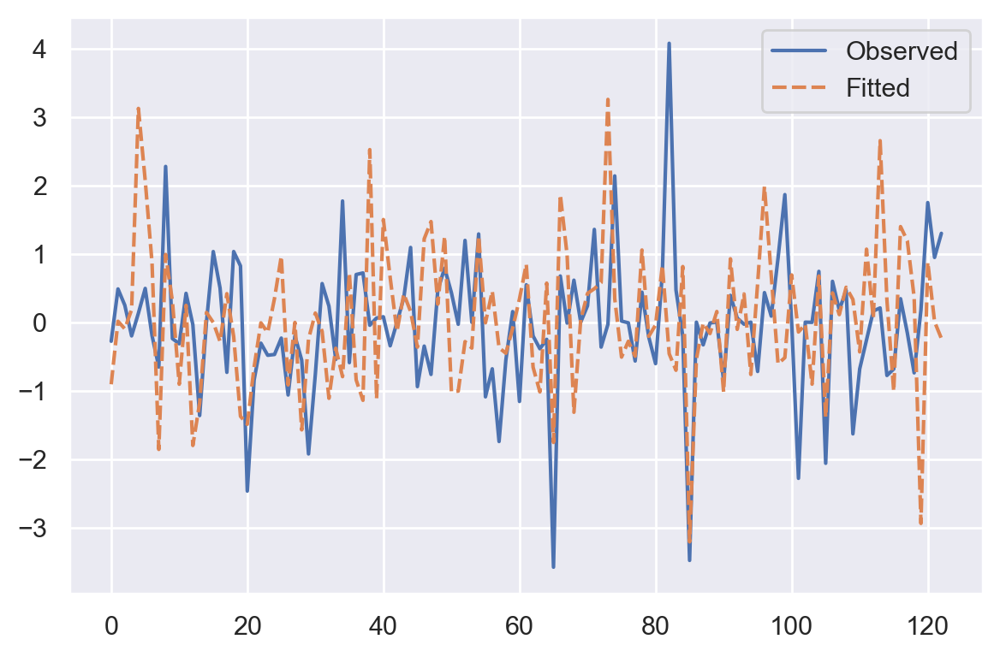

In [210]:
sns.lineplot(data=pd.concat([pd.Series(np.array(test_labels_ridge)),
                             pd.Series(np.array(lasso_model.predict(test_features_lasso)))], 
                             axis = 1))
plt.legend(['Observed', 'Fitted'])
plt.tight_layout()
plt.show()

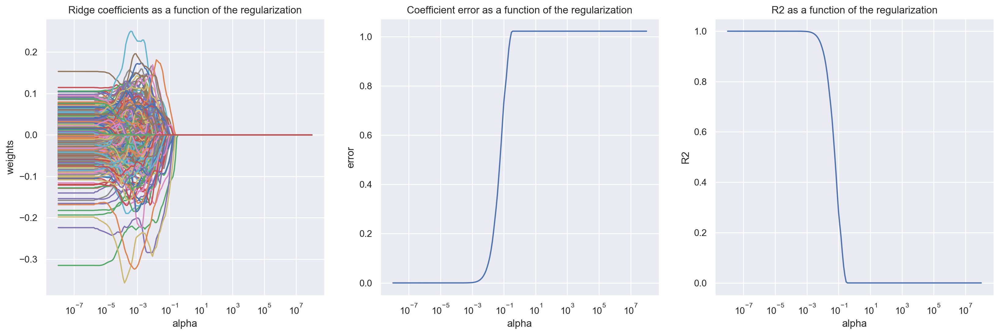

In [211]:
clf = Lasso()
coefs = pd.DataFrame()
errors = pd.DataFrame()
r2 = pd.DataFrame()

alphas = np.logspace(-8, 8, 200)

# Train the model with different regularization strengths
for a in alphas:
    clf.set_params(alpha=a)
    clf.fit(train_features_lasso, train_labels_lasso)
    coefs = pd.concat([coefs, pd.DataFrame(clf.coef_).T], axis = 0)
    y_pred = clf.predict(train_features_lasso)
    errors = pd.concat([errors, pd.Series(mean_squared_error(train_labels_lasso, y_pred))], axis = 0)
    r2 = pd.concat([r2, pd.Series(clf.score(train_features_lasso, train_labels_lasso))], axis = 0)

# Display results
plt.figure(figsize=(20, 6))

plt.subplot(131)
ax = plt.gca()
ax.plot(alphas, coefs)
ax.set_xscale('log')
plt.xlabel('alpha')
plt.ylabel('weights')
plt.title('Ridge coefficients as a function of the regularization')
plt.axis('tight')

plt.subplot(132)
ax = plt.gca()
ax.plot(alphas, errors)
ax.set_xscale('log')
plt.xlabel('alpha')
plt.ylabel('error')
plt.title('Coefficient error as a function of the regularization')
plt.axis('tight')

plt.subplot(133)
ax = plt.gca()
ax.plot(alphas, r2)
ax.set_xscale('log')
plt.xlabel('alpha')
plt.ylabel('R2')
plt.title('R2 as a function of the regularization')
plt.axis('tight')

plt.show()

In [212]:
np.sum((np.array(test_labels_lasso) - np.array(lasso_model.predict(test_features_lasso)))**2)

187.98333566530775

### Lasso Regression with Leave-One-Out Cross Validation

In [213]:
lasso_model_cv = LassoCV(alphas=[1e-4, 1e-3, 1e-2, 1e-1, 1, 10, 100]).fit(train_features_lasso, train_labels_lasso)

In [214]:
lasso_model_cv.score(train_features_lasso, train_labels_lasso)

0.27952247826941146

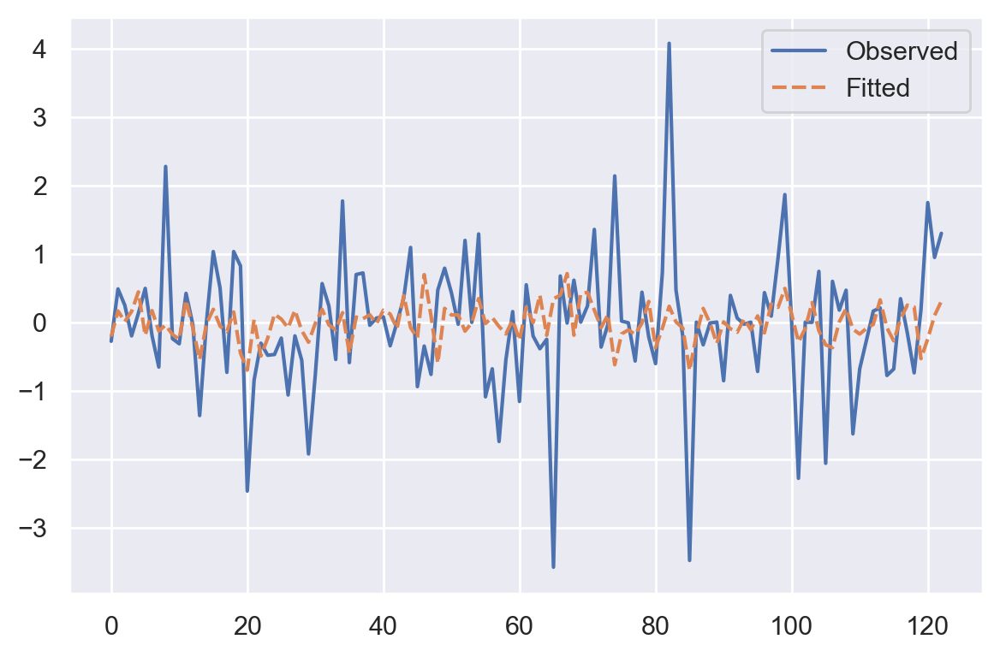

In [215]:
sns.lineplot(data=pd.concat([pd.Series(np.array(test_labels_lasso)),
                             pd.Series(np.array(lasso_model_cv.predict(test_features_lasso)))], 
                             axis = 1))
plt.legend(['Observed', 'Fitted'])
plt.tight_layout()
plt.show()

In [216]:
np.sum((np.array(test_labels_lasso) - np.array(lasso_model_cv.predict(test_features_lasso)))**2)

112.84840408971603

### Elastic Net with Cross Validation

In [217]:
X_enet = pd.concat([df_FRED_MD_t_norm_ex_nan_L1, df_FRED_MD_t_norm_ex_nan_L2,
                    df_FRED_MD_t_norm_ex_nan_L3, df_FRED_MD_t_norm_ex_nan_L4,
                    df_FRED_MD_t_norm_ex_nan_L5, df_FRED_MD_t_norm_ex_nan_L6,
                    df_FRED_MD_t_norm_ex_nan_L7, df_FRED_MD_t_norm_ex_nan_L8,
                    df_FRED_MD_t_norm_ex_nan_L9, df_FRED_MD_t_norm_ex_nan_L10,
                    df_FRED_MD_t_norm_ex_nan_L11], axis = 1)
X_enet = X_enet.dropna()
y_enet = df_cpi_t_norm[X_enet.index]

# Split sample
train_features_enet, test_features_enet, train_labels_enet, test_labels_enet = \
            train_test_split(X_enet, y_enet, test_size = share_test_size, random_state = rnd_state)

In [218]:
# Note that a good choice of list of values for l1_ratio is often to put 
# more values close to 1 (i.e. Lasso) and less close to 0 (i.e. Ridge)

enet_model = ElasticNetCV(cv = 5, l1_ratio = [.1, .5, .7, .9, .95, .99, 1], random_state = rnd_state)
enet_model_fit = enet_model.fit(train_features_enet, train_labels_enet)

In [219]:
enet_model.score(train_features_enet, train_labels_enet)

0.2552873698216842

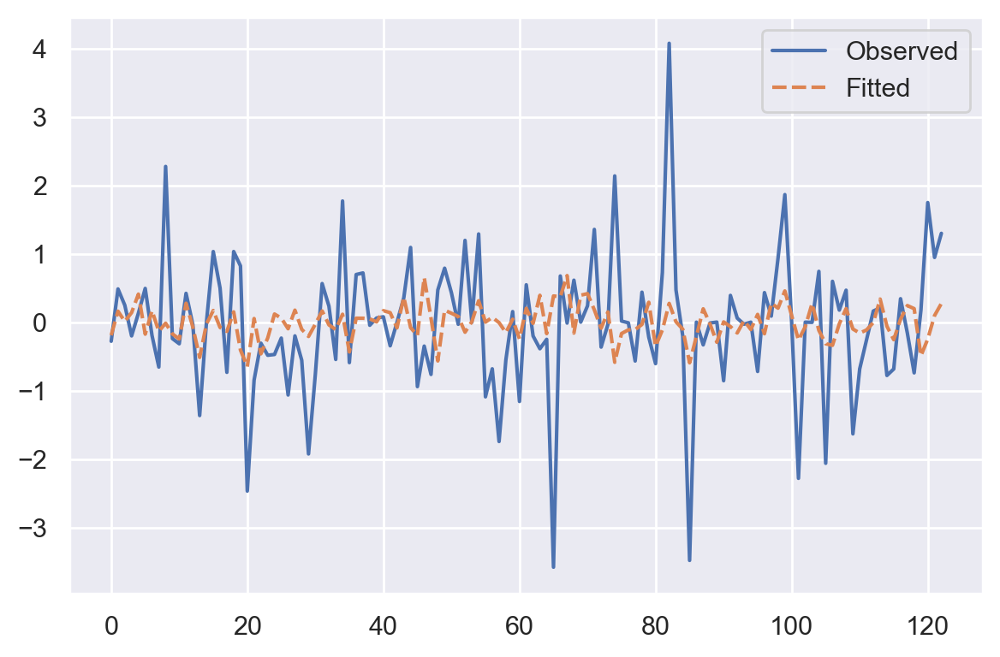

In [220]:
sns.lineplot(data=pd.concat([pd.Series(np.array(test_labels_enet)),
                             pd.Series(np.array(enet_model.predict(test_features_enet)))], 
                             axis = 1))
plt.legend(['Observed', 'Fitted'])
plt.tight_layout()
plt.show()

In [221]:
np.sum((np.array(test_labels_enet) - np.array(enet_model.predict(test_features_enet)))**2)

114.21159044610914

### AdaLASSO

### Support Vector Regression

In [222]:
X_svr = pd.concat([df_FRED_MD_t_norm_ex_nan_L1, df_FRED_MD_t_norm_ex_nan_L2,
                    df_FRED_MD_t_norm_ex_nan_L3, df_FRED_MD_t_norm_ex_nan_L4,
                    df_FRED_MD_t_norm_ex_nan_L5, df_FRED_MD_t_norm_ex_nan_L6,
                    df_FRED_MD_t_norm_ex_nan_L7, df_FRED_MD_t_norm_ex_nan_L8,
                    df_FRED_MD_t_norm_ex_nan_L9, df_FRED_MD_t_norm_ex_nan_L10,
                    df_FRED_MD_t_norm_ex_nan_L11], axis = 1)
X_svr = X_svr.dropna()
y_svr = df_cpi_t_norm[X_svr.index]

# Split sample
train_features_svr, test_features_svr, train_labels_svr, test_labels_svr = \
            train_test_split(X_svr, y_svr, test_size = share_test_size, random_state = rnd_state)

In [223]:
# C is the regularization parameter. 
# The strength of the regularization is inversely proportional to C.
# Must be strictly positive. The penalty is a squared l2 penalty.

# Epsilon: Epsilon in the epsilon-SVR model. It specifies the epsilon-tube within which
# no penalty is associated in the training loss function with points predicted within 
# a distance epsilon from the actual value.

# Kernels: it seems that 'rbf' and 'linear' are the most appropriate for our data

regr = make_pipeline(StandardScaler(), SVR(C=10e2, epsilon=0.2, gamma = 'scale', kernel = 'linear'))

In [224]:
regr.fit(train_features_svr, train_labels_svr)

Pipeline(memory=None,
         steps=[('standardscaler',
                 StandardScaler(copy=True, with_mean=True, with_std=True)),
                ('svr',
                 SVR(C=1000.0, cache_size=200, coef0=0.0, degree=3, epsilon=0.2,
                     gamma='scale', kernel='linear', max_iter=-1,
                     shrinking=True, tol=0.001, verbose=False))],
         verbose=False)

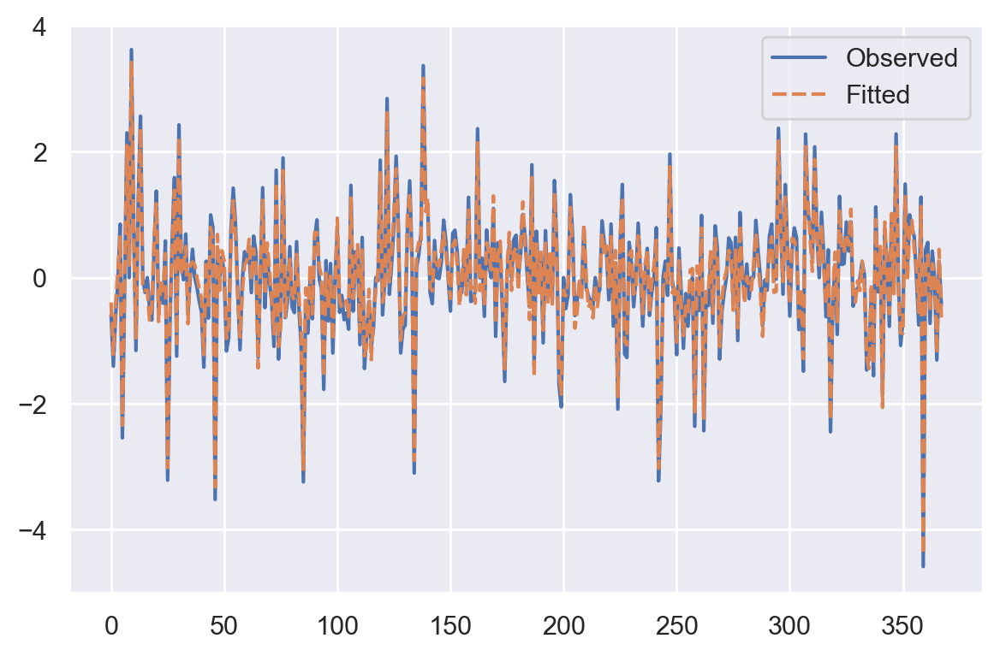

In [225]:
sns.lineplot(data=pd.concat([pd.Series(np.array(train_labels_svr)),
                             pd.Series(np.array(regr.predict(train_features_svr)))], 
                             axis = 1))
plt.legend(['Observed', 'Fitted'])
plt.tight_layout()
plt.show()

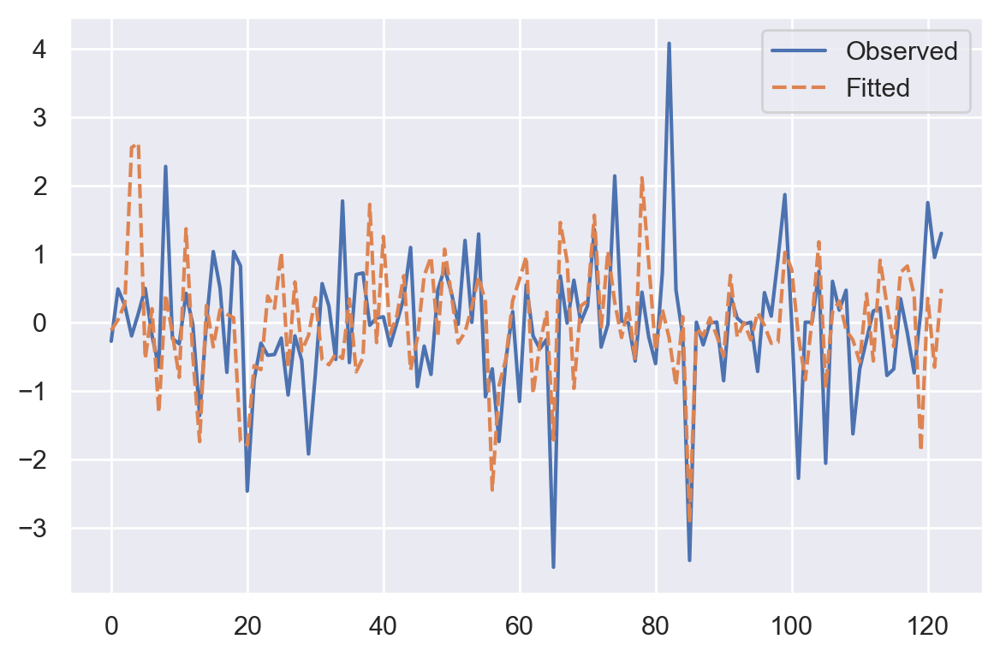

In [226]:
sns.lineplot(data=pd.concat([pd.Series(np.array(test_labels_svr)),
                             pd.Series(np.array(regr.predict(test_features_svr)))], 
                             axis = 1))
plt.legend(['Observed', 'Fitted'])
plt.tight_layout()
plt.show()

In [227]:
np.sum((np.array(test_labels_svr) - np.array(regr.predict(test_features_svr)))**2)

141.50953451971793

### Random Forests

In [228]:
# Data
X_rf = df_FRED_MD_t_norm_ex_nan_L1
X_rf = X_rf.dropna()
y_rf = df_cpi_t_norm[X_rf.index]

# Split sample
train_features_rf, test_features_rf, train_labels_rf, test_labels_rf = \
            train_test_split(X_rf, y_rf, test_size = share_test_size, random_state = rnd_state)

In [229]:
rf = RandomForestRegressor(n_estimators = 100, random_state = rnd_state)

In [230]:
rf.fit(train_features_rf, train_labels_rf)

RandomForestRegressor(bootstrap=True, ccp_alpha=0.0, criterion='mse',
                      max_depth=None, max_features='auto', max_leaf_nodes=None,
                      max_samples=None, min_impurity_decrease=0.0,
                      min_impurity_split=None, min_samples_leaf=1,
                      min_samples_split=2, min_weight_fraction_leaf=0.0,
                      n_estimators=100, n_jobs=None, oob_score=False,
                      random_state=20, verbose=0, warm_start=False)

In [231]:
yfit_rf = rf.predict(train_features_rf)
yhat_rf = rf.predict(test_features_rf)

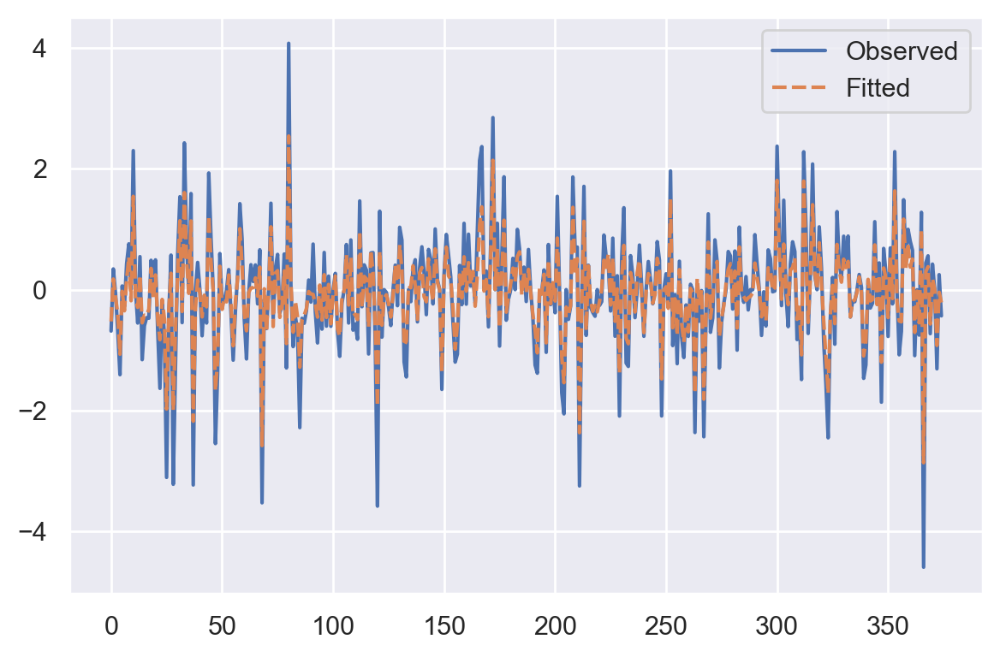

In [232]:
sns.lineplot(data=pd.concat([pd.Series(np.array(train_labels_rf)),
                             pd.Series(np.array(yfit_rf))], 
                             axis = 1))
plt.legend(['Observed', 'Fitted'])
plt.tight_layout()
plt.show()

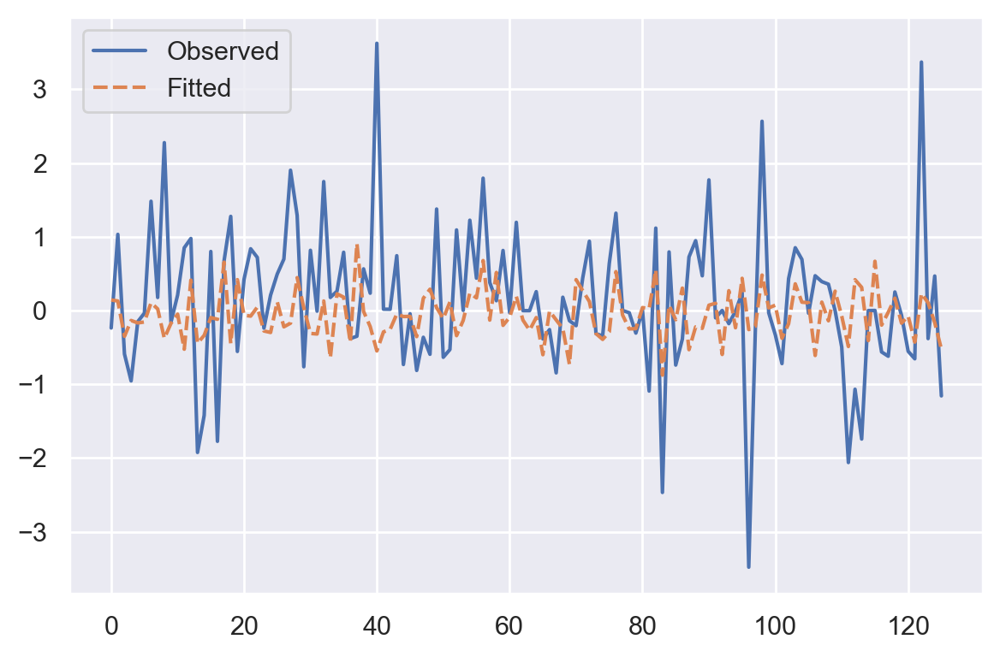

In [233]:
sns.lineplot(data=pd.concat([pd.Series(np.array(test_labels_rf)),
                             pd.Series(np.array(yhat_rf))], 
                             axis = 1))
plt.legend(['Observed', 'Fitted'])
plt.tight_layout()
plt.show()

In [234]:
# Get numerical feature importances
importances = list(rf.feature_importances_)
# List of tuples with variable and importance
feature_importances = [(feature, round(importance, 2)) for feature, importance in zip(list(X_rf.columns), importances)]
# Sort the feature importances by most important first
feature_importances = sorted(feature_importances, key = lambda x: x[1], reverse = True)
# Print out the feature and importances 
[print('Variable: {:20} Importance: {}'.format(*pair)) for pair in feature_importances];

Variable: OILPRICEx            Importance: 0.07
Variable: M2REAL               Importance: 0.04
Variable: CPIULFSL             Importance: 0.04
Variable: CPIAUCSL             Importance: 0.03
Variable: UMCSENTx             Importance: 0.03
Variable: IPFUELS              Importance: 0.02
Variable: NDMANEMP             Importance: 0.02
Variable: USWTRADE             Importance: 0.02
Variable: NONBORRES            Importance: 0.02
Variable: CP3Mx                Importance: 0.02
Variable: BAA                  Importance: 0.02
Variable: W875RX1              Importance: 0.01
Variable: DPCERA3M086SBEA      Importance: 0.01
Variable: CMRMTSPLx            Importance: 0.01
Variable: RETAILx              Importance: 0.01
Variable: IPNCONGD             Importance: 0.01
Variable: IPNMAT               Importance: 0.01
Variable: IPMANSICS            Importance: 0.01
Variable: CUMFNS               Importance: 0.01
Variable: HWI                  Importance: 0.01
Variable: HWIURATIO            Importanc

### Test R with Python

In [235]:
df_cpi_t_norm_L1 = df_cpi_t_norm.shift(-1).dropna()
x1 = FloatVector(df_cpi_t_norm_L1)
x = FloatVector(df_cpi_t_norm[df_cpi_t_norm_L1.index])

In [236]:
ts=robjects.r('ts')

In [237]:
x1 = ts(x)
x = ts(x)

In [238]:
res = r.lm(r("y ~ x"), data = r['data.frame'](x=x1, y=x))

In [239]:
r['coefficients'](res)

array([-9.69739904e-21,  1.00000000e+00])

### ARFIMA

In [240]:
x = FloatVector(df_cpi_t_norm)

In [241]:
importr('forecast')

rpy2.robjects.packages.Package as a <module 'forecast'>

In [242]:
ts=robjects.r('ts')

In [243]:
x = ts(x)

In [244]:
res = r['arfima'](x)

In [245]:
r['names'](res)

array(['log.likelihood', 'n', 'msg', 'd', 'ar', 'ma', 'covariance.dpq',
       'fnormMin', 'sigma', 'stderror.dpq', 'correlation.dpq', 'h',
       'd.tol', 'M', 'hessian.dpq', 'length.w', 'residuals', 'fitted',
       'call', 'x', 'series'], dtype='<U15')

In [246]:
# rx2 recovers attributes
res.rx2('d')

array([4.58301292e-05])

### BART

In [247]:
X_bart = df_FRED_MD_t_norm_ex_nan_L1
X_bart = X_rf.dropna()
y_bart = df_cpi_t_norm[X_rf.index]

In [248]:
importr('BayesTree')

rpy2.robjects.packages.Package as a <module 'BayesTree'>

In [249]:
rb = r['bart'](X_bart,y_bart)



Running BART with numeric y

number of trees: 200
Prior:
	k: 2.000000
	degrees of freedom in sigma prior: 3
	quantile in sigma prior: 0.900000
	power and base for tree prior: 2.000000 0.950000
	use quantiles for rule cut points: 0
data:
	number of training observations: 501
	number of test observations: 0
	number of explanatory variables: 134


Cutoff rules c in x<=c vs x>c
Number of cutoffs: (var: number of possible c):
(1: 100) (2: 100) (3: 100) (4: 100) (5: 100) 
(6: 100) (7: 100) (8: 100) (9: 100) (10: 100) 
(11: 100) (12: 100) (13: 100) (14: 100) (15: 100) 
(16: 100) (17: 100) (18: 100) (19: 100) (20: 100) 
(21: 100) (22: 100) (23: 100) (24: 100) (25: 100) 
(26: 100) (27: 100) (28: 100) (29: 100) (30: 100) 
(31: 100) (32: 100) (33: 100) (34: 100) (35: 100) 
(36: 100) (37: 100) (38: 100) (39: 100) (40: 100) 
(41: 100) (42: 100) (43: 100) (44: 100) (45: 100) 
(46: 100) (47: 100) (48: 100) (49: 100) (50: 100) 
(51: 100) (52: 100) (53: 100) (54: 100) (55: 100) 
(56: 100) (57: 100) (

In [277]:
r['names'](rb)

array(['call', 'first.sigma', 'sigma', 'sigest', 'yhat.train',
       'yhat.train.mean', 'yhat.test', 'yhat.test.mean', 'varcount', 'y'],
      dtype='<U15')

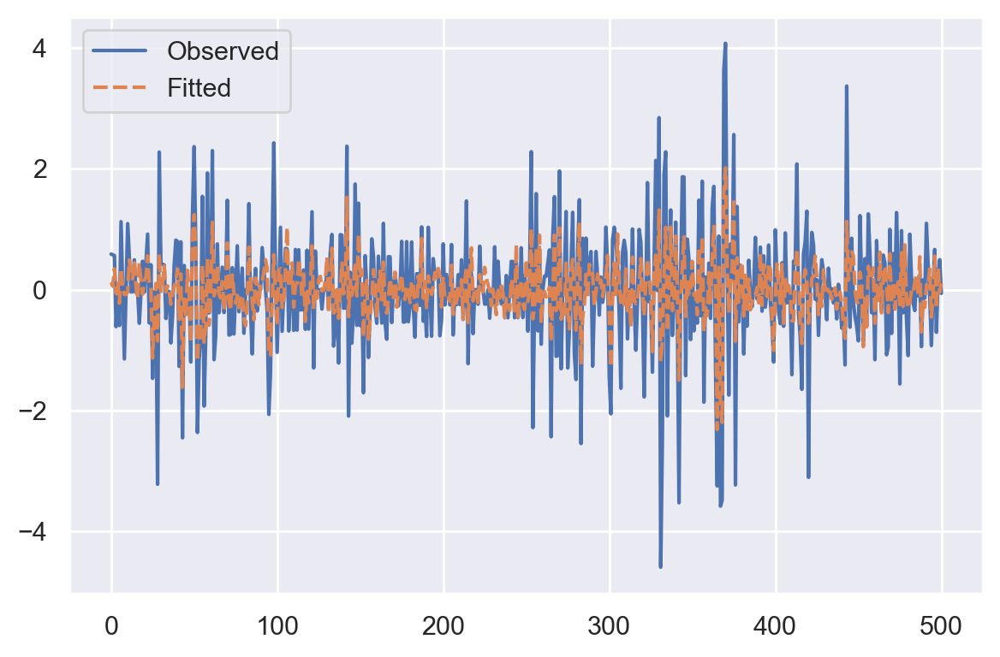

In [283]:
sns.lineplot(data=pd.concat([pd.Series(np.array(y_bart)),
                             pd.Series(np.array(rb.rx2['yhat.train.mean']))], 
                             axis = 1))
plt.legend(['Observed', 'Fitted'])
plt.tight_layout()
plt.show()

In [250]:
r['plot'](rb)

<rpy2.rinterface_lib.sexp.NULLType object at 0x00000287DE9C5908> [RTYPES.NILSXP]

In [275]:
grdevices = importr('grDevices')

In [276]:
grdevices.dev_off()

array([1], dtype=int32)

### Bagging

In [290]:
X_bagging = df_FRED_MD_t_norm_ex_nan_L1
X_bagging = X_rf.dropna()
y_bagging = df_cpi_t_norm[X_rf.index]

In [285]:
bg_model = BaggingRegressor()

In [291]:
cv = RepeatedKFold(n_splits=10, n_repeats=3, random_state=1)
n_scores = cross_val_score(bg_model, X_bagging, y_bagging, 
                           scoring='neg_mean_absolute_error', 
                           cv=cv, 
                           n_jobs=-1, 
                           error_score='raise')

In [293]:
print('MAE: %.3f (%.3f)' % (np.mean(n_scores), np.std(n_scores)))

MAE: -0.753 (0.111)


In [294]:
# fit the model on the whole dataset
bg_model.fit(X_bagging, y_bagging)

BaggingRegressor(base_estimator=None, bootstrap=True, bootstrap_features=False,
                 max_features=1.0, max_samples=1.0, n_estimators=10,
                 n_jobs=None, oob_score=False, random_state=None, verbose=0,
                 warm_start=False)

In [296]:
yhat = bg_model.predict(X_bagging)

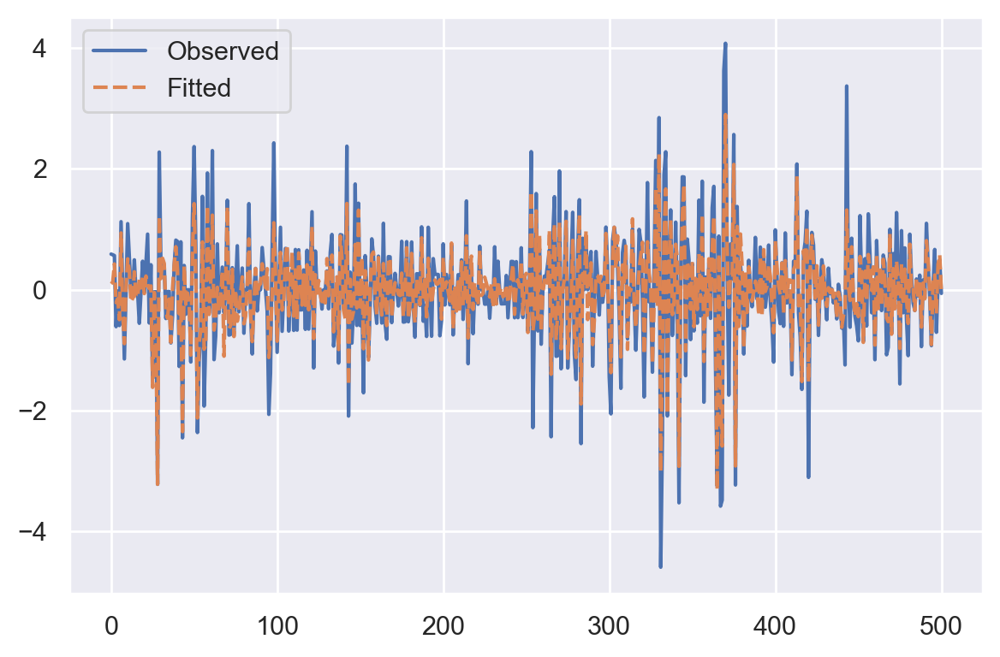

In [297]:
sns.lineplot(data=pd.concat([pd.Series(np.array(y_bagging)),
                             pd.Series(np.array(yhat))], 
                             axis = 1))
plt.legend(['Observed', 'Fitted'])
plt.tight_layout()
plt.show()

### Bayesian VAR

In [ ]:
X_bvar = df_FRED_MD_t_norm_ex_nan
y_bvar = df_cpi_t_norm

In [ ]:
importr('BVAR')

### Complete Subset Regression (CSR)

Idea: suppose we have n candidate variables. Select a number q < n of variables and run regressions using all possible combinations C(n,q). The final forecast is the average over all forecasts.

Medeiros starts fitting a regression of inflation against each of the n variables, saving the t-statistics. The t-statistics are ranked by absolute value, and a predefined number of the most relevant variables are selected.

### Jackknife Model Averaging (JMA)

Uses leave-one-out cross-validation to estimate optimal weights when combining forecasts from different models.

### Kalman Filter

In [450]:
X_kf = np.array(df_FRED_MD_t_norm_ex_nan_L1)
y_kf = np.array(df_cpi_t_norm)
n_features = X_kf.shape[1]

In [454]:
state_means, state_covs, kf = KFReg(X_kf, y_kf, delta = 1e-2, obs_cov = np.array(0.25), 
      init_mean = np.zeros(n_features), init_cov = np.eye(n_features), 
      EM = True)

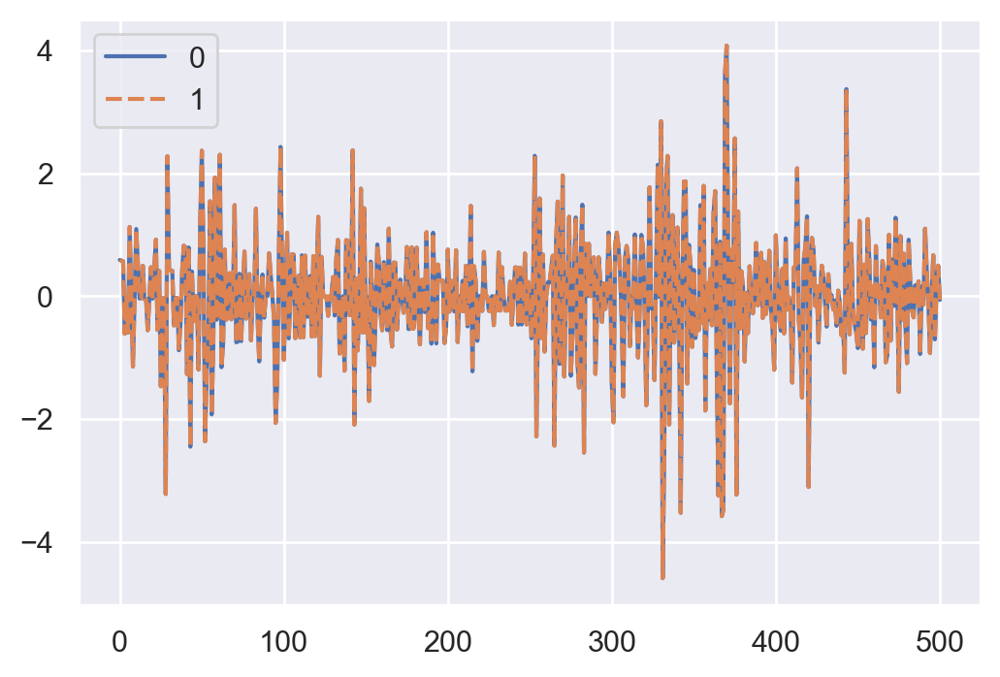

In [455]:
sns.lineplot(data=[y_kf,np.diag(np.matmul(X_kf, state_means.T))])